# Setup

In [ ]:
%pip install torch-geometric
%pip install pynvml

In [1]:
import os
import math
import time
import copy
import psutil
import pynvml
import random
import numpy as np
import networkx as nx

import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.nn.utils as nn_utils
import torch_geometric.utils as utils
from torch_geometric.utils import to_networkx
from torch_geometric.nn import GCNConv, global_mean_pool
from torch_geometric.datasets import TUDataset, Planetoid
from torch_geometric.loader import DataLoader
from torch_geometric.data import Data

from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import confusion_matrix, mean_absolute_error, jaccard_score

from scipy.linalg import norm
from scipy.sparse.linalg import eigsh
from scipy.sparse import csgraph


if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
else:
    device = torch.device("cpu")
print(f'using {device}')

def set_seed(random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)
    torch.manual_seed(random_seed)

set_seed(42)

using cuda


# Data Preprocessing

In [2]:
# dataset_path = '/Users/gitaayusalsabila/Documents/0thesis/code/sandbox/dataset/'
dataset_path = '/notebooks/dataset/'


def data_cleansing(dataset):
    # Replace negative values with 0
    dataset[dataset < 0] = 0
    
    # Replace NaN values with 0
    dataset = np.nan_to_num(dataset, nan=0)
    
    return dataset

def check_and_drop_invalid_graphs(graph_dataset):
    num_graphs, num_timepoints, num_nodes, _ = graph_dataset.shape
    num_dimensions = 1
    
    valid_graphs = []

    for i in range(num_graphs):
        is_valid = True
        for t in range(num_timepoints):
            adj_matrix = graph_dataset[i, t, :, :]
            num_edges = np.sum(adj_matrix > 0)
            if num_edges == 0:
                is_valid = False
                break
        
        if is_valid:
            valid_graphs.append(i)
    
    cleaned_dataset = graph_dataset[valid_graphs, :, :, :]
    
    return cleaned_dataset

def split_data(adj_data, features_data, train_ratio=0.7, val_ratio=0.1, test_ratio=0.2, random_seed=None):
    assert adj_data.shape[0] == features_data.shape[0], "Adjacency and features data must have the same number of samples"
    assert np.isclose(train_ratio + val_ratio + test_ratio, 1.0), "The sum of train, val and test ratios must be 1"

    num_samples = adj_data.shape[0]
    indices = np.arange(num_samples)
    if random_seed is not None:
        np.random.seed(random_seed)
    np.random.shuffle(indices)

    train_end = int(train_ratio * num_samples)
    val_end = train_end + int(val_ratio * num_samples)

    train_indices = indices[:train_end]
    val_indices = indices[train_end:val_end]
    test_indices = indices[val_end:]

    adj_train = torch.tensor(adj_data[train_indices], dtype=torch.float32)
    adj_val = torch.tensor(adj_data[val_indices], dtype=torch.float32)
    adj_test = torch.tensor(adj_data[test_indices], dtype=torch.float32)

    features_train = torch.tensor(features_data[train_indices], dtype=torch.float32)
    features_val = torch.tensor(features_data[val_indices], dtype=torch.float32)
    features_test = torch.tensor(features_data[test_indices], dtype=torch.float32)

    return adj_train, adj_val, adj_test, features_train, features_val, features_test


In [3]:
## Simulated Dataset
simulated_adj = np.load(dataset_path + 'simulated_adj.npy')
simulated_adj = simulated_adj[:, :, :, :,0] #only take the domain 1
simulated_features = np.load(dataset_path + 'simulated_laplacian_features.npy')
simulated_features = simulated_features[:, :, :, :,0]
simulated_num_samples, simulated_num_time, simulated_num_nodes, simulated_num_features = simulated_features.shape 
print(f'Simulated Dataset: Number of Samples= {simulated_num_samples},  Number of Times= {simulated_num_time}, Number of Nodes= {simulated_num_nodes}, Number of Features= {simulated_num_features}')
simulated_adj_train, simulated_adj_val, simulated_adj_test, simulated_features_train, simulated_features_val, simulated_features_test = split_data(simulated_adj, simulated_features)

## OASIS Dataset
oasis = np.load(dataset_path + 'oasis_adj.npy')
oasis_cleaned = data_cleansing(oasis)
oasis_adj = check_and_drop_invalid_graphs(oasis_cleaned)
oasis_features = np.load(dataset_path + 'oasis_laplacian_features.npy') 
oasis_num_samples, oasis_num_time, oasis_num_nodes, oasis_num_features = oasis_features.shape 
print(f'OASIS Dataset: Number of Samples= {oasis_num_samples},  Number of Times= {oasis_num_time}, Number of Nodes= {oasis_num_nodes}, Number of Features= {oasis_num_features}')
oasis_adj_train, oasis_adj_val, oasis_adj_test, oasis_features_train, oasis_features_val, oasis_features_test = split_data(oasis_adj, oasis_features)

## EMCI-AD Dataset
emci = np.load(dataset_path + 'emci-ad_adj.npy')
emci_cleaned = data_cleansing(emci)
emci_adj = check_and_drop_invalid_graphs(emci_cleaned)
emci_features = np.load(dataset_path + 'emci-ad_laplacian_features.npy') 
emci_num_samples, emci_num_time, emci_num_nodes, emci_num_features = emci_features.shape 
print(f'EMCI-AD Dataset: Number of Samples= {emci_num_samples},  Number of Times= {emci_num_time}, Number of Nodes= {emci_num_nodes}, Number of Features= {emci_num_features}')
emci_adj_train, emci_adj_val, emci_adj_test, emci_features_train, emci_features_val, emci_features_test = split_data(emci_adj, emci_features)

## SLIM160 Dataset
slim160 = np.load(dataset_path + 'slim160_adj.npy')
slim160_cleaned = data_cleansing(slim160)
slim160_adj = check_and_drop_invalid_graphs(slim160_cleaned)
slim160_features = np.load(dataset_path + 'slim160_laplacian_features_8.npy') 
slim160_num_samples, slim160_num_time, slim160_num_nodes, slim160_num_features = slim160_features.shape 
print(f'SLIM160 Dataset: Number of Samples= {slim160_num_samples},  Number of Times= {slim160_num_time}, Number of Nodes = {slim160_num_nodes}, Number of Features = {slim160_num_features}')
slim160_adj_train, slim160_adj_val, slim160_adj_test, slim160_features_train, slim160_features_val, slim160_features_test = split_data(slim160_adj, slim160_features)

Simulated Dataset: Number of Samples= 100,  Number of Times= 3, Number of Nodes= 35, Number of Features= 8
OASIS Dataset: Number of Samples= 114,  Number of Times= 3, Number of Nodes= 35, Number of Features= 8
EMCI-AD Dataset: Number of Samples= 67,  Number of Times= 2, Number of Nodes= 35, Number of Features= 8
SLIM160 Dataset: Number of Samples= 109,  Number of Times= 3, Number of Nodes = 160, Number of Features = 8


# Models

In [4]:
class GAT(nn.Module):
    def __init__(self, in_features, out_features, activation=F.relu):
        super(GAT, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = nn.Parameter(torch.FloatTensor(in_features, out_features))
        self.bias = nn.Parameter(torch.zeros(out_features))
        self.phi = nn.Parameter(torch.FloatTensor(2 * out_features, 1))
        self.activation = activation
        self.reset_parameters()
        self.drop = nn.Dropout(p=0.5)
 
    def reset_parameters(self):
        stdv = 1. / np.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
 
        stdv = 1. / np.sqrt(self.phi.size(1))
        self.phi.data.uniform_(-stdv, stdv)
 
    def forward(self, input, adj):
        input = self.drop(input)
        h = torch.mm(input, self.weight.to(device)) + self.bias.to(device) 
 
        N = input.size(0) 
        h_expand = h.unsqueeze(1).expand(N, N, -1)
        h_t_expand = h.unsqueeze(0).expand(N, N, -1)
        
        concat_features = torch.cat([h_expand, h_t_expand], dim=-1)
        
        S = torch.matmul(concat_features, self.phi).squeeze(-1)
 
        mask = (adj + torch.eye(adj.size(0)).to(device)).bool()
        S_masked = torch.where(mask, S, torch.tensor(-9e15, dtype=S.dtype))
        attention_weights = F.softmax(S_masked, dim=1)
        h = torch.matmul(attention_weights, h)
        return self.activation(h) if self.activation else h
    
    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'


##GCN Transformer
class GCN(nn.Module):
    def __init__(self, in_features, out_features, bias=True):
        super(GCN, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = nn.Parameter(torch.FloatTensor(in_features, out_features))
        if bias:
            self.bias = nn.Parameter(torch.FloatTensor(out_features))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters() 

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)
        output = torch.spmm(adj, support)
        if self.bias is not None:
            return output + self.bias
        else:
            return output

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'

class GCNEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, num_nodes):
        super(GCNEncoder, self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        
        self.gat = GAT(self.input_dim, self.hidden_dim) 
        self.bn0 = nn.BatchNorm1d(self.hidden_dim)
        self.gcn1 = GCN(self.hidden_dim, 2*self.hidden_dim)
        self.bn1 = nn.BatchNorm1d(2*self.hidden_dim)
        self.gcn2 = GCN(2*self.hidden_dim, self.latent_dim)
        self.bn2 = nn.BatchNorm1d(self.latent_dim)
        
        self.fc = nn.Linear(self.latent_dim * num_nodes, self.latent_dim)

    def forward(self, x, adj):
        x = F.relu(self.bn0(self.gat(x, adj)))
        x = F.relu(self.bn1(self.gcn1(x, adj)))
        x = F.relu(self.bn2(self.gcn2(x, adj)))
        x = F.dropout(x, training=self.training)
        x_flat = x.view(-1)
        z = self.fc(x_flat)
        
        return z

class GCNDecoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, num_nodes):
        super(GCNDecoder, self).__init__()
        self.latent_dim = latent_dim
        self.num_nodes = num_nodes
        self.hidden_dim = hidden_dim
        
        self.fc = nn.Linear(self.latent_dim,  self.num_nodes * self.latent_dim)
        self.bn0 = nn.BatchNorm1d(self.latent_dim)

        self.gcn1 = GCN(self.latent_dim, self.hidden_dim)
        self.bn1 = nn.BatchNorm1d(self.hidden_dim)
        self.gcn2 = GCN(self.hidden_dim, self.num_nodes)
        self.bn2 = nn.BatchNorm1d(self.num_nodes)


    def forward(self, z):
        x = self.bn0(self.fc(z).view(self.num_nodes, self.latent_dim))
        adj = torch.eye(self.num_nodes, device=z.device)
        
        x = F.relu(self.bn1(self.gcn1(x, adj)))
        x = F.relu(self.bn2(self.gcn2(x, adj)))

        adj_pred = (x + x.t()) / 2
        adj_pred = adj_pred - torch.diag(torch.diag(adj_pred))
        return adj_pred

class GCNTransformer(nn.Module):
    def __init__(self, num_nodes, input_dim, latent_dim, encoder_hidden_dims, decoder_hidden_dims):
        super(GCNTransformer, self).__init__()
        self.encoder = GCNEncoder(input_dim, encoder_hidden_dims, latent_dim, num_nodes)
        self.decoder = GCNDecoder(latent_dim, decoder_hidden_dims, num_nodes)  

    def forward(self, x, adj):
        # Encoding
        z = self.encoder(x, adj)

        # Decoding
        adj_pred = self.decoder(z)
        
        return adj_pred, z
    
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)


##GCESN Transformer
class GCESNEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, num_nodes, 
                leaky_rate=1, num_iterations=1):
        super(GCESNEncoder, self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        
        self.spectral_radius = 0.9
        self.leaky_rate1 = leaky_rate
        self.leaky_rate2 = leaky_rate - 0.1
        self.num_iterations = num_iterations

        self.gat = GAT(self.input_dim, self.hidden_dim)
        self.bn0 = nn.BatchNorm1d(self.hidden_dim) 
        self.fc1 = nn.Linear(self.hidden_dim, 2*self.hidden_dim)
        self.fc2 = nn.Linear(2*self.hidden_dim, self.latent_dim)
        
        self.fc = nn.Linear(self.latent_dim * num_nodes, self.latent_dim)

    def initialize_weights(self):
        self.W_1 = nn.Parameter(torch.rand((self.hidden_dim, self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.W_2 = nn.Parameter(torch.rand((2*self.hidden_dim, 2*self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.adjust_spectral_radius()
        
    def adjust_spectral_radius(self):
        eigenvalues_1, _ = torch.linalg.eig(self.W_1)
        rhoW_1 = max(abs(eigenvalues_1))
        self.W_1 *= self.spectral_radius / rhoW_1

        eigenvalues_2, _ = torch.linalg.eig(self.W_2)
        rhoW_2 = max(abs(eigenvalues_2))
        self.W_2 *= self.spectral_radius / rhoW_2

    def forward(self, x, adj): 
 
        h = F.relu(self.bn0(self.gat(x, adj)))
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate1)*h + self.leaky_rate1*(F.relu(torch.mm(adj, torch.mm(h, self.W_1))))
        h = self.fc1(h)
        
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate2)*h + self.leaky_rate2*(F.relu(torch.mm(adj, torch.mm(h, self.W_2))))
        h = self.fc2(h)

        h_flat = h.view(-1)
        z = self.fc(h_flat)
        return z

class GCESNDecoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, num_nodes,
                leaky_rate=1, num_iterations=1, ridge_alpha1=0.9, ridge_alpha2=0.7):
        super(GCESNDecoder, self).__init__()
        self.latent_dim = latent_dim
        self.hidden_dim = hidden_dim
        self.num_nodes = num_nodes
        
        self.fc = nn.Linear(self.latent_dim,  self.num_nodes * self.latent_dim)
        self.bn0 = nn.BatchNorm1d(self.latent_dim)

        self.leaky_rate1 = leaky_rate
        self.leaky_rate2 = leaky_rate
        self.num_iterations = num_iterations
        self.spectral_radius = 0.9
        self.fc1 = nn.Linear(self.latent_dim, self.hidden_dim)
        self.fc2 = nn.Linear(self.hidden_dim, self.num_nodes)
        
    def initialize_weights(self):
        self.W_1 = nn.Parameter(torch.rand((self.latent_dim, self.latent_dim)) * 2 - 1, requires_grad=False)
        self.W_2 = nn.Parameter(torch.rand((self.hidden_dim, self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.adjust_spectral_radius()
        
    def adjust_spectral_radius(self):
        eigenvalues_1, _ = torch.linalg.eig(self.W_1)
        rhoW_1 = max(abs(eigenvalues_1))
        self.W_1 *= self.spectral_radius / rhoW_1

        eigenvalues_2, _ = torch.linalg.eig(self.W_2)
        rhoW_2 = max(abs(eigenvalues_2))
        self.W_2 *= self.spectral_radius / rhoW_2

    def forward(self, z):
        h = self.bn0(self.fc(z).view(self.num_nodes, self.latent_dim))
        adj = torch.eye(self.num_nodes, device=z.device)

        # h = torch.mm(h, self.Win)
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate1)*h + self.leaky_rate1*(F.relu(torch.mm(adj, torch.mm(h, self.W_1))))
        h = self.fc1(h)
        
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate2)*h + self.leaky_rate2*(F.relu(torch.mm(adj, torch.mm(h, self.W_2))))
        h = self.fc2(h)

        adj_pred = (h + h.t()) / 2
        adj_pred = adj_pred - torch.diag(torch.diag(adj_pred))
        return adj_pred

class GCESNTransformer(nn.Module):
    def __init__(self, num_nodes, input_dim, latent_dim, 
                encoder_hidden_dims, encoder_leaky_rate, encoder_iteration,
                decoder_hidden_dims, decoder_leaky_rate, decoder_iteration):
        super(GCESNTransformer, self).__init__()
        self.encoder = GCESNEncoder(input_dim, encoder_hidden_dims, latent_dim, num_nodes, 
                                    encoder_leaky_rate, encoder_iteration)
        self.decoder = GCESNDecoder(latent_dim, decoder_hidden_dims, num_nodes,
                                    decoder_leaky_rate, decoder_iteration)  
    
    def initialize_weights(self):
        self.encoder.initialize_weights()
        self.decoder.initialize_weights() 

    def forward(self, x, adj):
        # Encoding
        z = self.encoder(x, adj)
        
        # Decoding
        adj_pred = self.decoder(z)
        
        return adj_pred, z
    
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)


##TrainableGCESN Transformer
class SpectralRadiusOptimizerHook:
    def __init__(self, model):
        self.model = model

    def __call__(self):
        self.model.adjust_spectral_radius()
        
class trainableGCESNEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, num_nodes, 
                leaky_rate=1, num_iterations=1):
        super(trainableGCESNEncoder, self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        
        self.spectral_radius = 0.9
        self.leaky_rate1 = leaky_rate
        self.leaky_rate2 = leaky_rate - 0.1
        self.num_iterations = num_iterations
        self.W_1 = nn.Parameter(torch.rand((self.hidden_dim, self.hidden_dim)) * 2 - 1)
        self.W_2 = nn.Parameter(torch.rand((2*self.hidden_dim, 2*self.hidden_dim)) * 2 - 1)
        self.adjust_spectral_radius()

        self.gat = GAT(self.input_dim, self.hidden_dim)
        self.bn0 = nn.BatchNorm1d(self.hidden_dim) 
        self.fc1 = nn.Linear(self.hidden_dim, 2*self.hidden_dim)
        self.fc2 = nn.Linear(2*self.hidden_dim, self.latent_dim)
        
        self.fc = nn.Linear(self.latent_dim * num_nodes, self.latent_dim)
        
        
    def adjust_spectral_radius(self):
        if torch.isnan(self.W_1).any() or torch.isinf(self.W_1).any():
            self.W_1.data = torch.where(torch.isnan(self.W_1) | torch.isinf(self.W_1), torch.tensor(0.0, device=self.W_1.device), self.W_1.data)

        eigenvalues_1, _ = torch.linalg.eig(self.W_1)
        rhoW_1 = max(abs(eigenvalues_1))
        self.W_1.data *= self.spectral_radius / rhoW_1

        if torch.isnan(self.W_2).any() or torch.isinf(self.W_2).any():
            self.W_2.data = torch.where(torch.isnan(self.W_2) | torch.isinf(self.W_2), torch.tensor(0.0, device=self.W_2.device), self.W_2.data)

        eigenvalues_2, _ = torch.linalg.eig(self.W_2)
        rhoW_2 = max(abs(eigenvalues_2))
        self.W_2.data *= self.spectral_radius / rhoW_2

    def forward(self, x, adj): 
        h = F.relu(self.bn0(self.gat(x, adj)))
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate1)*h + self.leaky_rate1*(F.relu(torch.mm(adj, torch.mm(h, self.W_1))))
        h = self.fc1(h)
        
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate2)*h + self.leaky_rate2*(F.relu(torch.mm(adj, torch.mm(h, self.W_2))))
        h = self.fc2(h)

        h_flat = h.view(-1)
        z = self.fc(h_flat)
        return z

class trainableGCESNDecoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, num_nodes,
                leaky_rate=1, num_iterations=1):
        super(trainableGCESNDecoder, self).__init__()
        self.latent_dim = latent_dim
        self.hidden_dim = hidden_dim
        self.num_nodes = num_nodes
        
        self.fc = nn.Linear(self.latent_dim,  self.num_nodes * self.latent_dim)
        self.bn0 = nn.BatchNorm1d(self.latent_dim)

        self.leaky_rate1 = leaky_rate
        self.leaky_rate2 = leaky_rate - 0.1
        self.num_iterations = num_iterations
        self.spectral_radius = 0.9
        self.W_1 = nn.Parameter(torch.rand((self.latent_dim, self.latent_dim)) * 2 - 1)
        self.W_2 = nn.Parameter(torch.rand((self.hidden_dim, self.hidden_dim)) * 2 - 1)
        self.adjust_spectral_radius()
        self.fc1 = nn.Linear(self.latent_dim, self.hidden_dim)
        self.fc2 = nn.Linear(self.hidden_dim, self.num_nodes)
        

    def adjust_spectral_radius(self):
        if torch.isnan(self.W_1).any() or torch.isinf(self.W_1).any():
            self.W_1.data = torch.where(torch.isnan(self.W_1) | torch.isinf(self.W_1), torch.tensor(0.0, device=self.W_1.device), self.W_1.data)

        eigenvalues_1, _ = torch.linalg.eig(self.W_1)
        rhoW_1 = max(abs(eigenvalues_1))
        self.W_1.data *= self.spectral_radius / rhoW_1

        if torch.isnan(self.W_2).any() or torch.isinf(self.W_2).any():
            self.W_2.data = torch.where(torch.isnan(self.W_2) | torch.isinf(self.W_2), torch.tensor(0.0, device=self.W_2.device), self.W_2.data)

        eigenvalues_2, _ = torch.linalg.eig(self.W_2)
        rhoW_2 = max(abs(eigenvalues_2))
        self.W_2.data *= self.spectral_radius / rhoW_2

    def forward(self, z):
        h = self.bn0(self.fc(z).view(self.num_nodes, self.latent_dim))
        adj = torch.eye(self.num_nodes, device=z.device)

        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate1)*h + self.leaky_rate1*(F.relu(torch.mm(adj, torch.mm(h, self.W_1))))
        h = self.fc1(h)
        
        for _ in range(self.num_iterations):
            h = (1-self.leaky_rate2)*h + self.leaky_rate2*(F.relu(torch.mm(adj, torch.mm(h, self.W_2))))
        h = self.fc2(h)

        adj_pred = (h + h.t()) / 2
        adj_pred = adj_pred - torch.diag(torch.diag(adj_pred))
        return adj_pred

class trainableGCESNTransformer(nn.Module):
    def __init__(self, num_nodes, input_dim, latent_dim, 
                encoder_hidden_dims, encoder_leaky_rate, encoder_iteration,
                decoder_hidden_dims, decoder_leaky_rate, decoder_iteration):
        super(trainableGCESNTransformer, self).__init__()
        self.encoder = trainableGCESNEncoder(input_dim, encoder_hidden_dims, latent_dim, num_nodes, 
                                    encoder_leaky_rate, encoder_iteration)
        self.decoder = trainableGCESNDecoder(latent_dim, decoder_hidden_dims, num_nodes,
                                    decoder_leaky_rate, decoder_iteration)  
    def adjust_spectral_radius(self):
        self.encoder.adjust_spectral_radius()
        self.decoder.adjust_spectral_radius()

    def forward(self, x, adj):
        # Encoding
        z = self.encoder(x, adj)
        
        # Decoding
        adj_pred = self.decoder(z)
        
        return adj_pred, z
    
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)


##DecoupledGCESN Transformer
class decoupledGCESN_Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim, num_nodes, 
                leaky_rate=0.9, num_iterations=1, ridge_alpha=0.9):
        super(decoupledGCESN_Encoder, self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        
        self.spectral_radius = 0.9
        self.leaky_rate = leaky_rate
        self.num_iterations = num_iterations

        self.gat = GAT(self.input_dim, self.hidden_dim) 
        self.bn0 = nn.BatchNorm1d(self.hidden_dim)

        
        self.gcn1 = GCN(self.hidden_dim, 2*self.hidden_dim)
        self.bn1 = nn.BatchNorm1d(2*self.hidden_dim)    
        self.gcn2 = GCN(2*self.hidden_dim, self.latent_dim)
        self.bn2 = nn.BatchNorm1d(self.latent_dim)
        self.ridge_layer = RidgeLayer(self.hidden_dim, self.latent_dim, ridge_alpha)
    
        self.fc = nn.Linear(self.latent_dim * num_nodes, self.latent_dim)

    def initialize_weights(self):
        self.Win_1 = nn.Parameter(torch.rand((2*self.hidden_dim, self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.W_1   = nn.Parameter(torch.rand((self.hidden_dim, self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.Win_2 = nn.Parameter(torch.rand((self.latent_dim, self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.W_2   = nn.Parameter(torch.rand((self.hidden_dim, self.hidden_dim)) * 2 - 1, requires_grad=False)
        self.adjust_spectral_radius()
        
    def adjust_spectral_radius(self):
        eigenvalues_1, _ = torch.linalg.eig(self.W_1)
        rhoW_1 = max(abs(eigenvalues_1))
        self.W_1 *= self.spectral_radius / rhoW_1

        eigenvalues_2, _ = torch.linalg.eig(self.W_2)
        rhoW_2 = max(abs(eigenvalues_2))
        self.W_2 *= self.spectral_radius / rhoW_2
        
    def forward(self, x, adj):
        x = F.relu(self.bn0(self.gat(x, adj)))
        state = x
        h = x
        
        h = F.relu(self.gcn1(h, adj))
        for _ in range(self.num_iterations):
            state = (1-self.leaky_rate)*state + self.leaky_rate*(torch.relu(torch.mm(h, self.Win_1) + torch.mm(state, self.W_1)))

        
        h = F.relu(self.gcn2(h, adj))
        for _ in range(self.num_iterations):
            state = (1-self.leaky_rate)*state + self.leaky_rate*(torch.relu(torch.mm(h, self.Win_2) + torch.mm(state, self.W_2)))
        state = self.ridge_layer(state)

        h = state
        h_flat = h.view(-1)
        z = self.fc(h_flat)
        return z

class decoupledGCESN_Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, num_nodes, 
                leaky_rate=0.9, num_iterations=1, ridge_alpha=0.9):
        super(decoupledGCESN_Decoder, self).__init__()
        self.latent_dim = latent_dim
        self.num_nodes = num_nodes
        self.hidden_dim = hidden_dim

        self.spectral_radius = 0.9
        self.leaky_rate = leaky_rate
        self.num_iterations = num_iterations
        
        self.fc = nn.Linear(self.latent_dim,  self.num_nodes * self.latent_dim)
        self.bn0 = nn.BatchNorm1d(self.latent_dim)

        
        self.gcn1 = GCN(self.latent_dim, self.hidden_dim)
        self.bn1 = nn.BatchNorm1d(self.hidden_dim)        
        self.gcn2 = GCN(self.hidden_dim, self.num_nodes)
        self.bn2 = nn.BatchNorm1d(self.num_nodes)
        self.ridge_layer = RidgeLayer(self.latent_dim, num_nodes, ridge_alpha)
        
        
    def initialize_weights(self):
        self.Win_1 = nn.Parameter(torch.rand((self.hidden_dim, self.latent_dim)) * 2 - 1, requires_grad=False)
        self.W_1   = nn.Parameter(torch.rand((self.latent_dim, self.latent_dim)) * 2 - 1, requires_grad=False)
        self.Win_2 = nn.Parameter(torch.rand((self.num_nodes, self.latent_dim)) * 2 - 1, requires_grad=False)
        self.W_2   = nn.Parameter(torch.rand((self.latent_dim, self.latent_dim)) * 2 - 1, requires_grad=False)
        self.adjust_spectral_radius()
        
    def adjust_spectral_radius(self):
        eigenvalues_1, _ = torch.linalg.eig(self.W_1)
        rhoW_1 = max(abs(eigenvalues_1))
        self.W_1 *= self.spectral_radius / rhoW_1

        eigenvalues_2, _ = torch.linalg.eig(self.W_2)
        rhoW_2 = max(abs(eigenvalues_2))
        self.W_2 *= self.spectral_radius / rhoW_2
        
    def forward(self, z):
        x = self.bn0(self.fc(z).view(self.num_nodes, self.latent_dim))
        adj = torch.eye(self.num_nodes, device=z.device)

        state = x
        h = x

        h = F.relu(self.gcn1(h, adj))
        for _ in range(self.num_iterations):
            state = (1-self.leaky_rate)*state + self.leaky_rate*(torch.relu(torch.mm(h, self.Win_1) + torch.mm(state, self.W_1)))

        h = F.relu(self.gcn2(h, adj))
        for _ in range(self.num_iterations):
            state = (1-self.leaky_rate)*state + self.leaky_rate*(torch.relu(torch.mm(h, self.Win_2) + torch.mm(state, self.W_2)))
        state = self.ridge_layer(state)
        
        h = state
        adj_pred = (h + h.t()) / 2
        adj_pred = adj_pred - torch.diag(torch.diag(adj_pred))
        return adj_pred

class decoupledGCESNTransformer(nn.Module):
    def __init__(self, num_nodes, input_dim, latent_dim, 
                encoder_hidden_dims, encoder_leaky_rate, encoder_iteration,
                decoder_hidden_dims, decoder_leaky_rate, decoder_iteration):
        super(decoupledGCESNTransformer, self).__init__()
        self.encoder = decoupledGCESN_Encoder(input_dim, encoder_hidden_dims, latent_dim, num_nodes, 
                                    encoder_leaky_rate, encoder_iteration)
        self.decoder = decoupledGCESN_Decoder(latent_dim, decoder_hidden_dims, num_nodes,
                                    decoder_leaky_rate, decoder_iteration)  
    
    def initialize_weights(self):
        self.encoder.initialize_weights()
        self.decoder.initialize_weights() 

    def forward(self, x, adj):
        # Encoding
        z = self.encoder(x, adj)
        
        # Decoding
        adj_pred = self.decoder(z)
        
        return adj_pred, z
    
    def count_parameters(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

In [5]:
def loss_function(recon_adj, adj, lambda_1=1.0, lambda_2=1.0):
    # Generative loss
    gen_loss = F.l1_loss(recon_adj, adj, reduction='sum')
    
    #Topological loss
    node_strength_recon = torch.sum(recon_adj, dim=1)
    node_strength_gt = torch.sum(adj, dim=1)
    top_loss = F.mse_loss(node_strength_recon, node_strength_gt, reduction='sum')

    fro_loss = torch.norm(recon_adj - adj, p='fro')**2
    
    # Total loss
    loss = (lambda_1 * gen_loss) + (lambda_2 * top_loss) + (1.0*fro_loss)
    return loss, gen_loss, top_loss

# Trainings & Evaluations

In [6]:
## Single Functions
def train(model, train_features, train_adj, val_features, val_adj, 
                lr=0.001, num_epochs=100, patience=5, step_size=50, gamma=0.1, 
                lambda_1=1.0, lambda_2=1.0, save_path='models/gcn_transformer_x.pth',
                is_esn=False):

    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)
    spectral_hook = SpectralRadiusOptimizerHook(model)
    
    training_loss = []
    validation_loss = []

    epoch_time = []
    cpu_usage_percent = []
    memory_usage = []
    gpu_usage = []
    gpu_usage_percent = []

    best_train_loss = float('inf')
    best_val_loss = float('inf')
    epochs_no_improve = 0

    model.to(device)
    process = psutil.Process()

    for epoch in range(num_epochs):
        epoch_loss = 0
        epoch_gen_loss = 0
        epoch_top_loss = 0

        val_loss = 0
        val_gen_loss = 0
        val_top_loss = 0

        set_seed(42)
        model.train()
        epoch_start_time = time.time()

        # Measure CPU and GPU usage before the epoch
        cpu_usage_before = psutil.cpu_percent(interval=None)
        memory_before = process.memory_info().rss
        if torch.cuda.is_available():
            gpu_usage_before = torch.cuda.memory_allocated(device)
            gpu_util_before = torch.cuda.utilization(device)
        else:
            gpu_usage_before = 0
            gpu_util_before = 0

        for i in range(train_features.size(0)):
            for t in range(train_features.size(1) - 1):
                optimizer.zero_grad()
                
                x_t = train_features[i, t].to(device)
                adj_t = train_adj[i, t].to(device)
                adj_t_next = train_adj[i, t+1].to(device)
                
                recon_adj, z = model(x_t, adj_t)
                loss, gen_loss, top_loss = loss_function(recon_adj, adj_t_next, lambda_1, lambda_2)
                loss.backward()
                
                nn_utils.clip_grad_norm_(model.parameters(), max_norm=1.0)  
                
                optimizer.step()
                if is_esn==True:
                    spectral_hook()
                epoch_loss += loss.item()
                epoch_gen_loss += gen_loss.item()
                epoch_top_loss += top_loss.item()
        
        scheduler.step()  

        epoch_end_time = time.time()
        epoch_time.append(epoch_end_time - epoch_start_time)
        
        # Measure CPU and GPU usage after the epoch
        cpu_usage_after = psutil.cpu_percent(interval=None)
        memory_after = process.memory_info().rss
        if torch.cuda.is_available():
            gpu_usage_after = torch.cuda.memory_allocated(device)
            gpu_util_after = torch.cuda.utilization(device)
        else:
            gpu_usage_after = 0
            gpu_util_after = 0

        # Calculate average CPU and GPU usage during the epoch
        cpu_usage_percent.append((cpu_usage_before + cpu_usage_after) / 2)
        memory_usage.append((memory_before + memory_after) / 2 / (1024**3))  # Convert to GB
        gpu_usage.append((gpu_usage_before + gpu_usage_after) / 2 / (1024**3))  # Convert to GB
        gpu_usage_percent.append((gpu_util_before + gpu_util_after) / 2)

        epoch_loss /= (train_features.size(0) * (train_features.size(1) - 1))
        epoch_gen_loss /= (train_features.size(0) * (train_features.size(1) - 1))
        epoch_top_loss /= (train_features.size(0) * (train_features.size(1) - 1))
        
        training_loss.append(epoch_loss)
        print(f'Epoch {epoch + 1}\n  Training -> Loss: {epoch_loss:.4f}, Generative Loss: {epoch_gen_loss:.4f}, Topological Loss: {epoch_top_loss:.4f}')

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for i in range(val_features.size(0)):
                for t in range(val_features.size(1) - 1):
                    x_t = val_features[i, t].to(device)
                    adj_t = val_adj[i, t].to(device)
                    adj_t_next = val_adj[i, t+1].to(device)
                    
                    recon_adj, z = model(x_t, adj_t)
                    loss, gen_loss, top_loss = loss_function(recon_adj, adj_t_next, lambda_1, lambda_2)
                    
                    val_loss += loss.item()
                    val_gen_loss += gen_loss.item()
                    val_top_loss += top_loss.item()
            
            val_loss /= (val_features.size(0) * (val_features.size(1) - 1))
            val_gen_loss /= (val_features.size(0) * (val_features.size(1) - 1))
            val_top_loss /= (val_features.size(0) * (val_features.size(1) - 1))
        
            validation_loss.append(val_loss)
            print(f'  Validation -> Loss: {val_loss:.4f}, Generative Loss: {val_gen_loss:.4f}, Topological Loss: {val_top_loss:.4f}')

        # Early stopping logic considering both training and validation loss
        if val_loss < best_val_loss or epoch_loss < best_train_loss:
            if val_loss < best_val_loss:
                best_val_loss = val_loss
            if epoch_loss < best_train_loss:
                best_train_loss = epoch_loss
            epochs_no_improve = 0
            total_epoch = epoch + 1
            torch.save(model.state_dict(), save_path)  # Save the best model
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f'Early stopping at epoch {epoch + 1}')
                total_epoch = epoch + 1
                break
        
        print(f'Time: {epoch_time[-1]:.2f}s, CPU: {cpu_usage_percent[-1]:.2f}%, Memory: {memory_usage[-1]:.2f}GB, GPU: {gpu_usage[-1]:.2f}GB, GPU Util: {gpu_usage_percent[-1]:.2f}%')

    plt.plot(training_loss, label='Training Loss')
    plt.plot(validation_loss, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    model.load_state_dict(torch.load(save_path))
    print(f'Model saved to {save_path}')

    avg_epoch_time = np.mean(epoch_time)
    avg_cpu_usage_percent = np.mean(cpu_usage_percent)
    avg_memory_usage = np.mean(memory_usage)
    avg_gpu_usage = np.mean(gpu_usage)
    avg_gpu_usage_percent = np.mean(gpu_usage_percent)
    total_training_time = np.sum(epoch_time)
    max_cpu_usage_percent = np.max(cpu_usage_percent)
    max_memory_usage = np.max(memory_usage)
    max_gpu_usage = np.max(gpu_usage)
    max_gpu_usage_percent = np.max(gpu_usage_percent)

    return total_epoch, total_training_time, avg_memory_usage, avg_gpu_usage, max_memory_usage, max_gpu_usage


In [7]:
def plot_heatmaps_each_timepoint(input_adj, ground_truth_adj, reconstructed_adj, residual_adj, time_point):
    fig, ax = plt.subplots(1, 4, figsize=(20, 5))

    ax[0].imshow(input_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[0].set_title(f'Input Graph at Time {time_point}')

    ax[1].imshow(ground_truth_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[1].set_title(f'Ground Truth Graph at Time {time_point+1}')

    ax[2].imshow(reconstructed_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[2].set_title(f'Generated Graph at Time {time_point+1}')

    ax[3].imshow(residual_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[3].set_title(f'Residual Graph at Time {time_point+1}')

    plt.show()

def plot_heatmaps_across_timepoints(input_adj, ground_truth_adj, reconstructed_adj, time_point):
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))

    cax0 = ax[0].imshow(input_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[0].set_title(f'Graph at Time {time_point}')
    fig.colorbar(cax0, ax=ax[0])

    cax1 = ax[1].imshow(ground_truth_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[1].set_title(f'Graph at Time {time_point+1}')
    fig.colorbar(cax1, ax=ax[1])

    cax2 = ax[2].imshow(reconstructed_adj.cpu().detach().numpy(), cmap='YlGnBu', interpolation='nearest')
    ax[2].set_title(f'Residual Graph between Time {time_point} and {time_point+1}')
    fig.colorbar(cax2, ax=ax[2])

    plt.show()

def inference_model(model, x, adj, sample_idx=0):
    # Load the saved model
    model.eval()

    # Perform inference
    with torch.no_grad():
        # Generate graph at time point 1 given graph at time point 0
        recon_adj_1, _ = model(x[sample_idx, 0], adj[sample_idx, 0])
        residual_adj_1 = recon_adj_1 - adj[sample_idx, 1]
        mae_residual_adj_1 = np.mean(np.square(residual_adj_1.cpu().detach().numpy()))
        print("Mean Squared Error between predicted (t1) and ground truth graphs (t0): ", mae_residual_adj_1)
        plot_heatmaps_each_timepoint(adj[sample_idx, 0], adj[sample_idx, 1], recon_adj_1, residual_adj_1, 0)

        # Plot residual graph between the output of the first time point and the second time point
        residual_between_gt_1 = adj[sample_idx, 1] - adj[sample_idx, 0]
        mse_residual_between_gt_1 = np.mean(np.square(residual_between_gt_1.cpu().detach().numpy()))
        print("Mean Squared Error between ground truth graphs: ", mse_residual_between_gt_1)
        plot_heatmaps_across_timepoints(adj[sample_idx, 0], adj[sample_idx, 1], residual_between_gt_1, 1)
        
        if x.shape[1] > 2:  # Check if there is a second time point
            # Generate graph at time point 2 given graph at time point 1
            recon_adj_2, _ = model(x[sample_idx, 1], adj[sample_idx, 1])
            residual_adj_2 = recon_adj_2 - adj[sample_idx, 2]
            mae_residual_adj_2 = np.mean(np.square(residual_adj_2.cpu().detach().numpy()))
            print("Mean Squared Error between predicted (t2) and ground truth graphs (t1): ", mae_residual_adj_2)
            plot_heatmaps_each_timepoint(adj[sample_idx, 1], adj[sample_idx, 2], recon_adj_2, residual_adj_2, 1)

            # Plot residual graph between the output of the first time point and the second time point
            residual_between_gt = adj[sample_idx, 2] - adj[sample_idx, 1]
            mse_residual_between_gt = np.mean(np.square(residual_between_gt.cpu().detach().numpy()))
            print("Mean Squared Error between ground truth graphs: ", mse_residual_between_gt)
            plot_heatmaps_across_timepoints(adj[sample_idx, 1], adj[sample_idx, 2], residual_between_gt, 1)

            residual_between_outputs = recon_adj_2 - recon_adj_1
            mse_residual_between_outputs = np.mean(np.square(residual_between_outputs.cpu().detach().numpy()))
            print("Mean Squared Error between generated graphs: ", mse_residual_between_outputs)
            plot_heatmaps_across_timepoints(recon_adj_1, recon_adj_2, residual_between_outputs, 1)

def vectorize(M):
    return M[np.tril_indices(M.shape[0], k=-1)]

def safe_eigenvector_centrality(graph, weight="weight", max_iter=1000, tol=1e-3):
    try:
        return nx.eigenvector_centrality(graph, weight=weight, max_iter=max_iter, tol=tol)
    except nx.PowerIterationFailedConvergence:
        print("Power iteration failed to converge. Returning 0 for all nodes.")
        return {node: 0 for node in graph.nodes()}

def evaluate_model(model, x_test, adj_test):          
    num_test_samples = x_test.shape[0]

    # Initialize lists to store MAEs and other metrics
    mae_bc = []
    mae_ec = []
    mae_ns = []  # Node Strength
    mae_cc = []  # Clustering Coefficient
    frobenius_distances = []

    pred_1d_list = []
    gt_1d_list = []

    pred_matrices_all = []
    gt_matrices_all = []

    with torch.no_grad():
        for i in range(num_test_samples):
            for t in range(1, x_test.shape[1]):
                set_seed(42)
                x_t = x_test[i, t-1]  # Node features at time point t-1
                adj_t = adj_test[i, t-1]  # Adjacency matrix at time point t-1
                
                recon_adj_t, _ = model(x_t, adj_t)
                pred_matrices_all.append(recon_adj_t.cpu().numpy())
                
                adj_t_gt = adj_test[i, t]  
                gt_matrices_all.append(adj_t_gt.cpu().numpy())
                
                pred_1d_list.append(vectorize(recon_adj_t.cpu().numpy()))
                gt_1d_list.append(vectorize(adj_t_gt.cpu().numpy()))

    for i in range(len(pred_matrices_all)):
        # Convert adjacency matrices to NetworkX graphs
        pred_graph = nx.from_numpy_array(pred_matrices_all[i])
        gt_graph = nx.from_numpy_array(gt_matrices_all[i])

        # Compute centrality measures
        pred_bc = nx.betweenness_centrality(pred_graph, weight="weight")
        pred_ec = safe_eigenvector_centrality(pred_graph, weight="weight")
        pred_ns = dict(pred_graph.degree(weight="weight")).values()
        pred_cc = nx.clustering(pred_graph, weight="weight")

        gt_bc = nx.betweenness_centrality(gt_graph, weight="weight")
        gt_ec = safe_eigenvector_centrality(gt_graph, weight="weight")
        gt_ns = dict(gt_graph.degree(weight="weight")).values()
        gt_cc = nx.clustering(gt_graph, weight="weight")

        # Convert centrality dictionaries to lists
        pred_bc_values = list(pred_bc.values())
        pred_ec_values = list(pred_ec.values())
        pred_ns_values = list(pred_ns)
        pred_cc_values = list(pred_cc.values())

        gt_bc_values = list(gt_bc.values())
        gt_ec_values = list(gt_ec.values())
        gt_ns_values = list(gt_ns)
        gt_cc_values = list(gt_cc.values())

        # Compute MAEs for centrality measures
        mae_bc.append(mean_absolute_error(pred_bc_values, gt_bc_values))
        mae_ec.append(mean_absolute_error(pred_ec_values, gt_ec_values))
        mae_ns.append(mean_absolute_error(pred_ns_values, gt_ns_values))
        mae_cc.append(mean_absolute_error(pred_cc_values, gt_cc_values))

        # Compute Frobenius distance
        frobenius_distances.append(norm(pred_matrices_all[i] - gt_matrices_all[i], 'fro'))

    # Compute average MAEs and distances
    avg_mae_bc = np.mean(mae_bc)
    avg_mae_ec = np.mean(mae_ec)
    avg_mae_ns = np.mean(mae_ns)
    avg_mae_cc = np.mean(mae_cc)
    avg_frobenius_distance = np.mean(frobenius_distances)

    # Concatenate flattened matrices
    pred_1d = np.concatenate(pred_1d_list)
    gt_1d = np.concatenate(gt_1d_list)

    # Compute overall MAE
    mae = mean_absolute_error(pred_1d, gt_1d)

    metrics = {
        "mae": mae,
        "avg_frobenius_distance": avg_frobenius_distance,
        "avg_mae_ns": avg_mae_ns,
        "avg_mae_cc": avg_mae_cc,
        "avg_mae_bc": avg_mae_bc,
        "avg_mae_ec": avg_mae_ec
    }

    return metrics
    
def train_test_cv(model, features, adj, num_folds=3, lr=0.001, num_epochs=200, patience=5, step_size=50, gamma=0.1, 
                  lambda_1=1.0, lambda_2=1.0, save_path='models/gcn_transformer_x.pth', is_esn=False):

    features = torch.tensor(features, dtype=torch.float32)
    adj = torch.tensor(adj, dtype=torch.float32)

    kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    fold_results = {
        "mae": [],
        "frobenius_distance": [],
        "mae_ns": [],
        "mae_cc": [],
        "mae_bc": [],
        "mae_ec": [],
        "epochs": [],
        "training_times": [],
        "avg_memory_usage": [],
        "avg_gpu_usage": [],
        "max_memory_usage": [],
        "max_gpu_usage": []
    }

    for fold, (train_val_idx, test_idx) in enumerate(kfold.split(features)):
        print(f"\nFold {fold+1}/{num_folds}")
        
        train_val_features, test_features = features[train_val_idx], features[test_idx]
        train_val_adj, test_adj = adj[train_val_idx], adj[test_idx]

        val_split = int(len(train_val_features) * 0.1)
        
        train_features = train_val_features[:-val_split]
        val_features = train_val_features[-val_split:]
        train_adj = train_val_adj[:-val_split]
        val_adj = train_val_adj[-val_split:]

        # Initialize model
        model_copy = copy.deepcopy(model)

        # Train the model
        total_epoch, total_training_time, avg_memory_usage, avg_gpu_usage, max_memory_usage, max_gpu_usage = train(model_copy.to(device), 
              train_features.to(device), train_adj.to(device), val_features.to(device), val_adj.to(device), 
              lr=lr, num_epochs=num_epochs, patience=patience, step_size=step_size, gamma=gamma, 
              lambda_1=lambda_1, lambda_2=lambda_2, save_path=save_path, is_esn=is_esn)
        
        # Evaluate the model
        metrics = evaluate_model(model_copy.to(device), test_features.to(device), test_adj.to(device))

        # Collect metrics for the fold
        fold_results["mae"].append(metrics["mae"])
        fold_results["frobenius_distance"].append(metrics["avg_frobenius_distance"])
        fold_results["mae_ns"].append(metrics["avg_mae_ns"])
        fold_results["mae_cc"].append(metrics["avg_mae_cc"])
        fold_results["mae_bc"].append(metrics["avg_mae_bc"])
        fold_results["mae_ec"].append(metrics["avg_mae_ec"])
        fold_results["epochs"].append(total_epoch)
        fold_results["training_times"].append(total_training_time)
        fold_results["avg_memory_usage"].append(avg_memory_usage)
        fold_results["avg_gpu_usage"].append(avg_gpu_usage)
        fold_results["max_memory_usage"].append(max_memory_usage)
        fold_results["max_gpu_usage"].append(max_gpu_usage)

        print(f"Fold {fold+1} Results:")
        print(f"   MAE: {metrics['mae']}")
        print(f"   Average Frobenius distance: {metrics['avg_frobenius_distance']}")
        print(f"   Average MAE node strength: {metrics['avg_mae_ns']}")
        print(f"   Average MAE clustering coefficient: {metrics['avg_mae_cc']}")
        print(f"   Average MAE betweenness centrality: {metrics['avg_mae_bc']}")
        print(f"   Average MAE eigenvector centrality: {metrics['avg_mae_ec']}")


    avg_metrics = {metric: np.mean(fold_results[metric]) for metric in fold_results}
    std_metrics = {metric: np.std(fold_results[metric]) for metric in fold_results}

    print("\nCross-Validation Results:")
    for metric in avg_metrics:
        avg_value = avg_metrics[metric]
        std_value = std_metrics[metric]
        print(f"{metric}: Mean = {avg_value:.4f}, Std = {std_value:.2f}")

    return avg_metrics, std_value

## GCN

### Simulated

#### 3-fold CV

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (16 -> 32)
    (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (32 -> 32)
    (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (32 -> 16)
    (bn1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (16 -> 35)
    (bn2): BatchNorm1d(35, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 76057


Fold 1/3
Epoch 1
  Training -> Loss: 263.9735, Generative Loss: 74.4557, 

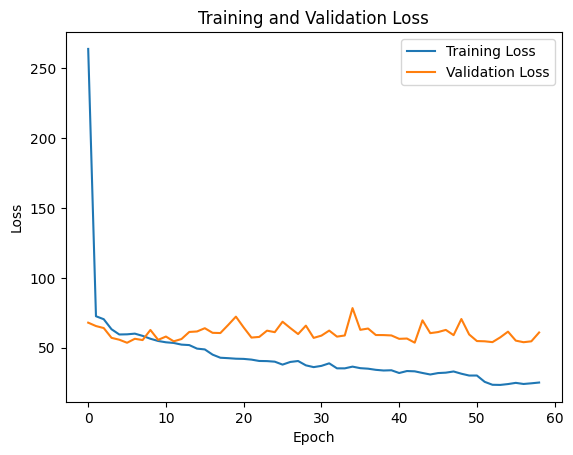

Model saved to models/gcntransformer_simulated.pth
Fold 1 Results:
   MAE: 0.032874640077352524
   Average Frobenius distance: 1.5037246942520142
   Average MAE node strength: 0.5662568198442536
   Average MAE clustering coefficient: 0.058558336701999766
   Average MAE betweenness centrality: 0.23312025344897316
   Average MAE eigenvector centrality: 0.022948056561830885

Fold 2/3
Epoch 1
  Training -> Loss: 257.6056, Generative Loss: 74.1729, Topological Loss: 161.8213
  Validation -> Loss: 79.4806, Generative Loss: 50.2006, Topological Loss: 24.9476
Time: 0.85s, CPU: 30.30%, Memory: 3.27GB, GPU: 0.02GB, GPU Util: 5.00%
Epoch 2
  Training -> Loss: 73.2158, Generative Loss: 46.0571, Topological Loss: 23.7398
  Validation -> Loss: 64.2760, Generative Loss: 42.8358, Topological Loss: 18.6625
Time: 0.87s, CPU: 28.70%, Memory: 3.27GB, GPU: 0.02GB, GPU Util: 9.50%
Epoch 3
  Training -> Loss: 68.6549, Generative Loss: 42.7364, Topological Loss: 23.1523
  Validation -> Loss: 57.7686, Generati

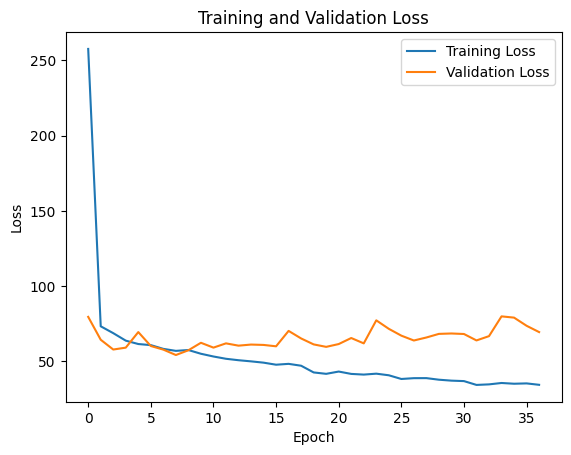

Model saved to models/gcntransformer_simulated.pth
Fold 2 Results:
   MAE: 0.03569191321730614
   Average Frobenius distance: 1.6495904922485352
   Average MAE node strength: 0.6315617241337839
   Average MAE clustering coefficient: 0.07337441959320676
   Average MAE betweenness centrality: 0.22341713544922098
   Average MAE eigenvector centrality: 0.023697768679549265

Fold 3/3
Epoch 1
  Training -> Loss: 257.2422, Generative Loss: 72.3936, Topological Loss: 163.8078
  Validation -> Loss: 78.6694, Generative Loss: 51.5584, Topological Loss: 21.6849
Time: 1.00s, CPU: 35.05%, Memory: 3.28GB, GPU: 0.02GB, GPU Util: 3.50%
Epoch 2
  Training -> Loss: 70.2914, Generative Loss: 43.2614, Topological Loss: 24.0878
  Validation -> Loss: 62.4646, Generative Loss: 40.5415, Topological Loss: 19.4074
Time: 0.89s, CPU: 43.25%, Memory: 3.28GB, GPU: 0.02GB, GPU Util: 7.50%
Epoch 3
  Training -> Loss: 64.0223, Generative Loss: 40.3573, Topological Loss: 21.1498
  Validation -> Loss: 59.4503, Generative

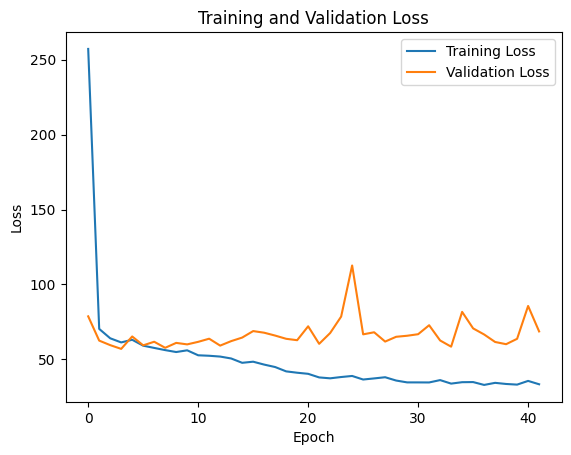

Model saved to models/gcntransformer_simulated.pth
Fold 3 Results:
   MAE: 0.03721342980861664
   Average Frobenius distance: 1.7195699214935303
   Average MAE node strength: 0.6160590127630203
   Average MAE clustering coefficient: 0.08722561088326612
   Average MAE betweenness centrality: 0.23673981989490006
   Average MAE eigenvector centrality: 0.02607189721752573

Cross-Validation Results:
mae: Mean = 0.0353, Std = 0.00
frobenius_distance: Mean = 1.6243, Std = 0.09
mae_ns: Mean = 0.6046, Std = 0.03
mae_cc: Mean = 0.0731, Std = 0.01
mae_bc: Mean = 0.2311, Std = 0.01
mae_ec: Mean = 0.0242, Std = 0.00
epochs: Mean = 46.0000, Std = 9.42
training_times: Mean = 39.4152, Std = 8.06
avg_memory_usage: Mean = 3.2730, Std = 0.00
avg_gpu_usage: Mean = 0.0182, Std = 0.00
max_memory_usage: Mean = 3.2730, Std = 0.00
max_gpu_usage: Mean = 0.0182, Std = 0.00


In [9]:
set_seed(42)
gcntransformer_simulated = GCNTransformer(simulated_num_nodes, simulated_num_features, 
                                        latent_dim=32, encoder_hidden_dims=16, decoder_hidden_dims=16)
print(gcntransformer_simulated)
print(f"Total number of trainable parameters: {(gcntransformer_simulated.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcntransformer_simulated, simulated_features, simulated_adj, lr=0.01, num_epochs=100, 
                            patience=5, step_size=50, gamma=0.5, save_path='models/gcntransformer_simulated.pth')

#### Simple Train-Test 

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (16 -> 32)
    (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (32 -> 32)
    (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (32 -> 16)
    (bn1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (16 -> 35)
    (bn2): BatchNorm1d(35, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 76057

Epoch 1
  Training -> Loss: 804.9080, Generative Loss: 145.9974, Topologic

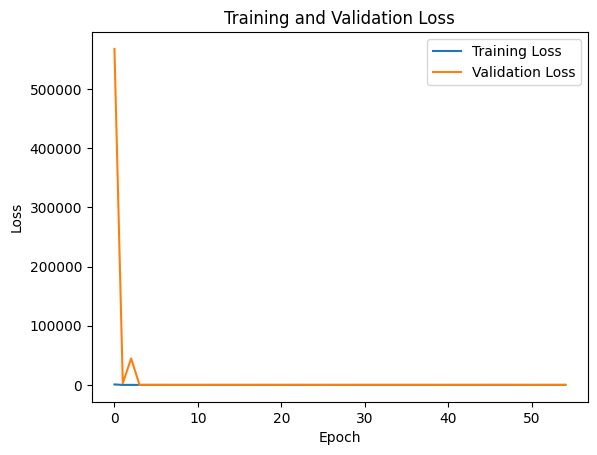

Model saved to models/gcntransformer_simulated.pth
Average Time per Epoch: 1.06s
Average CPU Usage: 23.08%
Average Memory Usage: 3.98GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 7.31%

Total Training Time: 58.51s
Max CPU Usage: 41.70%
Max Memory Usage: 3.98GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 8.50%


In [49]:
set_seed(42)
gcntransformer_simulated = GCNTransformer(simulated_num_nodes, simulated_num_features, 
                                        latent_dim=32, encoder_hidden_dims=16, decoder_hidden_dims=16)
print(gcntransformer_simulated)
print(f"Total number of trainable parameters: {(gcntransformer_simulated.count_parameters())}\n")

train(gcntransformer_simulated, simulated_features_train.to(device), simulated_adj_train.to(device),  
    simulated_features_val.to(device), simulated_adj_val.to(device), lr=0.001, num_epochs=200, 
    patience=5, step_size=100, gamma=0.5, save_path='models/gcntransformer_simulated.pth')

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.0014926681


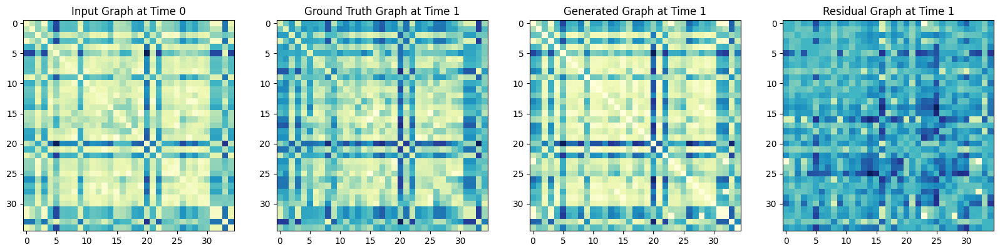

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.007080729


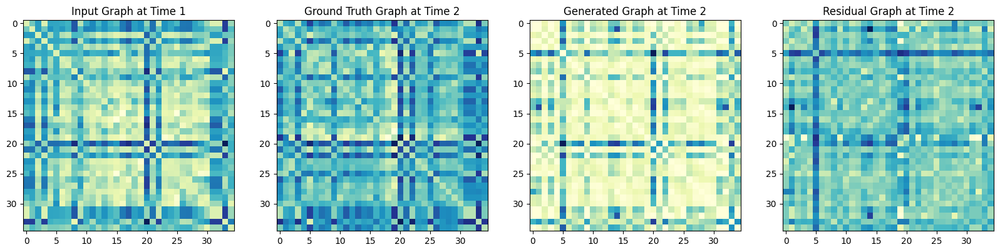

Mean Squared Error between ground truth graphs:  0.0036118329


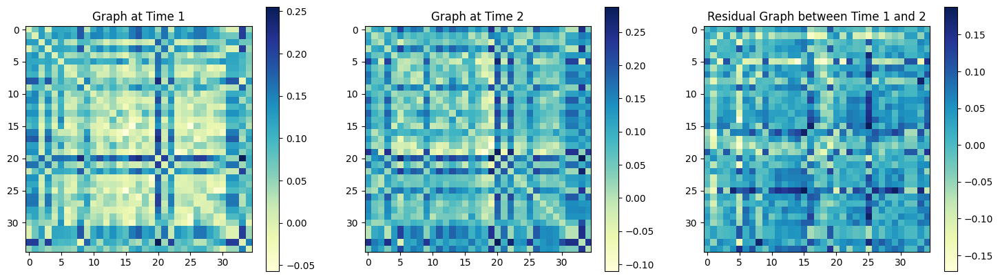

Mean Squared Error between generated graphs:  0.0052311704


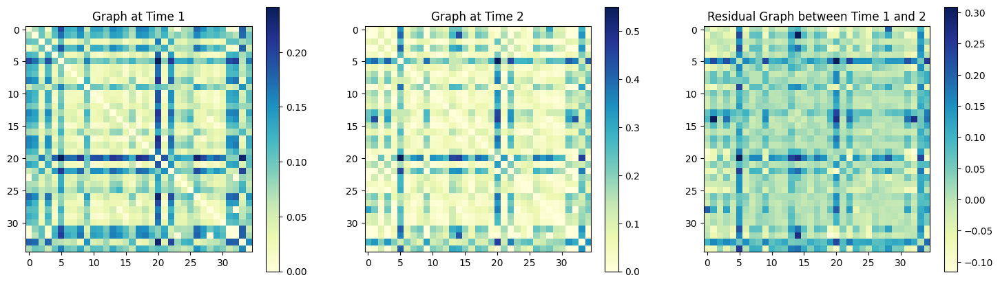

MAE:  0.03974691
Average Frobenius distance: 1.8756905
Average Jaccard distance: 0.08213164606961318
Average MAE global efficiency: 0.016176470588235282
Average MAE local efficiency: 0.014198284575564208
Average MAE betweenness centrality: 0.23517316017316015
Average MAE eigenvector centrality: 0.025370502183580605


In [50]:
gcntransformer_simulated = GCNTransformer(simulated_num_nodes, simulated_num_features, 
                                        latent_dim=32, encoder_hidden_dims=16, decoder_hidden_dims=16)
gcntransformer_simulated.load_state_dict(torch.load('models/gcntransformer_simulated.pth'))  
inference_model(gcntransformer_simulated.to(device), simulated_features_test.to(device), 
                simulated_adj_test.to(device), sample_idx=0)
metrics = evaluate_model(gcntransformer_simulated.to(device), simulated_features_test.to(device), 
                simulated_adj_test.to(device))

### OASIS

#### 3-fold CV

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (16 -> 32)
    (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (32 -> 32)
    (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (32 -> 16)
    (bn1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (16 -> 35)
    (bn2): BatchNorm1d(35, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 76057


Fold 1/3
Epoch 1
  Training -> Loss: 249280.5230, Generative Loss: 168.99

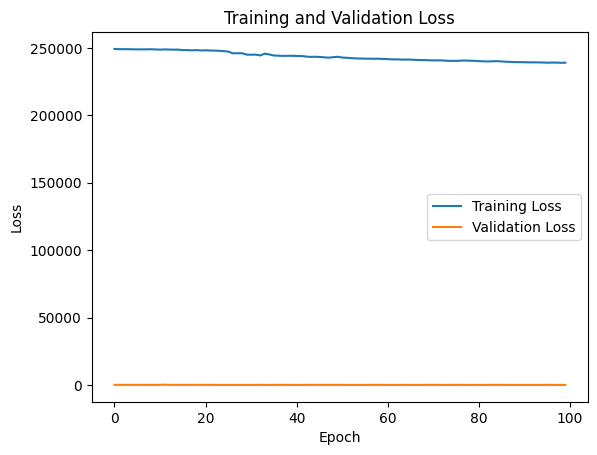

Model saved to models/gcntransformer_oasis.pth
Fold 1 Results:
   MAE: 0.0516633540391922
   Average Frobenius distance: 2.5930519104003906
   Average MAE node strength: 1.0608736365424605
   Average MAE clustering coefficient: 0.051560707858516075
   Average MAE betweenness centrality: 0.10088749174139788
   Average MAE eigenvector centrality: 0.026885667785855927

Fold 2/3
Epoch 1
  Training -> Loss: 249235.6934, Generative Loss: 170.5645, Topological Loss: 235598.0787
  Validation -> Loss: 145.1424, Generative Loss: 71.7432, Topological Loss: 62.5645
Time: 0.91s, CPU: 29.25%, Memory: 3.25GB, GPU: 0.02GB, GPU Util: 4.50%
Epoch 2
  Training -> Loss: 249055.9062, Generative Loss: 140.5279, Topological Loss: 235466.8999
  Validation -> Loss: 191.2498, Generative Loss: 76.2042, Topological Loss: 101.0623
Time: 1.07s, CPU: 25.45%, Memory: 3.25GB, GPU: 0.02GB, GPU Util: 8.50%
Epoch 3
  Training -> Loss: 249064.4377, Generative Loss: 137.9340, Topological Loss: 235477.7871
  Validation -> L

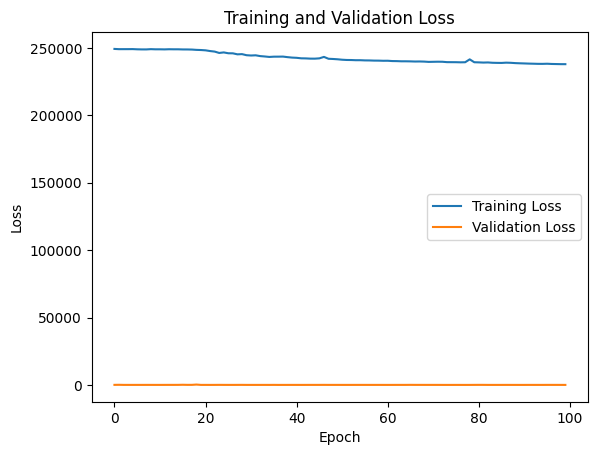

Model saved to models/gcntransformer_oasis.pth
Fold 2 Results:
   MAE: 0.041526567190885544
   Average Frobenius distance: 1.938097357749939
   Average MAE node strength: 0.740026547526047
   Average MAE clustering coefficient: 0.04759586242744623
   Average MAE betweenness centrality: 0.08235971193389895
   Average MAE eigenvector centrality: 0.023042447740989548

Fold 3/3
Epoch 1
  Training -> Loss: 314.1416, Generative Loss: 91.3567, Topological Loss: 196.8930
  Validation -> Loss: 609241.3743, Generative Loss: 1798.1227, Topological Loss: 547025.0459
Time: 0.88s, CPU: 23.65%, Memory: 3.26GB, GPU: 0.02GB, GPU Util: 5.00%
Epoch 2
  Training -> Loss: 154.7066, Generative Loss: 62.0548, Topological Loss: 84.8387
  Validation -> Loss: 13177.8162, Generative Loss: 292.9890, Topological Loss: 11287.9244
Time: 0.85s, CPU: 13.30%, Memory: 3.26GB, GPU: 0.02GB, GPU Util: 9.50%
Epoch 3
  Training -> Loss: 149.7778, Generative Loss: 60.9012, Topological Loss: 81.3224
  Validation -> Loss: 1243.

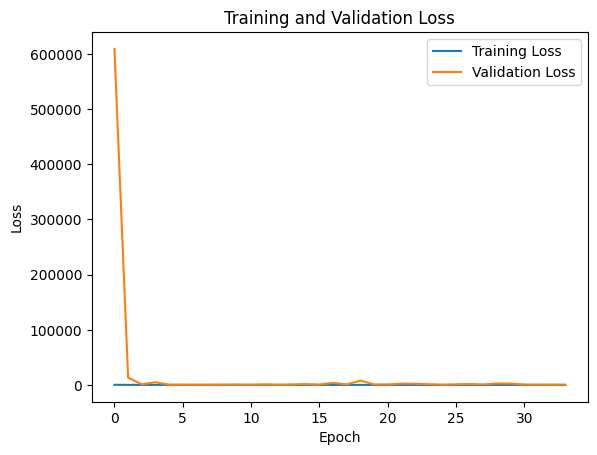

Model saved to models/gcntransformer_oasis.pth
Fold 3 Results:
   MAE: 0.1711418181657791
   Average Frobenius distance: 20.08222770690918
   Average MAE node strength: 5.028152255082094
   Average MAE clustering coefficient: 0.0536996162989368
   Average MAE betweenness centrality: 0.0904107330373363
   Average MAE eigenvector centrality: 0.02729699745854024

Cross-Validation Results:
mae: Mean = 0.0881, Std = 0.06
frobenius_distance: Mean = 8.2045, Std = 8.40
mae_ns: Mean = 2.2764, Std = 1.95
mae_cc: Mean = 0.0510, Std = 0.00
mae_bc: Mean = 0.0912, Std = 0.01
mae_ec: Mean = 0.0257, Std = 0.00
epochs: Mean = 77.6667, Std = 30.88
training_times: Mean = 74.6807, Std = 30.29
avg_memory_usage: Mean = 3.2517, Std = 0.01
avg_gpu_usage: Mean = 0.0183, Std = 0.00
max_memory_usage: Mean = 3.2526, Std = 0.01
max_gpu_usage: Mean = 0.0183, Std = 0.00


In [8]:
set_seed(42)
gcntransformer_oasis = GCNTransformer(oasis_num_nodes, oasis_num_features, 
                                        latent_dim=32, encoder_hidden_dims=16, decoder_hidden_dims=16)
print(gcntransformer_oasis)
print(f"Total number of trainable parameters: {(gcntransformer_oasis.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcntransformer_oasis, oasis_features, oasis_adj, lr=0.01, num_epochs=100, 
                            patience=5, step_size=50, gamma=0.5, save_path='models/gcntransformer_oasis.pth')

#### Simple Train-Test

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (16 -> 32)
    (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (32 -> 32)
    (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (32 -> 16)
    (bn1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (16 -> 35)
    (bn2): BatchNorm1d(35, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 76057

Epoch 1
  Training -> Loss: 217898.3724, Generative Loss: 163.1078, Topolo

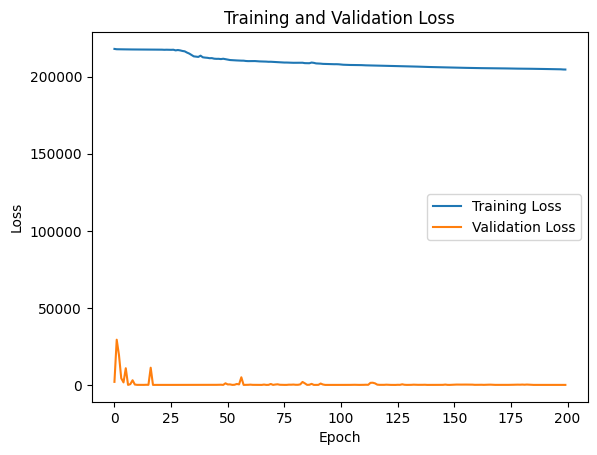

Model saved to models/gcntransformer_oasis.pth
Average Time per Epoch: 0.61s
Average CPU Usage: 16.11%
Average Memory Usage: 4.72GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 16.25%

Total Training Time: 121.22s
Max CPU Usage: 39.30%
Max Memory Usage: 4.72GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 18.00%


In [55]:
set_seed(42)
gcntransformer_oasis = GCNTransformer(oasis_num_nodes, oasis_num_features, 
                                        latent_dim=32, encoder_hidden_dims=16, decoder_hidden_dims=16)
print(gcntransformer_oasis)
print(f"Total number of trainable parameters: {(gcntransformer_oasis.count_parameters())}\n")

train(gcntransformer_oasis, oasis_features_train.to(device), oasis_adj_train.to(device),  
    oasis_features_val.to(device), oasis_adj_val.to(device), lr=0.01, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/gcntransformer_oasis.pth')


Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.0028457078


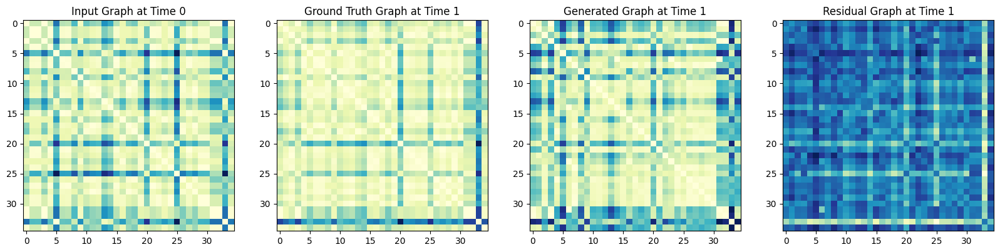

Mean Squared Error between ground truth graphs:  0.0021468746


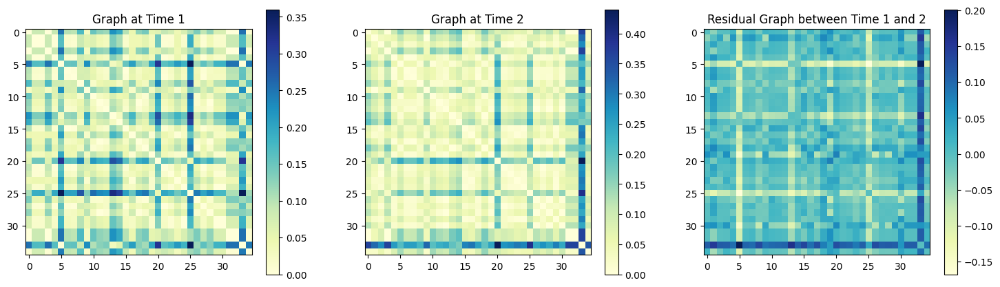

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.0033219627


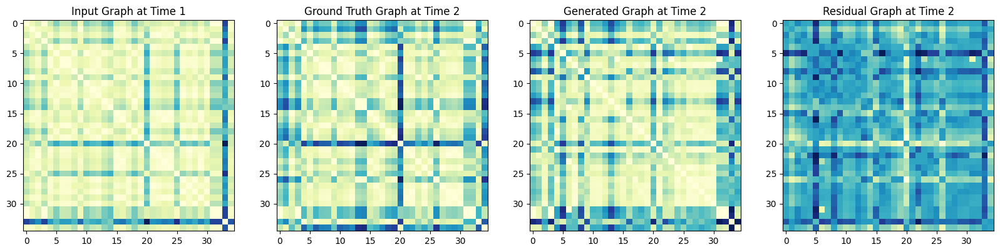

Mean Squared Error between ground truth graphs:  0.0046917056


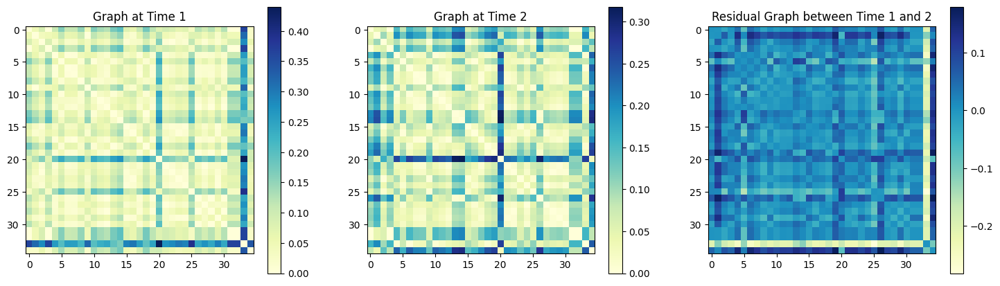

Mean Squared Error between generated graphs:  2.0072186e-05


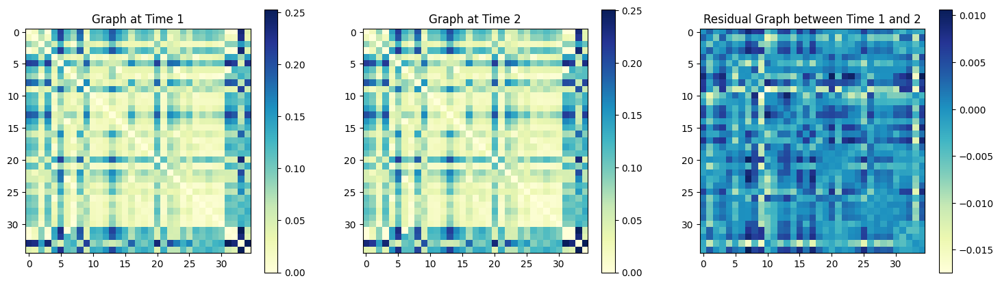

MAE:  0.05529638
Average Frobenius distance: 2.7301152
Average MAE node strength: 1.2171910450215255
Average MAE clustering coefficient: 0.056270406517316164
Average MAE closeness centrality: 8.554857242412513
Average MAE betweenness centrality: 0.09197851800005159
Average MAE eigenvector centrality: 0.028325384817209216


In [56]:
set_seed(42)
gcntransformer_oasis = GCNTransformer(oasis_num_nodes, oasis_num_features, 
                                        latent_dim=32, encoder_hidden_dims=16, decoder_hidden_dims=16)
gcntransformer_oasis.load_state_dict(torch.load('models/gcntransformer_oasis.pth'))                                   
inference_model(gcntransformer_oasis.to(device), oasis_features_test.to(device), 
                oasis_adj_test.to(device), sample_idx=1)

metrics = evaluate_model(gcntransformer_oasis.to(device), oasis_features_test.to(device), oasis_adj_test.to(device))

### EMCI-AD

#### 3-fold CV

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 8)
    (bn0): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (8 -> 16)
    (bn1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (16 -> 16)
    (bn2): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=560, out_features=16, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=16, out_features=560, bias=True)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (16 -> 8)
    (bn1): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (8 -> 35)
    (bn2): BatchNorm1d(35, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 19649


Fold 1/3
Epoch 1
  Training -> Loss: 5263.8711, Generative Loss: 492.9245, Topolo

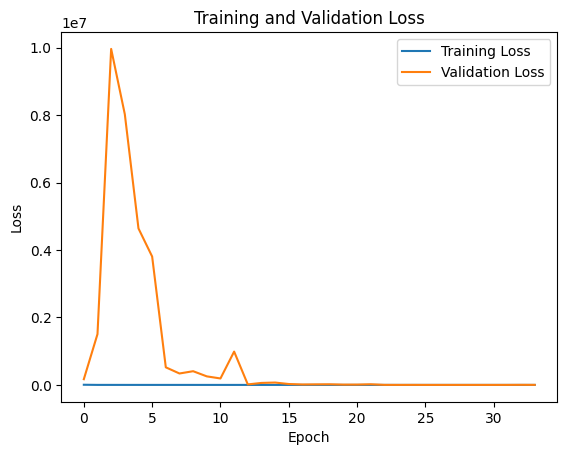

Model saved to models/gcntransformer_emci.pth
Fold 1 Results:
   MAE: 0.2157624065876007
   Average Frobenius distance: 10.114603042602539
   Average MAE node strength: 3.5725742763949127
   Average MAE clustering coefficient: 0.028392513470431594
   Average MAE betweenness centrality: 0.10601969074506505
   Average MAE eigenvector centrality: 0.011189210194336217

Fold 2/3
Epoch 1
  Training -> Loss: 5920.7729, Generative Loss: 565.4174, Topological Loss: 4754.3426
  Validation -> Loss: 201484.4531, Generative Loss: 2497.6553, Topological Loss: 187507.9609
Time: 0.27s, CPU: 27.80%, Memory: 3.29GB, GPU: 0.02GB, GPU Util: 3.00%
Epoch 2
  Training -> Loss: 1204.3489, Generative Loss: 398.7889, Topological Loss: 525.7538
  Validation -> Loss: 211585.2070, Generative Loss: 2354.3656, Topological Loss: 198548.1133
Time: 0.30s, CPU: 30.55%, Memory: 3.29GB, GPU: 0.02GB, GPU Util: 8.00%
Epoch 3
  Training -> Loss: 955.3166, Generative Loss: 321.2183, Topological Loss: 446.7155
  Validation -> 

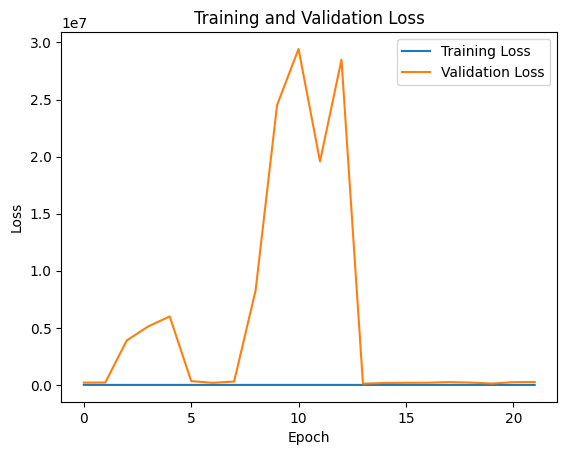

Model saved to models/gcntransformer_emci.pth
Fold 2 Results:
   MAE: 1.4748519659042358
   Average Frobenius distance: 88.20307159423828
   Average MAE node strength: 48.06632255721734
   Average MAE clustering coefficient: 0.07882714421344485
   Average MAE betweenness centrality: 0.11157454166239499
   Average MAE eigenvector centrality: 0.01879756221275328

Fold 3/3
Epoch 1
  Training -> Loss: 5632.5921, Generative Loss: 538.2373, Topological Loss: 4569.2075
  Validation -> Loss: 399838.7109, Generative Loss: 3281.9103, Topological Loss: 377469.9141
Time: 0.31s, CPU: 33.30%, Memory: 3.29GB, GPU: 0.02GB, GPU Util: 3.50%
Epoch 2
  Training -> Loss: 1180.2037, Generative Loss: 348.6512, Topological Loss: 641.9618
  Validation -> Loss: 105894.2969, Generative Loss: 1592.4226, Topological Loss: 98973.0469
Time: 0.30s, CPU: 31.80%, Memory: 3.29GB, GPU: 0.02GB, GPU Util: 7.00%
Epoch 3
  Training -> Loss: 980.6195, Generative Loss: 274.0799, Topological Loss: 586.8963
  Validation -> Loss:

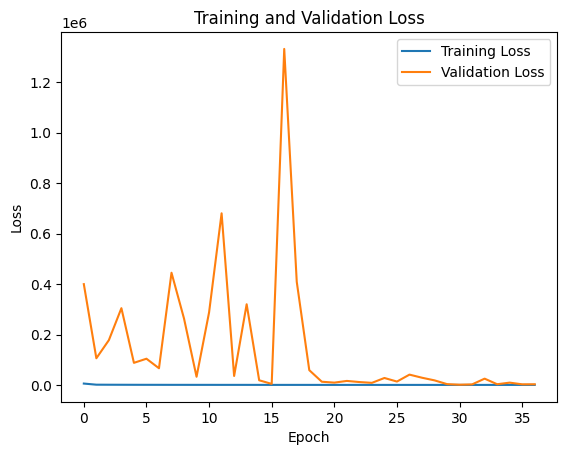

Model saved to models/gcntransformer_emci.pth
Fold 3 Results:
   MAE: 0.36338406801223755
   Average Frobenius distance: 19.537986755371094
   Average MAE node strength: 9.75400673622254
   Average MAE clustering coefficient: 0.02371474239637189
   Average MAE betweenness centrality: 0.09027333798533187
   Average MAE eigenvector centrality: 0.010938548702886193

Cross-Validation Results:
mae: Mean = 0.6847, Std = 0.56
frobenius_distance: Mean = 39.2852, Std = 34.80
mae_ns: Mean = 20.4643, Std = 19.68
mae_cc: Mean = 0.0436, Std = 0.02
mae_bc: Mean = 0.1026, Std = 0.01
mae_ec: Mean = 0.0136, Std = 0.00
epochs: Mean = 31.0000, Std = 6.48
training_times: Mean = 8.8514, Std = 1.75
avg_memory_usage: Mean = 3.2877, Std = 0.00
avg_gpu_usage: Mean = 0.0167, Std = 0.00
max_memory_usage: Mean = 3.2877, Std = 0.00
max_gpu_usage: Mean = 0.0167, Std = 0.00


In [10]:
set_seed(42)
gcntransformer_emci = GCNTransformer(emci_num_nodes, emci_num_features, 
                                    latent_dim=16, encoder_hidden_dims=8, decoder_hidden_dims=8)
print(gcntransformer_emci)
print(f"Total number of trainable parameters: {(gcntransformer_emci.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcntransformer_emci, emci_features, emci_adj, lr=0.01, num_epochs=100, 
                            patience=5, step_size=50, gamma=0.5, save_path='models/gcntransformer_emci.pth')

#### Simple Train-Test

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 8)
    (bn0): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (8 -> 16)
    (bn1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (16 -> 16)
    (bn2): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=560, out_features=16, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=16, out_features=560, bias=True)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (16 -> 8)
    (bn1): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (8 -> 35)
    (bn2): BatchNorm1d(35, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 19649

Epoch 1
  Training -> Loss: 14655.0242, Generative Loss: 758.2974, Topological Los

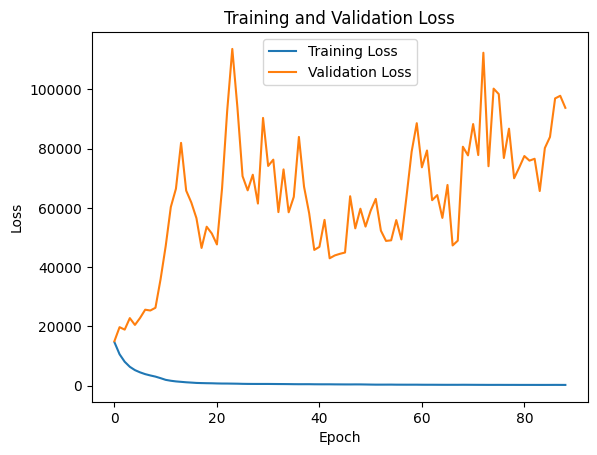

Model saved to models/gcntransformer_emci.pth
Average Time per Epoch: 0.17s
Average CPU Usage: 15.27%
Average Memory Usage: 4.68GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 14.48%

Total Training Time: 15.44s
Max CPU Usage: 34.60%
Max Memory Usage: 4.68GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 16.00%


In [23]:
set_seed(42)
gcntransformer_emci = GCNTransformer(emci_num_nodes, emci_num_features, 
                                        latent_dim=16, encoder_hidden_dims=8, decoder_hidden_dims=8)
print(gcntransformer_emci)
print(f"Total number of trainable parameters: {(gcntransformer_emci.count_parameters())}\n")

train(gcntransformer_emci, emci_features_train.to(device), emci_adj_train.to(device),  
    emci_features_val.to(device), emci_adj_val.to(device), lr=0.0005, num_epochs=200, 
    patience=5, step_size=100, gamma=0.5, save_path='models/gcntransformer_emci.pth')


Mean Squared Error between predicted (t1) and ground truth graphs (t0):  2.2112672


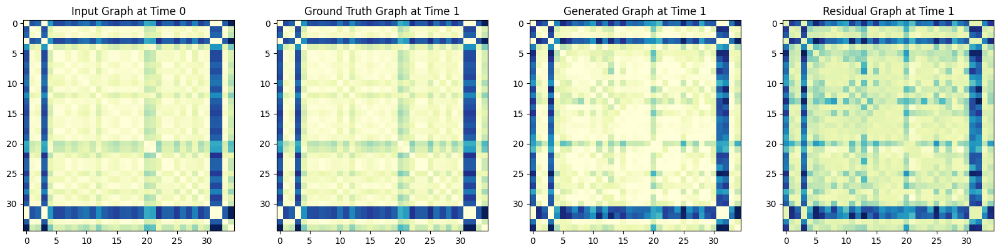

Mean Squared Error between ground truth graphs:  0.0053027626


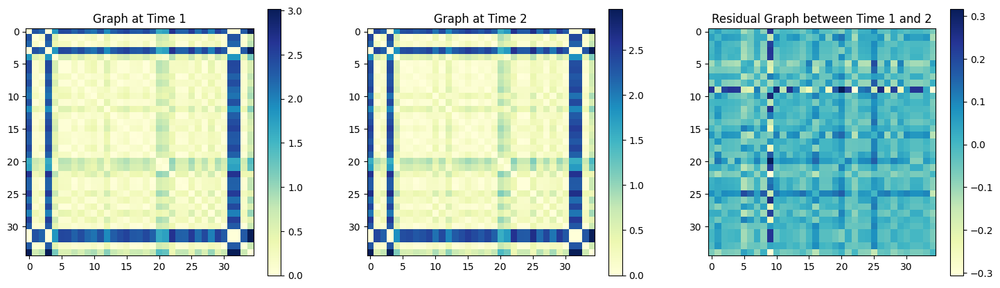

MAE:  1.0140338
Average Frobenius distance: 56.278397
Average MAE node strength: 29.893250524736278
Average MAE clustering coefficient: 0.035689693687110266
Average MAE closeness centrality: 0.267289445353362
Average MAE betweenness centrality: 0.10227758982380832
Average MAE eigenvector centrality: 0.018196359102005812


In [24]:
gcntransformer_emci = GCNTransformer(emci_num_nodes, emci_num_features, 
                                        latent_dim=16, encoder_hidden_dims=8, decoder_hidden_dims=8)
gcntransformer_emci.load_state_dict(torch.load('models/gcntransformer_emci.pth'))                                        
inference_model(gcntransformer_emci.to(device), emci_features_test.to(device), 
                emci_adj_test.to(device), sample_idx=1)
metrics = evaluate_model(gcntransformer_emci.to(device), emci_features_test.to(device), emci_adj_test.to(device))

### SLIM160

#### 3-fold CV

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 32)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (32 -> 64)
    (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (64 -> 64)
    (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=10240, out_features=64, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=64, out_features=10240, bias=True)
    (bn0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (64 -> 32)
    (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (32 -> 160)
    (bn2): BatchNorm1d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 1335840


Fold 1/3
Epoch 1
  Training -> Loss: 64788.0052, Generative Loss: 5

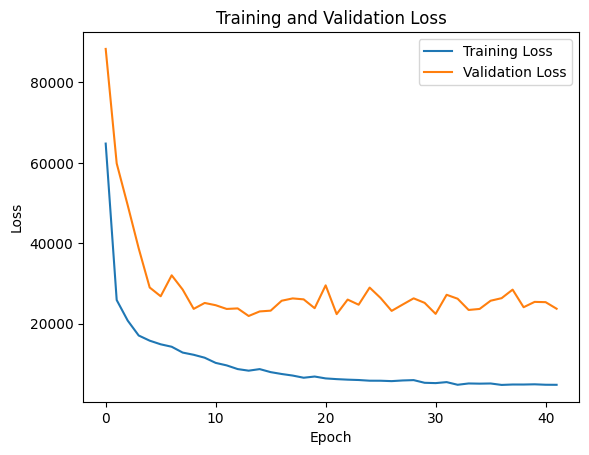

Model saved to models/gcntransformer_slim160.pth
Fold 1 Results:
   MAE: 0.1538674235343933
   Average Frobenius distance: 32.67803192138672
   Average MAE node strength: 11.563780347489708
   Average MAE clustering coefficient: 0.07634389373672286
   Average MAE betweenness centrality: 0.03066347037268938
   Average MAE eigenvector centrality: 0.026670581540030724

Fold 2/3
Epoch 1
  Training -> Loss: 69027.9677, Generative Loss: 5238.7279, Topological Loss: 61143.5255
  Validation -> Loss: 26949.2711, Generative Loss: 4581.5731, Topological Loss: 20052.4494
Time: 0.98s, CPU: 28.65%, Memory: 3.76GB, GPU: 0.05GB, GPU Util: 9.50%
Epoch 2
  Training -> Loss: 33821.3210, Generative Loss: 3984.6976, Topological Loss: 28739.1590
  Validation -> Loss: 21599.6716, Generative Loss: 4259.8168, Topological Loss: 15935.7740
Time: 0.92s, CPU: 25.80%, Memory: 3.76GB, GPU: 0.06GB, GPU Util: 19.50%
Epoch 3
  Training -> Loss: 27819.1015, Generative Loss: 3920.2209, Topological Loss: 22861.4064
  Vali

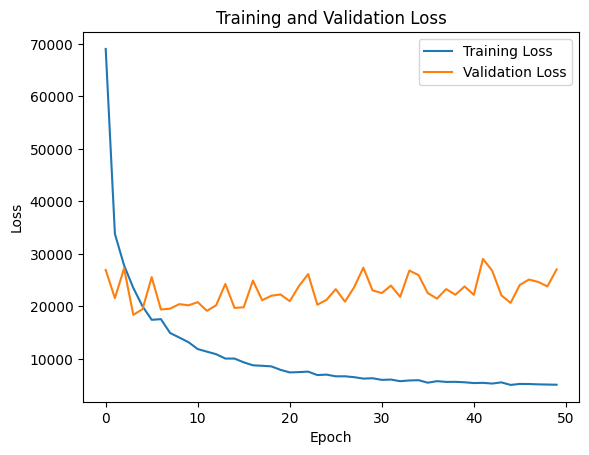

Model saved to models/gcntransformer_slim160.pth
Fold 2 Results:
   MAE: 0.13915760815143585
   Average Frobenius distance: 28.68312644958496
   Average MAE node strength: 8.992104373996323
   Average MAE clustering coefficient: 0.053697083275263874
   Average MAE betweenness centrality: 0.031195674829056424
   Average MAE eigenvector centrality: 0.026659950863658275

Fold 3/3
Epoch 1
  Training -> Loss: 64106.0565, Generative Loss: 5178.9194, Topological Loss: 56339.5769
  Validation -> Loss: 47664.5010, Generative Loss: 4559.9922, Topological Loss: 40573.0623
Time: 1.00s, CPU: 27.30%, Memory: 4.16GB, GPU: 0.05GB, GPU Util: 9.50%
Epoch 2
  Training -> Loss: 28586.6373, Generative Loss: 3993.8760, Topological Loss: 23495.4412
  Validation -> Loss: 49626.0098, Generative Loss: 4516.4173, Topological Loss: 43246.5835
Time: 0.98s, CPU: 26.10%, Memory: 4.16GB, GPU: 0.06GB, GPU Util: 21.00%
Epoch 3
  Training -> Loss: 25639.5200, Generative Loss: 3905.1517, Topological Loss: 20708.6150
  Va

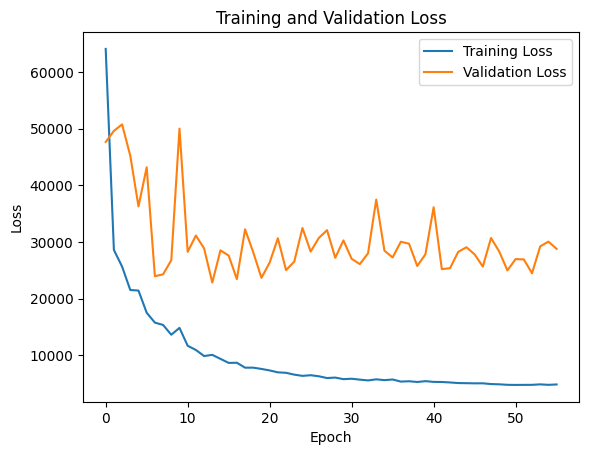

Model saved to models/gcntransformer_slim160.pth
Fold 3 Results:
   MAE: 0.15088017284870148
   Average Frobenius distance: 33.62763977050781
   Average MAE node strength: 10.218228696687653
   Average MAE clustering coefficient: 0.07183995300560808
   Average MAE betweenness centrality: 0.03060952827977248
   Average MAE eigenvector centrality: 0.027005731194503106

Cross-Validation Results:
mae: Mean = 0.1480, Std = 0.01
frobenius_distance: Mean = 31.6629, Std = 2.14
mae_ns: Mean = 10.2580, Std = 1.05
mae_cc: Mean = 0.0673, Std = 0.01
mae_bc: Mean = 0.0308, Std = 0.00
mae_ec: Mean = 0.0268, Std = 0.00
epochs: Mean = 49.3333, Std = 5.73
training_times: Mean = 46.0055, Std = 5.36
avg_memory_usage: Mean = 3.7605, Std = 0.32
avg_gpu_usage: Mean = 0.0583, Std = 0.00
max_memory_usage: Mean = 3.7606, Std = 0.32
max_gpu_usage: Mean = 0.0585, Std = 0.00


In [11]:
set_seed(42)
gcntransformer_slim160 = GCNTransformer(slim160_num_nodes, slim160_num_features, 
                                        latent_dim=64, encoder_hidden_dims=32, decoder_hidden_dims=32)
print(gcntransformer_slim160)
print(f"Total number of trainable parameters: {(gcntransformer_slim160.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcntransformer_slim160, slim160_features, slim160_adj, lr=0.0005, num_epochs=100, 
                            patience=5, step_size=50, gamma=0.5, save_path='models/gcntransformer_slim160.pth')

#### Simple Train-Test

GCNTransformer(
  (encoder): GCNEncoder(
    (gat): GAT (8 -> 32)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (32 -> 64)
    (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (64 -> 64)
    (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc): Linear(in_features=10240, out_features=64, bias=True)
  )
  (decoder): GCNDecoder(
    (fc): Linear(in_features=64, out_features=10240, bias=True)
    (bn0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn1): GCN (64 -> 32)
    (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gcn2): GCN (32 -> 160)
    (bn2): BatchNorm1d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
Total number of trainable parameters: 1335840

Epoch 1
  Training -> Loss: 48837.2530, Generative Loss: 4646.5914, 

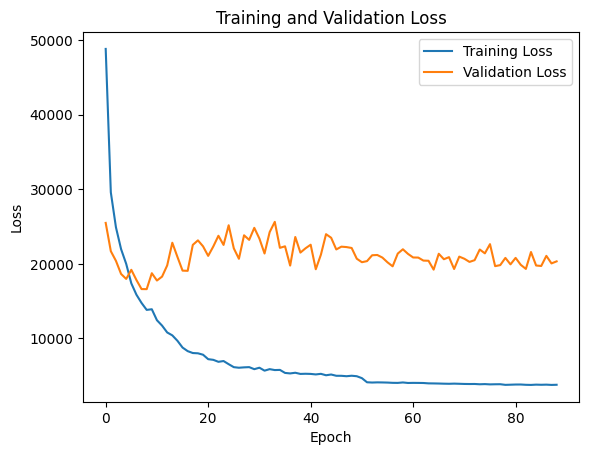

Model saved to models/gcntransformer_slim160.pth
Average Time per Epoch: 0.69s
Average CPU Usage: 19.53%
Average Memory Usage: 4.75GB
Average GPU Usage: 0.08GB
Average GPU Utilization: 25.57%

Total Training Time: 61.61s
Max CPU Usage: 39.75%
Max Memory Usage: 4.75GB
Max GPU Usage: 0.08GB
Max GPU Utilization: 30.00%


In [184]:
set_seed(42)
gcntransformer_slim160 = GCNTransformer(slim160_num_nodes, slim160_num_features, 
                                        latent_dim=64, encoder_hidden_dims=32, decoder_hidden_dims=32)
print(gcntransformer_slim160)
print(f"Total number of trainable parameters: {(gcntransformer_slim160.count_parameters())}\n")

train(gcntransformer_slim160, slim160_features_train.to(device), slim160_adj_train.to(device),  
    slim160_features_val.to(device), slim160_adj_val.to(device), lr=0.001, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/gcntransformer_slim160.pth')


Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.053005695


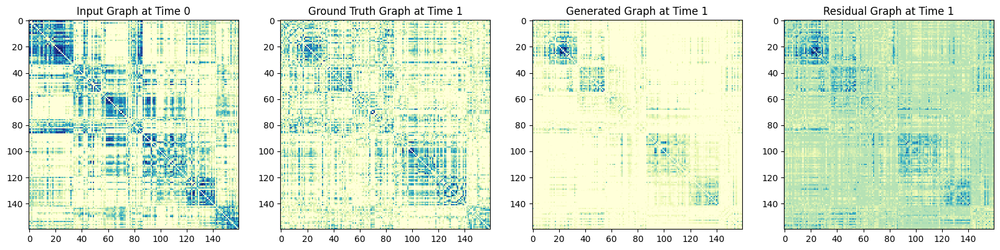

Mean Squared Error between ground truth graphs:  0.03971826


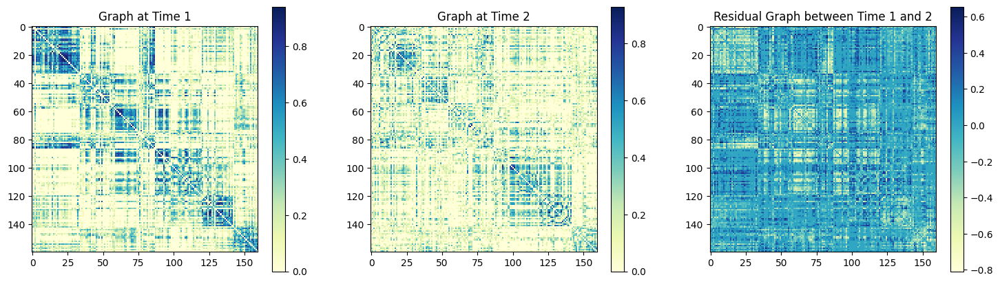

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.025737628


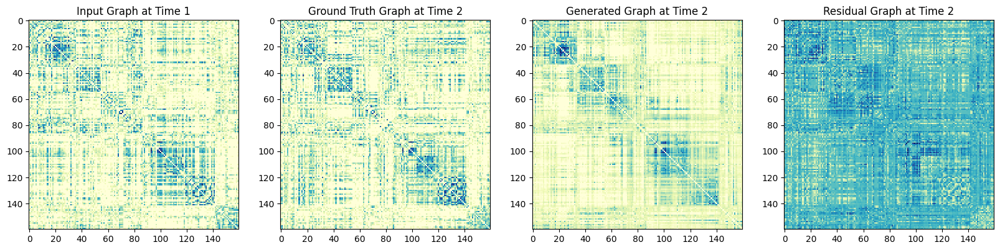

Mean Squared Error between ground truth graphs:  0.024009747


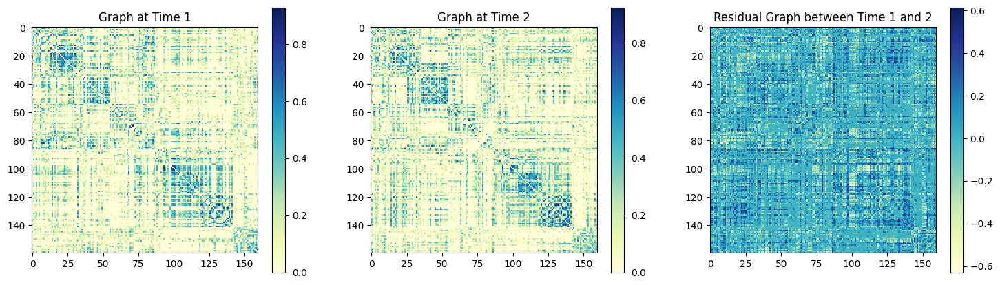

Mean Squared Error between generated graphs:  0.026730468


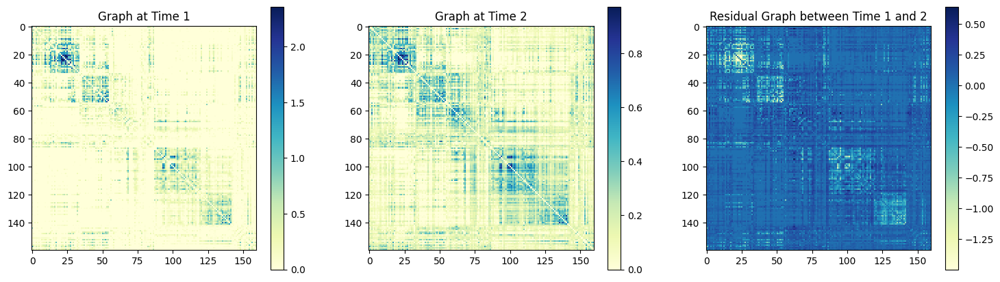

MAE:  0.1445046
Average Frobenius distance: 31.511097
Average Jaccard distance: 0.43215424489451154
Average MAE global efficiency: 0.10450420426579157
Average MAE local efficiency: 0.0695047428251546
Average MAE betweenness centrality: 0.030439249938560686
Average MAE eigenvector centrality: 0.029466024547730067


In [186]:
gcntransformer_slim160 = GCNTransformer(slim160_num_nodes, slim160_num_features, 
                                        latent_dim=64, encoder_hidden_dims=32, decoder_hidden_dims=32)
gcntransformer_slim160.load_state_dict(torch.load('models/gcntransformer_slim160.pth')) 
inference_model(gcntransformer_slim160.to(device), slim160_features_test.to(device), 
                slim160_adj_test.to(device), sample_idx=1)

evaluate_model(gcntransformer_slim160.to(device), slim160_features_test.to(device), slim160_adj_test.to(device))

## GCESN

### Simulated

#### 3-fold CV

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 75827


Fold 1/3
Epoch 1
  Training -> Loss: 93.6491, Generative Loss: 50.3943, Topological Loss: 38.9990
  Validation -> Loss: 55.9280, Generative Loss: 36.8426, Topological Loss: 17.1278
Time: 0.94s, CPU: 31.10%, Memory: 3.73GB, GPU: 0.02GB, GPU Util: 4.50%
Epoch 2
  Training -> Loss: 65.8318, Ge

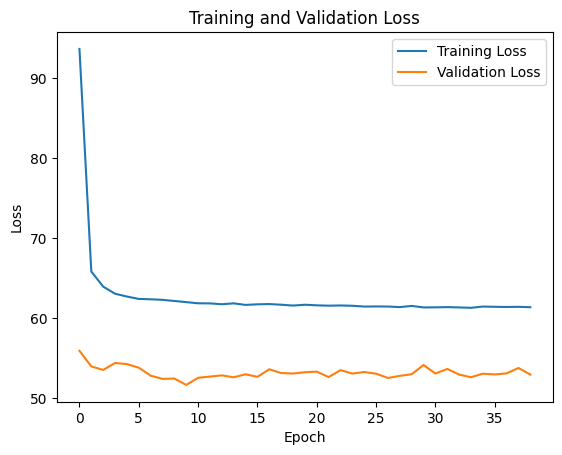

Model saved to models/gcesn_transformer_simulated.pth
Fold 1 Results:
   MAE: 0.030181920155882835
   Average Frobenius distance: 1.3826477527618408
   Average MAE node strength: 0.5352034305045523
   Average MAE clustering coefficient: 0.10633872001171887
   Average MAE betweenness centrality: 0.24061662097994277
   Average MAE eigenvector centrality: 0.020191087676392522

Fold 2/3
Epoch 1
  Training -> Loss: 88.4603, Generative Loss: 48.8244, Topological Loss: 35.6408
  Validation -> Loss: 62.0191, Generative Loss: 40.0602, Topological Loss: 19.7400
Time: 0.99s, CPU: 28.90%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 63.8930, Generative Loss: 38.5594, Topological Loss: 23.1118
  Validation -> Loss: 56.0345, Generative Loss: 36.9529, Topological Loss: 17.1887
Time: 0.88s, CPU: 25.10%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 9.50%
Epoch 3
  Training -> Loss: 62.7280, Generative Loss: 37.8470, Topological Loss: 22.7314
  Validation -> Loss: 56.2754, Generati

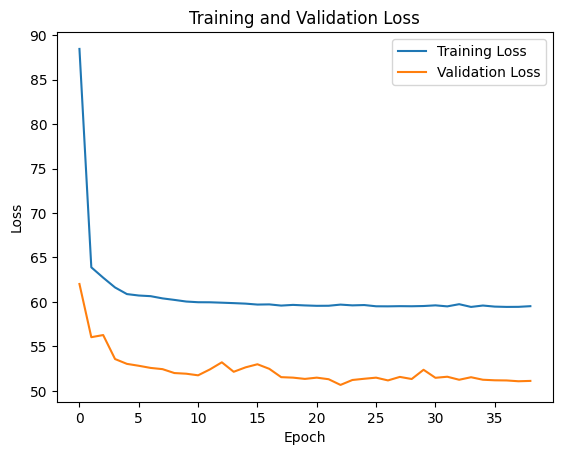

Model saved to models/gcesn_transformer_simulated.pth
Fold 2 Results:
   MAE: 0.030436011031270027
   Average Frobenius distance: 1.4148187637329102
   Average MAE node strength: 0.5406309745182094
   Average MAE clustering coefficient: 0.07624608230418972
   Average MAE betweenness centrality: 0.23511509286910354
   Average MAE eigenvector centrality: 0.02105534997389077

Fold 3/3
Epoch 1
  Training -> Loss: 87.0898, Generative Loss: 47.9711, Topological Loss: 35.2732
  Validation -> Loss: 61.3429, Generative Loss: 37.4865, Topological Loss: 21.7217
Time: 0.77s, CPU: 26.45%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 5.50%
Epoch 2
  Training -> Loss: 65.2050, Generative Loss: 38.5879, Topological Loss: 24.3721
  Validation -> Loss: 57.8090, Generative Loss: 35.7427, Topological Loss: 20.0721
Time: 0.86s, CPU: 24.25%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 10.00%
Epoch 3
  Training -> Loss: 62.9300, Generative Loss: 37.5844, Topological Loss: 23.2124
  Validation -> Loss: 55.4505, Generati

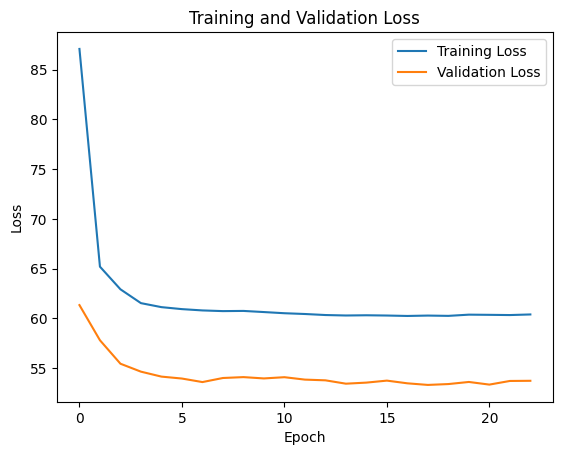

Model saved to models/gcesn_transformer_simulated.pth
Fold 3 Results:
   MAE: 0.030739551410079002
   Average Frobenius distance: 1.4268763065338135
   Average MAE node strength: 0.5166534249860008
   Average MAE clustering coefficient: 0.08259536723380968
   Average MAE betweenness centrality: 0.24536580472409347
   Average MAE eigenvector centrality: 0.021010441217758885

Cross-Validation Results:
mae: Mean = 0.0305, Std = 0.00
frobenius_distance: Mean = 1.4081, Std = 0.02
mae_ns: Mean = 0.5308, Std = 0.01
mae_cc: Mean = 0.0884, Std = 0.01
mae_bc: Mean = 0.2404, Std = 0.00
mae_ec: Mean = 0.0208, Std = 0.00
epochs: Mean = 33.6667, Std = 7.54
training_times: Mean = 30.2839, Std = 7.60
avg_memory_usage: Mean = 3.7227, Std = 0.00
avg_gpu_usage: Mean = 0.0181, Std = 0.00
max_memory_usage: Mean = 3.7227, Std = 0.00
max_gpu_usage: Mean = 0.0182, Std = 0.00


In [12]:
set_seed(42)
gcesn_transformer_simulated = GCESNTransformer(simulated_num_nodes, simulated_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_simulated.initialize_weights()
print(gcesn_transformer_simulated)
print(f"Total number of trainable parameters: {(gcesn_transformer_simulated.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcesn_transformer_simulated, simulated_features, simulated_adj, 
    lr=0.01, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
    save_path='models/gcesn_transformer_simulated.pth')

#### Simple Train-Test

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=16, out_features=32, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=32, out_features=32, bias=True)
    )
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=32, out_features=16, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=16, out_features=35, bias=True)
    )
  )
)
Total number of trainable parameters: 75827

Epoch 1
  Training -> Loss: 139.4144, Generative Loss: 70.2661, Topological Loss: 59.8213
  Validation -> Loss: 66.9

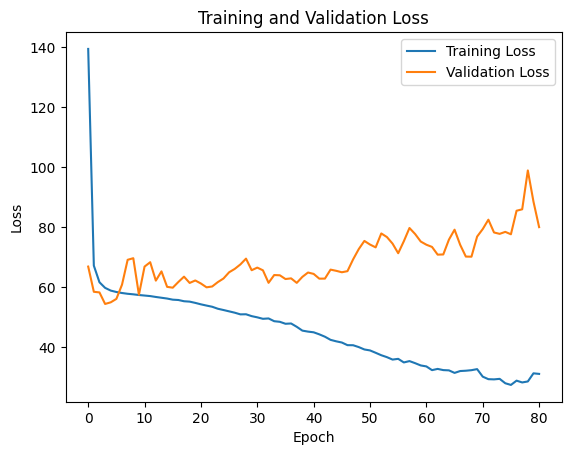

Model saved to models/gcesn_transformer_simulated.pth
Average Time per Epoch: 1.04s
Average CPU Usage: 26.06%
Average Memory Usage: 3.29GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 11.01%

Total Training Time: 83.94s
Max CPU Usage: 51.20%
Max Memory Usage: 3.29GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 13.50%


In [19]:
set_seed(42)
gcesn_transformer_simulated = GCESNTransformer(simulated_num_nodes, simulated_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_simulated.initialize_weights()
print(gcesn_transformer_simulated)
print(f"Total number of trainable parameters: {(gcesn_transformer_simulated.count_parameters())}\n")

train(gcesn_transformer_simulated, simulated_features_train.to(device), simulated_adj_train.to(device),  
    simulated_features_val.to(device), simulated_adj_val.to(device), lr=0.001, num_epochs=200, 
    patience=5, step_size=100, gamma=0.5, save_path='models/gcesn_transformer_simulated.pth')

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.0017541909


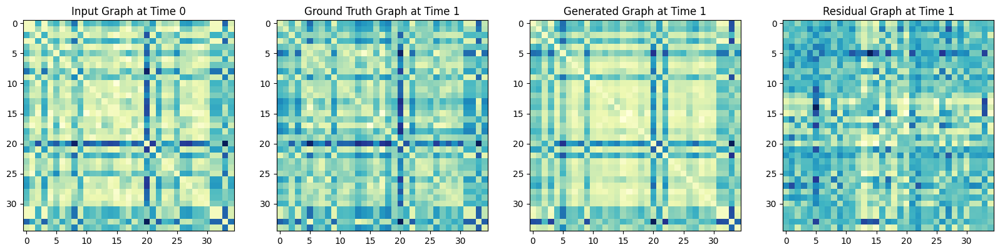

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.0018900854


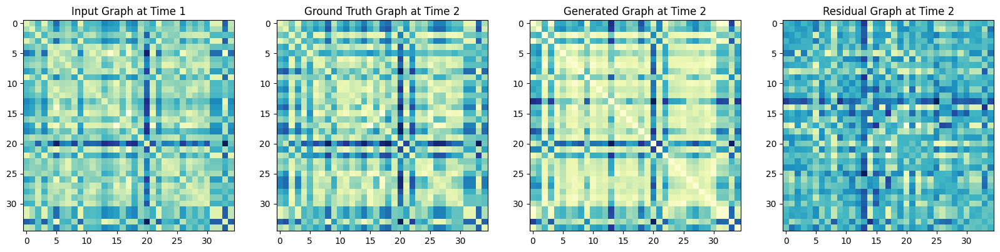

Mean Squared Error between ground truth graphs:  0.0023131445


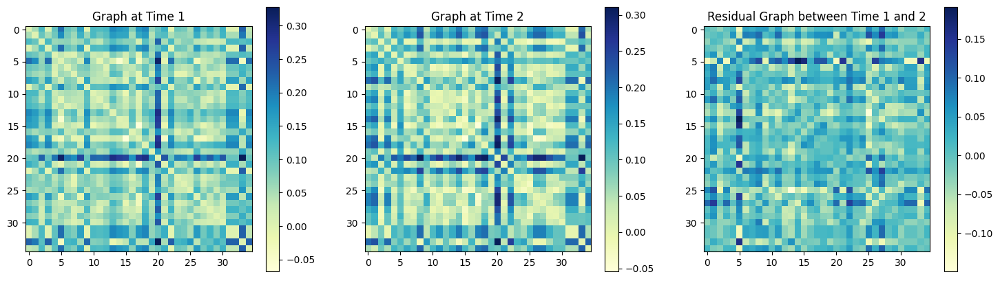

Mean Squared Error between generated graphs:  0.001109319


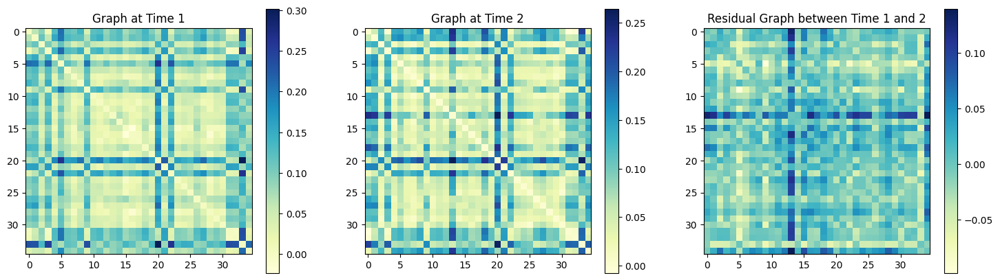

MAE:  0.037630267
Average Frobenius distance: 1.764885
Average Jaccard distance: 0.06925997410712284
Average MAE global efficiency: 0.0
Average MAE local efficiency: 0.0
Average MAE betweenness centrality: 0.25488668194550546
Average MAE eigenvector centrality: 0.02649427832311705


In [20]:
gcesn_transformer_simulated = GCESNTransformer(simulated_num_nodes, simulated_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_simulated.initialize_weights()
gcesn_transformer_simulated.load_state_dict(torch.load('models/gcesn_transformer_simulated.pth'))   
inference_model(gcesn_transformer_simulated.to(device), 
                simulated_features_test.to(device), simulated_adj_test.to(device), sample_idx=1)
evaluate_model(gcesn_transformer_simulated.to(device), simulated_features_test.to(device), simulated_adj_test.to(device))

### OASIS

#### 3-fold CV

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 75827


Fold 1/3
Epoch 1
  Training -> Loss: 249098.8855, Generative Loss: 146.5420, Topological Loss: 235501.0578
  Validation -> Loss: 290.0552, Generative Loss: 101.3994, Topological Loss: 168.8115
Time: 0.91s, CPU: 18.55%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 5.00%
Epoch 2
  Training -> Loss:

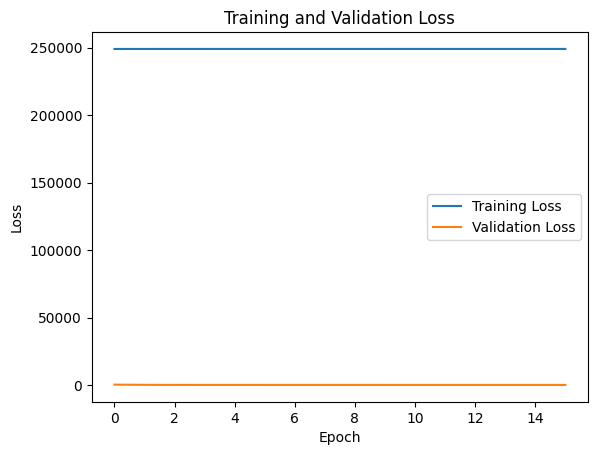

Model saved to models/gcesn_transformer_oasis.pth
Power iteration failed to converge. Returning 0 for all nodes.
Power iteration failed to converge. Returning 0 for all nodes.
Fold 1 Results:
   MAE: 0.054784487932920456
   Average Frobenius distance: 2.874610662460327
   Average MAE node strength: 0.9874893333462079
   Average MAE clustering coefficient: 0.1130365518886931
   Average MAE betweenness centrality: 0.09944813630310795
   Average MAE eigenvector centrality: 0.02882272047692896

Fold 2/3
Epoch 1
  Training -> Loss: 249090.2296, Generative Loss: 149.6378, Topological Loss: 235490.4560
  Validation -> Loss: 147.4378, Generative Loss: 67.7753, Topological Loss: 72.4969
Time: 0.91s, CPU: 19.45%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 5.00%
Epoch 2
  Training -> Loss: 249067.0405, Generative Loss: 137.3949, Topological Loss: 235480.8769
  Validation -> Loss: 128.1191, Generative Loss: 64.2155, Topological Loss: 57.6789
Time: 0.94s, CPU: 14.20%, Memory: 3.72GB, GPU: 0.02GB, GPU U

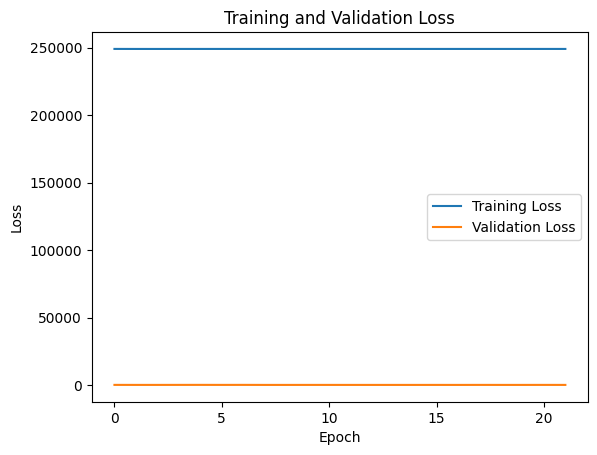

Model saved to models/gcesn_transformer_oasis.pth
Fold 2 Results:
   MAE: 0.04803864657878876
   Average Frobenius distance: 2.141822099685669
   Average MAE node strength: 0.8402501419703345
   Average MAE clustering coefficient: 0.17213718803294983
   Average MAE betweenness centrality: 0.08338916946525364
   Average MAE eigenvector centrality: 0.02149276813872354

Fold 3/3
Epoch 1
  Training -> Loss: 172.4487, Generative Loss: 65.7788, Topological Loss: 98.3074
  Validation -> Loss: 5163.2265, Generative Loss: 230.7677, Topological Loss: 4374.2120
Time: 1.11s, CPU: 34.40%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 3.50%
Epoch 2
  Training -> Loss: 144.1933, Generative Loss: 53.7680, Topological Loss: 84.3270
  Validation -> Loss: 1818.5527, Generative Loss: 179.6118, Topological Loss: 1331.5438
Time: 1.13s, CPU: 44.75%, Memory: 3.72GB, GPU: 0.02GB, GPU Util: 7.00%
Epoch 3
  Training -> Loss: 143.5102, Generative Loss: 53.3022, Topological Loss: 84.1605
  Validation -> Loss: 859.0802, G

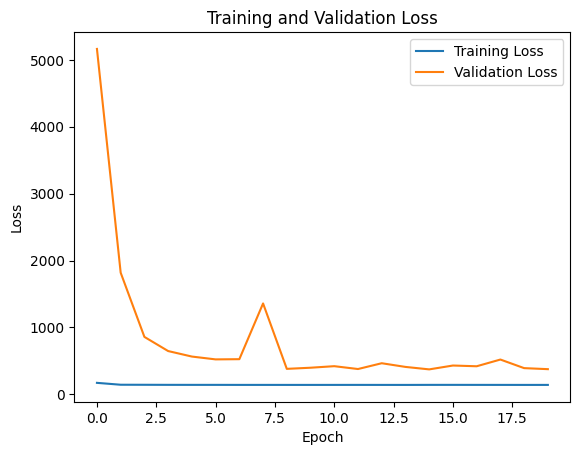

Model saved to models/gcesn_transformer_oasis.pth
Fold 3 Results:
   MAE: 0.16611114144325256
   Average Frobenius distance: 19.882953643798828
   Average MAE node strength: 5.005719927258426
   Average MAE clustering coefficient: 0.07913360230332604
   Average MAE betweenness centrality: 0.09375700292385386
   Average MAE eigenvector centrality: 0.023306059819494702

Cross-Validation Results:
mae: Mean = 0.0896, Std = 0.05
frobenius_distance: Mean = 8.2998, Std = 8.20
mae_ns: Mean = 2.2778, Std = 1.93
mae_cc: Mean = 0.1214, Std = 0.04
mae_bc: Mean = 0.0922, Std = 0.01
mae_ec: Mean = 0.0245, Std = 0.00
epochs: Mean = 19.3333, Std = 2.49
training_times: Mean = 19.5528, Std = 2.79
avg_memory_usage: Mean = 3.7212, Std = 0.00
avg_gpu_usage: Mean = 0.0183, Std = 0.00
max_memory_usage: Mean = 3.7212, Std = 0.00
max_gpu_usage: Mean = 0.0183, Std = 0.00


In [13]:
set_seed(42)
gcesn_transformer_oasis = GCESNTransformer(oasis_num_nodes, oasis_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=0.8, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_oasis.initialize_weights()
print(gcesn_transformer_oasis)
print(f"Total number of trainable parameters: {(gcesn_transformer_oasis.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcesn_transformer_oasis, oasis_features, oasis_adj, 
    lr=0.01, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
    save_path='models/gcesn_transformer_oasis.pth')

#### Simple Train-Test

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 75827

Epoch 1
  Training -> Loss: 217656.4101, Generative Loss: 139.5791, Topological Loss: 205765.1216
  Validation -> Loss: 211.5836, Generative Loss: 79.7890, Topological Loss: 122.6618
Time: 0.62s, CPU: 10.45%, Memory: 4.72GB, GPU: 0.02GB, GPU Util: 8.50%
Epoch 2
  Training -> Loss: 217628.751

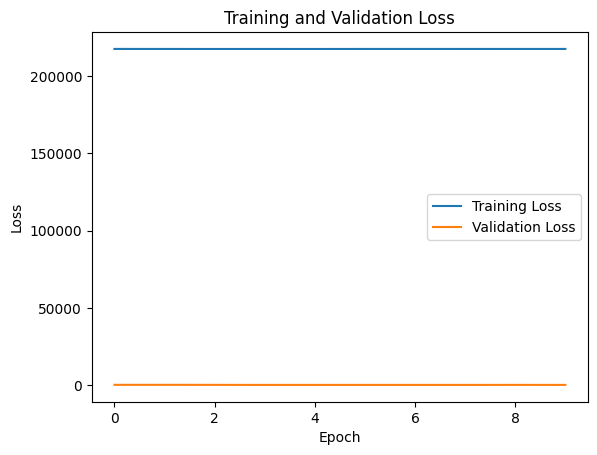

Model saved to models/gcesn_transformer_oasis.pth
Average Time per Epoch: 0.63s
Average CPU Usage: 13.94%
Average Memory Usage: 4.72GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 16.40%

Total Training Time: 6.30s
Max CPU Usage: 20.15%
Max Memory Usage: 4.72GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 17.50%


In [41]:
set_seed(42)
gcesn_transformer_oasis = GCESNTransformer(oasis_num_nodes, oasis_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_oasis.initialize_weights()
print(gcesn_transformer_oasis)
print(f"Total number of trainable parameters: {(gcesn_transformer_oasis.count_parameters())}\n")

train(gcesn_transformer_oasis, oasis_features_train.to(device), oasis_adj_train.to(device),  
    oasis_features_val.to(device), oasis_adj_val.to(device), lr=0.001, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/gcesn_transformer_oasis.pth')

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.0040378873


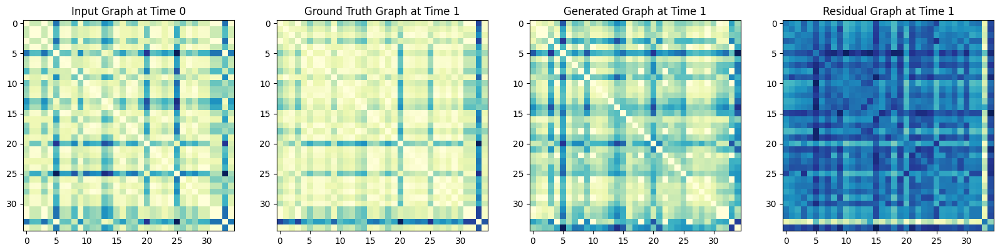

Mean Squared Error between ground truth graphs:  0.0021468746


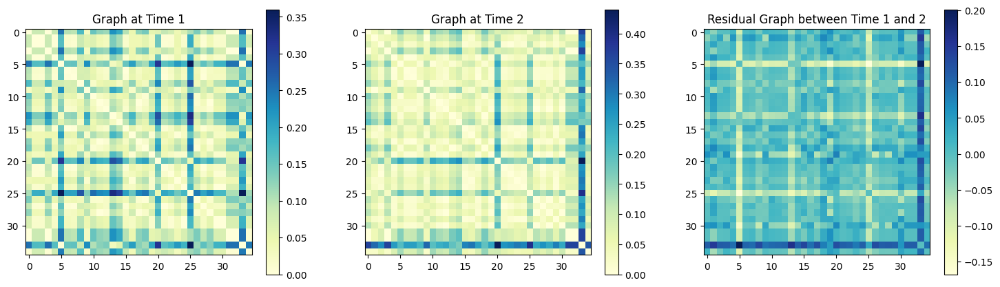

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.0037063016


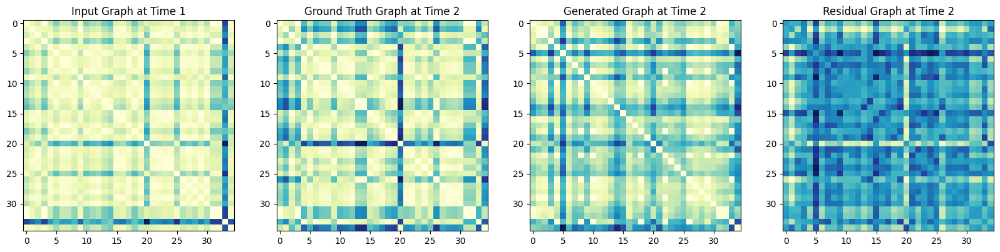

Mean Squared Error between ground truth graphs:  0.0046917056


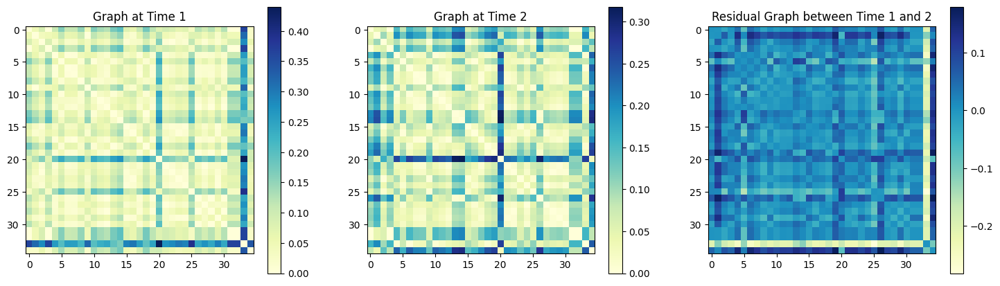

Mean Squared Error between generated graphs:  3.5541394e-05


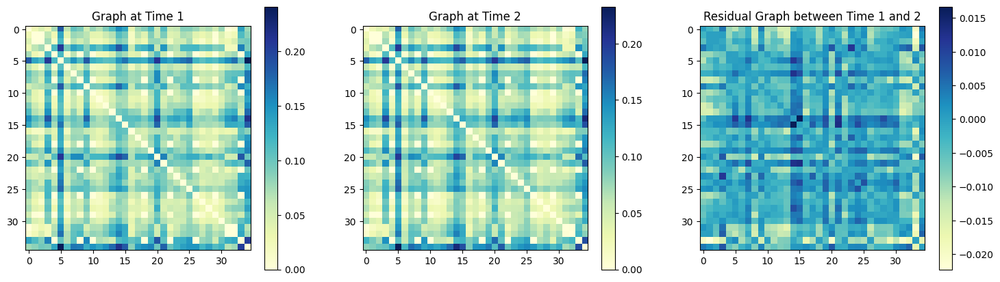

MAE:  0.08752272
Average Frobenius distance: 4.3141885
Average MAE node strength: 2.114974567655348
Average MAE clustering coefficient: 0.0964987883069049
Average MAE closeness centrality: 5.371517305196332
Average MAE betweenness centrality: 0.08888667306471927
Average MAE eigenvector centrality: 0.03866854212460517


In [43]:
set_seed(42)
gcesn_transformer_oasis = GCESNTransformer(oasis_num_nodes, oasis_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_oasis.initialize_weights()
gcesn_transformer_oasis.load_state_dict(torch.load('models/gcesn_transformer_oasis.pth'))   
inference_model(gcesn_transformer_oasis.to(device), oasis_features_test.to(device), oasis_adj_test.to(device), sample_idx=1)

set_seed(42)
metrices = evaluate_model(gcesn_transformer_oasis.to(device), oasis_features_test.to(device), oasis_adj_test.to(device))

### EMCI-AD

#### 3-fold CV

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 8)
    (bn0): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=8, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=16, bias=True)
    (fc): Linear(in_features=560, out_features=16, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=16, out_features=560, bias=True)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=8, bias=True)
    (fc2): Linear(in_features=8, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 19499


Fold 1/3
Epoch 1
  Training -> Loss: 4147.3209, Generative Loss: 432.4672, Topological Loss: 3289.2227
  Validation -> Loss: 11431.9133, Generative Loss: 600.6124, Topological Loss: 10119.8069
Time: 0.28s, CPU: 29.95%, Memory: 4.50GB, GPU: 0.02GB, GPU Util: 6.00%
Epoch 2
  Training -> Loss: 1267.5

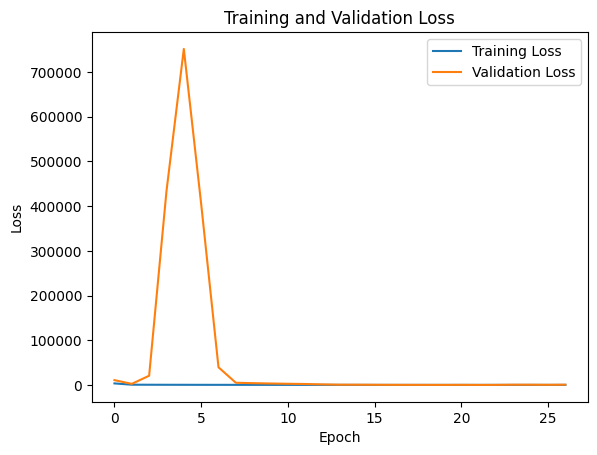

Model saved to models/gcesn_transformer_emci.pth
Fold 1 Results:
   MAE: 0.1949382722377777
   Average Frobenius distance: 9.186197280883789
   Average MAE node strength: 2.8654453246050005
   Average MAE clustering coefficient: 0.045434238709312416
   Average MAE betweenness centrality: 0.10220435554315595
   Average MAE eigenvector centrality: 0.011132321510259929

Fold 2/3
Epoch 1
  Training -> Loss: 4259.8042, Generative Loss: 427.5275, Topological Loss: 3404.1921
  Validation -> Loss: 1587.3230, Generative Loss: 263.5713, Topological Loss: 1199.1574
Time: 0.28s, CPU: 15.05%, Memory: 4.50GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 1086.1777, Generative Loss: 238.8280, Topological Loss: 763.1787
  Validation -> Loss: 9889.5600, Generative Loss: 505.6208, Topological Loss: 8759.3219
Time: 0.28s, CPU: 14.65%, Memory: 4.50GB, GPU: 0.02GB, GPU Util: 8.50%
Epoch 3
  Training -> Loss: 1014.3072, Generative Loss: 232.1497, Topological Loss: 703.7334
  Validation -> Loss: 3

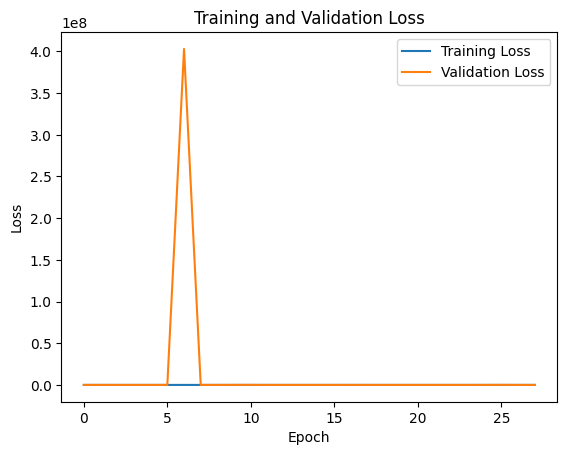

Model saved to models/gcesn_transformer_emci.pth
Fold 2 Results:
   MAE: 0.1995113044977188
   Average Frobenius distance: 10.335680961608887
   Average MAE node strength: 2.628757241027968
   Average MAE clustering coefficient: 0.058703798250564494
   Average MAE betweenness centrality: 0.09137365138893024
   Average MAE eigenvector centrality: 0.011706161743876764

Fold 3/3
Epoch 1
  Training -> Loss: 4181.9252, Generative Loss: 444.7758, Topological Loss: 3288.5224
  Validation -> Loss: 7501.8880, Generative Loss: 418.2631, Topological Loss: 6718.8477
Time: 0.33s, CPU: 24.30%, Memory: 3.94GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 1111.2965, Generative Loss: 255.4345, Topological Loss: 761.1567
  Validation -> Loss: 8444.6047, Generative Loss: 502.4594, Topological Loss: 7409.1534
Time: 0.28s, CPU: 12.30%, Memory: 3.94GB, GPU: 0.02GB, GPU Util: 8.50%
Epoch 3
  Training -> Loss: 982.0500, Generative Loss: 240.3518, Topological Loss: 658.7330
  Validation -> Loss: 98

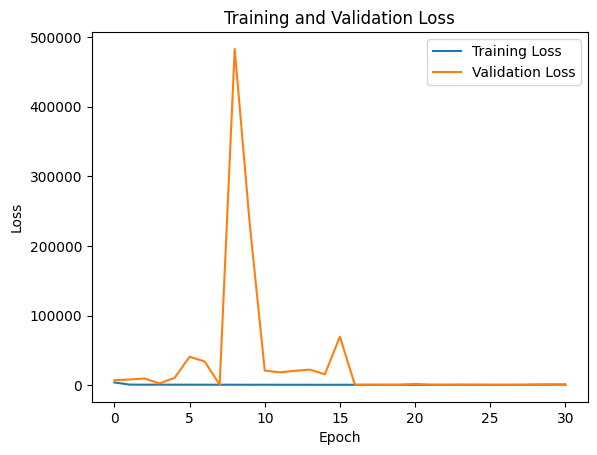

Model saved to models/gcesn_transformer_emci.pth
Fold 3 Results:
   MAE: 0.16349923610687256
   Average Frobenius distance: 7.583666801452637
   Average MAE node strength: 2.1552602625907675
   Average MAE clustering coefficient: 0.03626428430451129
   Average MAE betweenness centrality: 0.09256957328385897
   Average MAE eigenvector centrality: 0.008971091635810302

Cross-Validation Results:
mae: Mean = 0.1860, Std = 0.02
frobenius_distance: Mean = 9.0352, Std = 1.13
mae_ns: Mean = 2.5498, Std = 0.30
mae_cc: Mean = 0.0468, Std = 0.01
mae_bc: Mean = 0.0954, Std = 0.00
mae_ec: Mean = 0.0106, Std = 0.00
epochs: Mean = 28.6667, Std = 1.70
training_times: Mean = 8.7594, Std = 0.44
avg_memory_usage: Mean = 4.3144, Std = 0.27
avg_gpu_usage: Mean = 0.0167, Std = 0.00
max_memory_usage: Mean = 4.3145, Std = 0.27
max_gpu_usage: Mean = 0.0167, Std = 0.00


In [21]:
set_seed(42)
gcesn_transformer_emci = GCESNTransformer(emci_num_nodes, emci_num_features, latent_dim=16, 
                                        encoder_hidden_dims=8, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=8, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_emci.initialize_weights()
print(gcesn_transformer_emci)
print(f"Total number of trainable parameters: {(gcesn_transformer_emci.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcesn_transformer_emci, emci_features, emci_adj, 
    lr=0.05, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
    save_path='models/gcesn_transformer_emci.pth')

#### Simple Train-Test

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 8)
    (bn0): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=8, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=16, bias=True)
    (fc): Linear(in_features=560, out_features=16, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=16, out_features=560, bias=True)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=8, bias=True)
    (fc2): Linear(in_features=8, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 19499

Epoch 1
  Training -> Loss: 35056.2246, Generative Loss: 910.5120, Topological Loss: 32588.8432
  Validation -> Loss: 36676.9645, Generative Loss: 933.9185, Topological Loss: 34123.2311
Time: 0.17s, CPU: 9.80%, Memory: 4.68GB, GPU: 0.02GB, GPU Util: 5.00%
Epoch 2
  Training -> Loss: 28958.5307, Gen

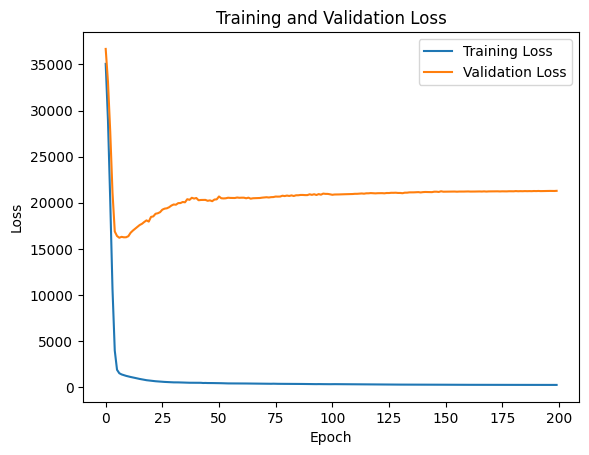

Model saved to models/gcesn_transformer_emci.pth
Average Time per Epoch: 0.18s
Average CPU Usage: 18.23%
Average Memory Usage: 4.68GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 15.57%

Total Training Time: 36.52s
Max CPU Usage: 51.15%
Max Memory Usage: 4.68GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 17.00%


In [35]:
set_seed(42)
gcesn_transformer_emci = GCESNTransformer(emci_num_nodes, emci_num_features, latent_dim=16, 
                                        encoder_hidden_dims=8, encoder_leaky_rate=0.9, encoder_iteration=2,
                                        decoder_hidden_dims=8, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_emci.initialize_weights()
print(gcesn_transformer_emci)
print(f"Total number of trainable parameters: {(gcesn_transformer_emci.count_parameters())}\n")

train(gcesn_transformer_emci, emci_features_train.to(device), emci_adj_train.to(device),  
    emci_features_val.to(device), emci_adj_val.to(device), lr=0.0005, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/gcesn_transformer_emci.pth')

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.94143784


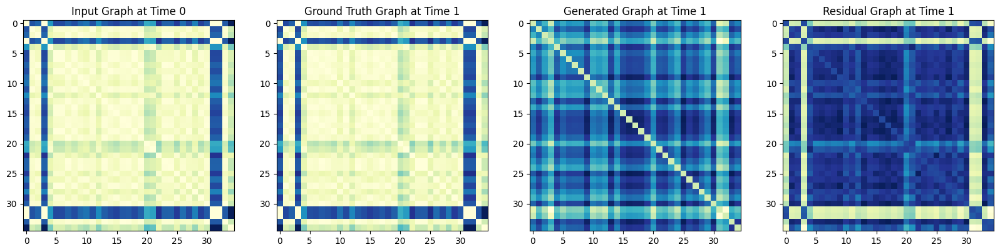

Mean Squared Error between ground truth graphs:  0.0053027626


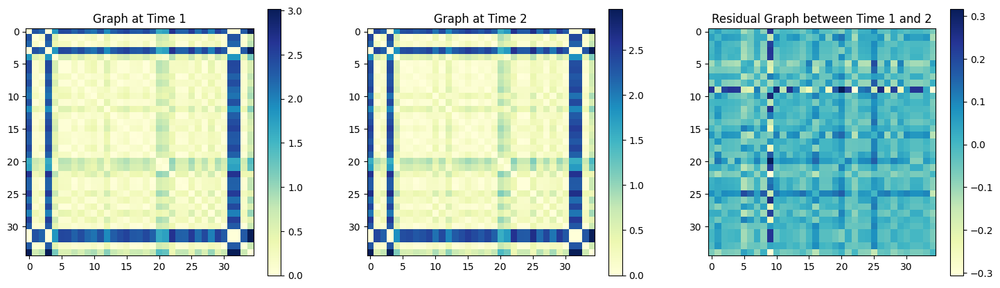

MAE:  0.62979966
Average Frobenius distance: 33.122234
Average MAE node strength: 11.879528322931314
Average MAE clustering coefficient: 0.39671763300171115
Average MAE closeness centrality: 2.072967170686135
Average MAE betweenness centrality: 0.12406414687086956
Average MAE eigenvector centrality: 0.06318966858468221


In [38]:
set_seed(42)
gcesn_transformer_emci = GCESNTransformer(emci_num_nodes, emci_num_features, latent_dim=16, 
                                        encoder_hidden_dims=8, encoder_leaky_rate=0.9, encoder_iteration=3,
                                        decoder_hidden_dims=8, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_emci.initialize_weights()
gcesn_transformer_emci.load_state_dict(torch.load('models/gcesn_transformer_emci.pth'))
inference_model(gcesn_transformer_emci.to(device), emci_features_test.to(device), emci_adj_test.to(device), sample_idx=1)
metrics = evaluate_model(gcesn_transformer_emci, emci_features_test.to(device), emci_adj_test.to(device))

### SLIM160

#### 3-fold CV

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 32)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=64, bias=True)
    (fc): Linear(in_features=10240, out_features=64, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=64, out_features=10240, bias=True)
    (bn0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=64, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=160, bias=True)
  )
)
Total number of trainable parameters: 1335200


Fold 1/3
Epoch 1
  Training -> Loss: 30644.1017, Generative Loss: 3770.1532, Topological Loss: 25990.1291
  Validation -> Loss: 23697.1245, Generative Loss: 3494.1391, Topological Loss: 19493.8466
Time: 0.99s, CPU: 27.70%, Memory: 3.75GB, GPU: 0.05GB, GPU Util: 10.00%
Epoch 2
  Trainin

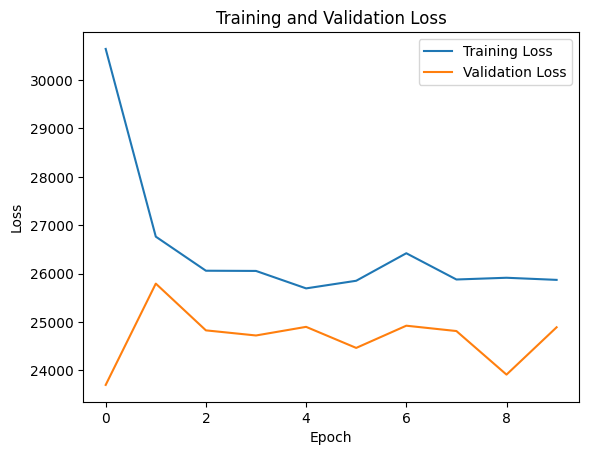

Model saved to models/gcesn_transformer_slim160.pth
Fold 1 Results:
   MAE: 0.14930425584316254
   Average Frobenius distance: 28.551471710205078
   Average MAE node strength: 9.278009842162508
   Average MAE clustering coefficient: 0.49215119108714944
   Average MAE betweenness centrality: 0.028260618586702292
   Average MAE eigenvector centrality: 0.022811052643661758

Fold 2/3
Epoch 1
  Training -> Loss: 43422.7614, Generative Loss: 3999.2046, Topological Loss: 38413.6153
  Validation -> Loss: 21956.4240, Generative Loss: 3679.7651, Topological Loss: 17538.4373
Time: 1.08s, CPU: 33.15%, Memory: 3.75GB, GPU: 0.05GB, GPU Util: 10.00%
Epoch 2
  Training -> Loss: 34913.7554, Generative Loss: 3732.8448, Topological Loss: 30300.4143
  Validation -> Loss: 15521.2386, Generative Loss: 3468.5983, Topological Loss: 11360.7218
Time: 0.99s, CPU: 22.40%, Memory: 3.75GB, GPU: 0.06GB, GPU Util: 20.50%
Epoch 3
  Training -> Loss: 33839.1452, Generative Loss: 3717.5041, Topological Loss: 29251.3800


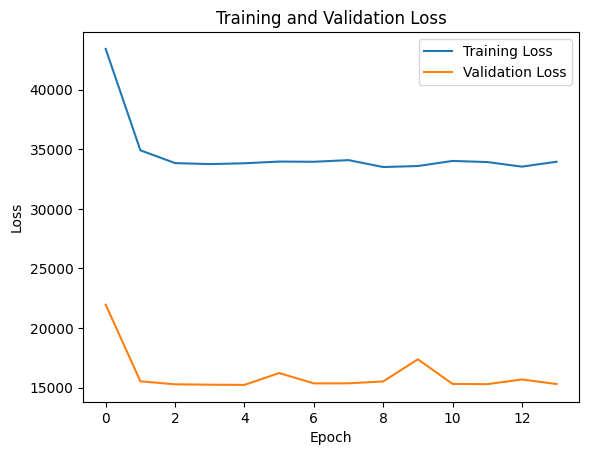

Model saved to models/gcesn_transformer_slim160.pth
Fold 2 Results:
   MAE: 0.14075085520744324
   Average Frobenius distance: 26.971195220947266
   Average MAE node strength: 7.7837404718284136
   Average MAE clustering coefficient: 0.4630020457430501
   Average MAE betweenness centrality: 0.022409253951826198
   Average MAE eigenvector centrality: 0.02452233413711922

Fold 3/3
Epoch 1
  Training -> Loss: 35540.7226, Generative Loss: 3873.0711, Topological Loss: 30714.0270
  Validation -> Loss: 21257.7480, Generative Loss: 3426.2600, Topological Loss: 17142.8884
Time: 1.08s, CPU: 21.95%, Memory: 3.95GB, GPU: 0.05GB, GPU Util: 9.50%
Epoch 2
  Training -> Loss: 29309.0310, Generative Loss: 3679.1650, Topological Loss: 24782.8228
  Validation -> Loss: 21607.1243, Generative Loss: 3483.0130, Topological Loss: 17416.7505
Time: 1.17s, CPU: 28.65%, Memory: 3.95GB, GPU: 0.06GB, GPU Util: 16.00%
Epoch 3
  Training -> Loss: 29206.1959, Generative Loss: 3657.7128, Topological Loss: 24704.3314
  

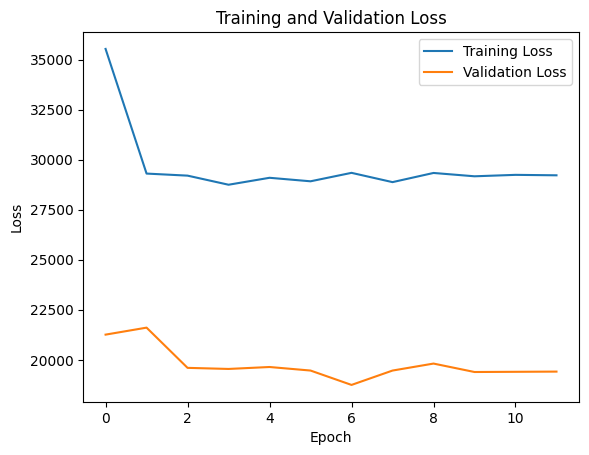

Model saved to models/gcesn_transformer_slim160.pth
Fold 3 Results:
   MAE: 0.14168226718902588
   Average Frobenius distance: 27.860212326049805
   Average MAE node strength: 8.6339205696444
   Average MAE clustering coefficient: 0.3828926496688854
   Average MAE betweenness centrality: 0.022767021932967122
   Average MAE eigenvector centrality: 0.0224377226405784

Cross-Validation Results:
mae: Mean = 0.1439, Std = 0.00
frobenius_distance: Mean = 27.7943, Std = 0.65
mae_ns: Mean = 8.5652, Std = 0.61
mae_cc: Mean = 0.4460, Std = 0.05
mae_bc: Mean = 0.0245, Std = 0.00
mae_ec: Mean = 0.0233, Std = 0.00
epochs: Mean = 12.0000, Std = 1.63
training_times: Mean = 12.8283, Std = 1.72
avg_memory_usage: Mean = 3.8183, Std = 0.10
avg_gpu_usage: Mean = 0.0579, Std = 0.00
max_memory_usage: Mean = 3.8183, Std = 0.10
max_gpu_usage: Mean = 0.0585, Std = 0.00


In [15]:
set_seed(42)
gcesn_transformer_slim160 = GCESNTransformer(slim160_num_nodes, slim160_num_features, latent_dim=64, 
                                        encoder_hidden_dims=32, encoder_leaky_rate=1, encoder_iteration=3,
                                        decoder_hidden_dims=32, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_slim160.initialize_weights()
print(gcesn_transformer_slim160)
print(f"Total number of trainable parameters: {(gcesn_transformer_slim160.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(gcesn_transformer_slim160, slim160_features, slim160_adj, 
    lr=0.01, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
    save_path='models/gcesn_transformer_slim160.pth')

#### Simple Train-Test

GCESNTransformer(
  (encoder): GCESNEncoder(
    (gat): GAT (8 -> 32)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=64, bias=True)
    (fc): Linear(in_features=10240, out_features=64, bias=True)
  )
  (decoder): GCESNDecoder(
    (fc): Linear(in_features=64, out_features=10240, bias=True)
    (bn0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=64, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=160, bias=True)
  )
)
Total number of trainable parameters: 1335200

Epoch 1
  Training -> Loss: 49761.6554, Generative Loss: 4465.5471, Topological Loss: 43965.8167
  Validation -> Loss: 49541.4774, Generative Loss: 3867.1533, Topological Loss: 44567.8078
Time: 0.68s, CPU: 23.90%, Memory: 4.75GB, GPU: 0.06GB, GPU Util: 13.50%
Epoch 2
  Training -> Loss:

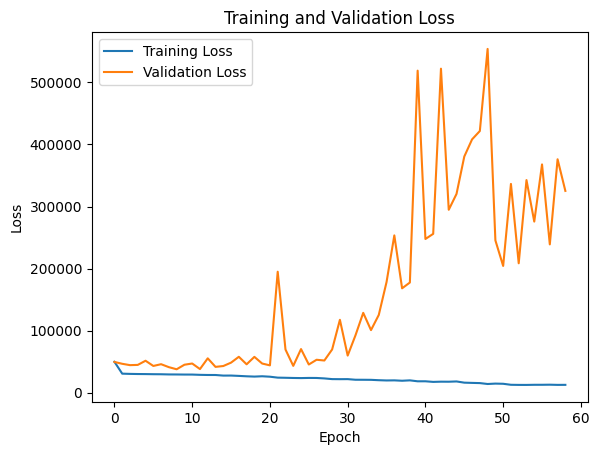

Model saved to models/gcesn_transformer_slim160.pth
Average Time per Epoch: 0.66s
Average CPU Usage: 18.35%
Average Memory Usage: 4.75GB
Average GPU Usage: 0.07GB
Average GPU Utilization: 28.09%

Total Training Time: 39.05s
Max CPU Usage: 40.05%
Max Memory Usage: 4.75GB
Max GPU Usage: 0.07GB
Max GPU Utilization: 30.50%


In [182]:
set_seed(42)
gcesn_transformer_slim160 = GCESNTransformer(slim160_num_nodes, slim160_num_features, latent_dim=64, 
                                        encoder_hidden_dims=32, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=32, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_slim160.initialize_weights()
print(gcesn_transformer_slim160)
print(f"Total number of trainable parameters: {(gcesn_transformer_slim160.count_parameters())}\n")

train(gcesn_transformer_slim160, slim160_features_train.to(device), slim160_adj_train.to(device),  
    slim160_features_val.to(device), slim160_adj_val.to(device), lr=0.0005, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/gcesn_transformer_slim160.pth')

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.08718879


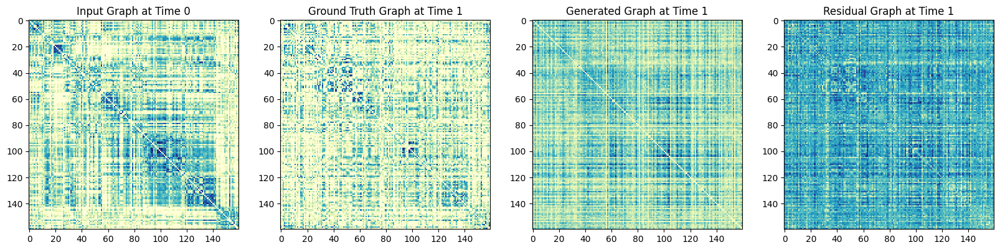

Mean Squared Error between ground truth graphs:  0.05161524


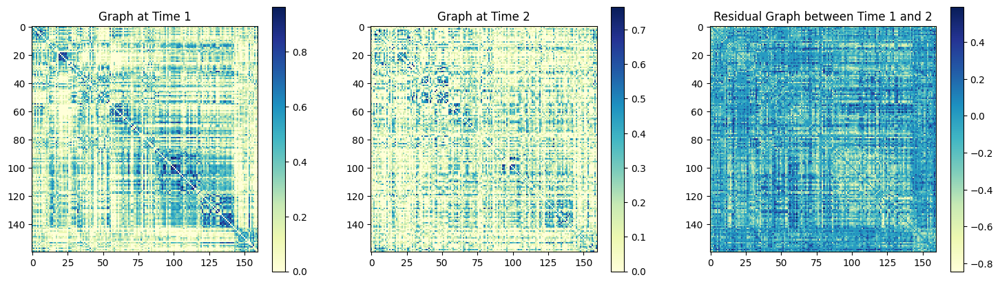

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.049162492


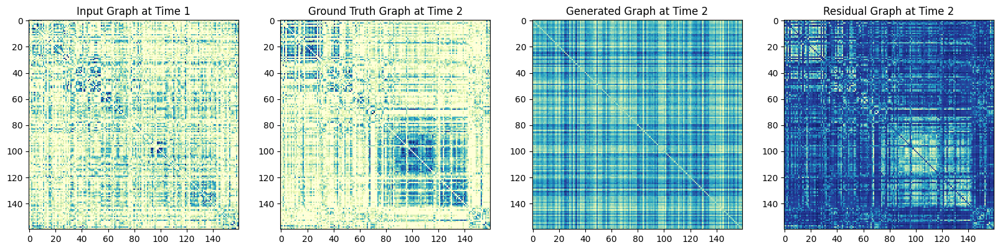

Mean Squared Error between ground truth graphs:  0.03758247


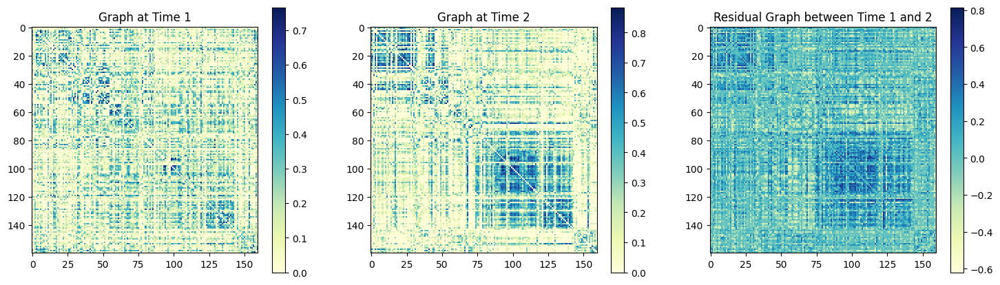

Mean Squared Error between generated graphs:  0.118665084


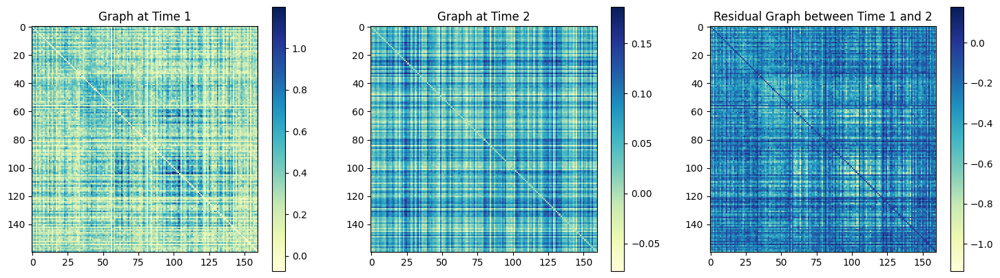

KeyboardInterrupt: 

In [183]:
set_seed(42)
gcesn_transformer_slim160 = GCESNTransformer(slim160_num_nodes, slim160_num_features, latent_dim=64, 
                                        encoder_hidden_dims=32, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=32, decoder_leaky_rate=1, decoder_iteration=1)
gcesn_transformer_slim160.initialize_weights()
gcesn_transformer_slim160.load_state_dict(torch.load('models/gcesn_transformer_slim160.pth'))
inference_model(gcesn_transformer_slim160.to(device), 
                slim160_features_test.to(device), slim160_adj_test.to(device), sample_idx=0)
metrics = evaluate_model(gcesn_transformer_slim160.to(device), slim160_features_test.to(device), slim160_adj_test.to(device))

## Trainable GCESN

### Simulated

#### 3-Fold CV

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 78387


Fold 1/3
Epoch 1
  Training -> Loss: 87.0019, Generative Loss: 49.0357, Topological Loss: 34.1178
  Validation -> Loss: 56.2795, Generative Loss: 37.4591, Topological Loss: 16.7638
Time: 2.01s, CPU: 22.45%, Memory: 4.29GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Tr

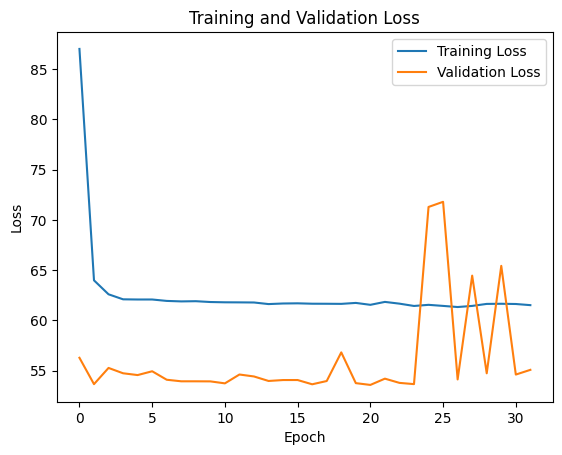

Model saved to models/trainablegcesn_transformer_simulated.pth
Fold 1 Results:
   MAE: 0.030805354937911034
   Average Frobenius distance: 1.4030593633651733
   Average MAE node strength: 0.5437561373552979
   Average MAE clustering coefficient: 0.09547104068225443
   Average MAE betweenness centrality: 0.24251486690933052
   Average MAE eigenvector centrality: 0.020149206716611235

Fold 2/3
Epoch 1
  Training -> Loss: 83.0984, Generative Loss: 48.0876, Topological Loss: 31.2955
  Validation -> Loss: 57.7838, Generative Loss: 37.1752, Topological Loss: 18.6784
Time: 1.55s, CPU: 16.40%, Memory: 4.32GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 62.0260, Generative Loss: 38.0472, Topological Loss: 21.8120
  Validation -> Loss: 55.1810, Generative Loss: 36.1844, Topological Loss: 17.1692
Time: 1.65s, CPU: 13.90%, Memory: 4.32GB, GPU: 0.02GB, GPU Util: 7.50%
Epoch 3
  Training -> Loss: 60.6923, Generative Loss: 37.1511, Topological Loss: 21.4662
  Validation -> Loss: 52.9319,

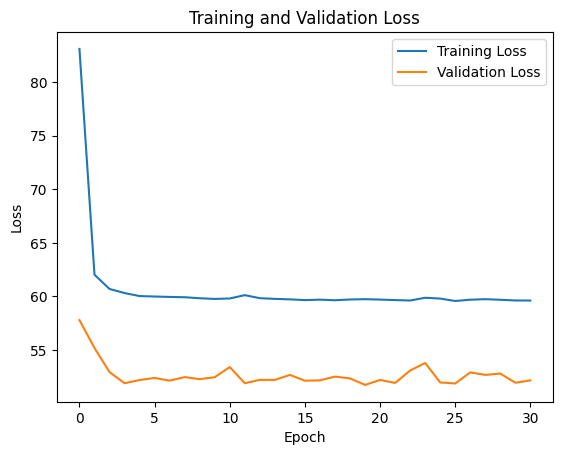

Model saved to models/trainablegcesn_transformer_simulated.pth
Fold 2 Results:
   MAE: 0.031218750402331352
   Average Frobenius distance: 1.4330235719680786
   Average MAE node strength: 0.5474886768672904
   Average MAE clustering coefficient: 0.07533792058238659
   Average MAE betweenness centrality: 0.23386191942341672
   Average MAE eigenvector centrality: 0.0212408623133429

Fold 3/3
Epoch 1
  Training -> Loss: 81.1183, Generative Loss: 46.6086, Topological Loss: 31.0234
  Validation -> Loss: 59.4322, Generative Loss: 36.5559, Topological Loss: 20.7787
Time: 1.70s, CPU: 17.65%, Memory: 4.32GB, GPU: 0.02GB, GPU Util: 4.50%
Epoch 2
  Training -> Loss: 63.0372, Generative Loss: 37.9015, Topological Loss: 22.9697
  Validation -> Loss: 55.9437, Generative Loss: 34.9631, Topological Loss: 19.0530
Time: 1.55s, CPU: 12.15%, Memory: 4.32GB, GPU: 0.02GB, GPU Util: 9.00%
Epoch 3
  Training -> Loss: 61.4056, Generative Loss: 36.9415, Topological Loss: 22.3894
  Validation -> Loss: 54.8340, G

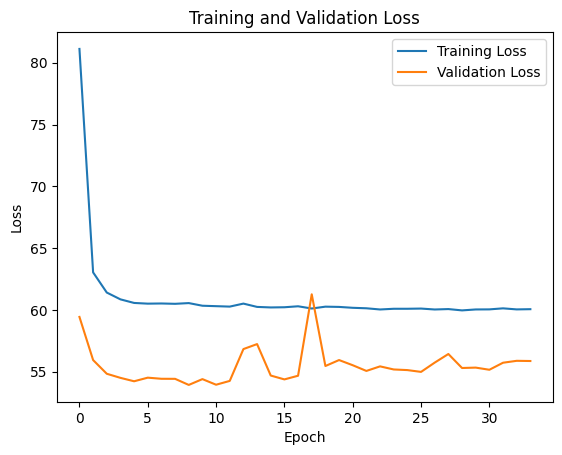

Model saved to models/trainablegcesn_transformer_simulated.pth
Fold 3 Results:
   MAE: 0.03284493088722229
   Average Frobenius distance: 1.5102901458740234
   Average MAE node strength: 0.5208398253606119
   Average MAE clustering coefficient: 0.09364762583683578
   Average MAE betweenness centrality: 0.25323209173476546
   Average MAE eigenvector centrality: 0.02156638663425727

Cross-Validation Results:
mae: Mean = 0.0316, Std = 0.00
frobenius_distance: Mean = 1.4488, Std = 0.05
mae_ns: Mean = 0.5374, Std = 0.01
mae_cc: Mean = 0.0882, Std = 0.01
mae_bc: Mean = 0.2432, Std = 0.01
mae_ec: Mean = 0.0210, Std = 0.00
epochs: Mean = 32.3333, Std = 1.25
training_times: Mean = 53.0254, Std = 2.40
avg_memory_usage: Mean = 4.3150, Std = 0.00
avg_gpu_usage: Mean = 0.0182, Std = 0.00
max_memory_usage: Mean = 4.3151, Std = 0.00
max_gpu_usage: Mean = 0.0182, Std = 0.00


In [16]:
set_seed(42)
trainablegcesn_transformer_simulated = trainableGCESNTransformer(simulated_num_nodes, simulated_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_simulated)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_simulated.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(trainablegcesn_transformer_simulated, simulated_features, simulated_adj,  
                lr=0.01, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
                save_path='models/trainablegcesn_transformer_simulated.pth', is_esn=True)

#### Simple Train-Test

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=16, out_features=32, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=32, out_features=32, bias=True)
    )
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=32, out_features=16, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=16, out_features=35, bias=True)
    )
  )
)
Total number of trainable parameters: 78387

Epoch 1
  Training -> Loss: 86.6838, Generative Loss: 51.2073, Topological Loss: 31.2604


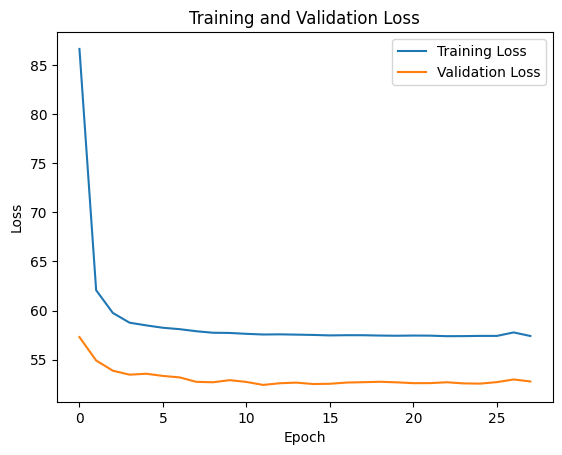

Model saved to models/trainablegcesn_transformer_simulated.pth
Average Time per Epoch: 1.89s
Average CPU Usage: 21.89%
Average Memory Usage: 3.35GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 9.61%

Total Training Time: 52.82s
Max CPU Usage: 37.85%
Max Memory Usage: 3.35GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 11.50%


In [39]:
set_seed(42)
trainablegcesn_transformer_simulated = trainableGCESNTransformer(simulated_num_nodes, simulated_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_simulated)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_simulated.count_parameters())}\n")

train(trainablegcesn_transformer_simulated, simulated_features_train.to(device), simulated_adj_train.to(device),  
    simulated_features_val.to(device), simulated_adj_val.to(device), lr=0.005, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/trainablegcesn_transformer_simulated.pth', is_esn=True)

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.001051609


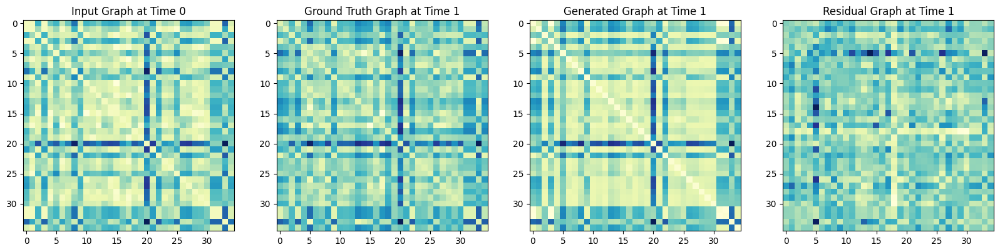

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.0012860387


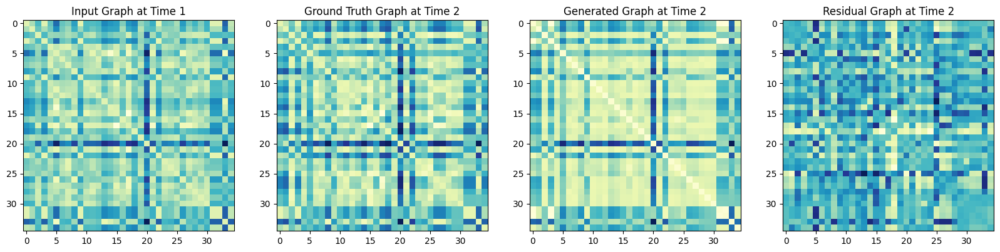

Mean Squared Error between ground truth graphs:  0.0023131445


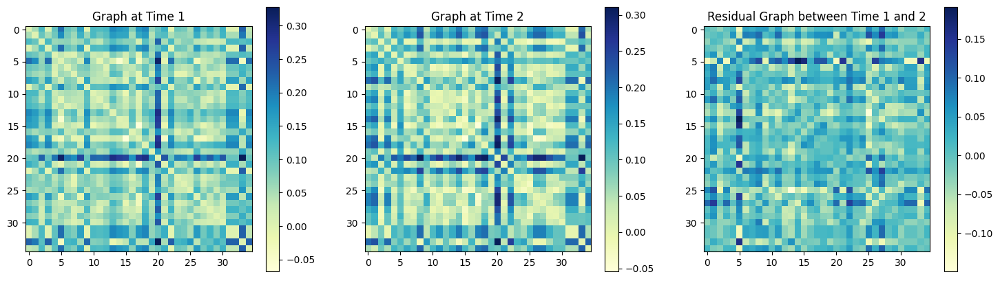

Mean Squared Error between generated graphs:  7.114775e-07


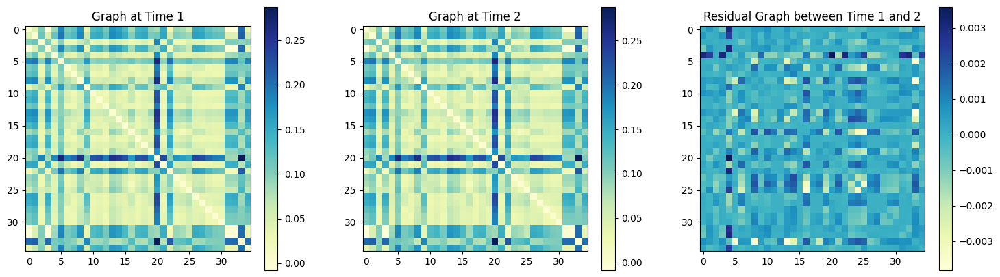

MAE:  0.03072733
Average Frobenius distance: 1.4243919
Average Jaccard distance: 0.06163531383244458
Average MAE global efficiency: 0.0
Average MAE local efficiency: 0.0
Average MAE betweenness centrality: 0.24632352941176466
Average MAE eigenvector centrality: 0.02043290463399469


In [40]:
set_seed(42)
trainablegcesn_transformer_simulated = trainableGCESNTransformer(simulated_num_nodes, simulated_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
trainablegcesn_transformer_simulated.load_state_dict(torch.load('models/trainablegcesn_transformer_simulated.pth'))   
inference_model(trainablegcesn_transformer_simulated.to(device), simulated_features_test.to(device), simulated_adj_test.to(device), sample_idx=1)
evaluate_model(trainablegcesn_transformer_simulated.to(device), simulated_features_test.to(device), simulated_adj_test.to(device))

### OASIS

#### 3-Fold CV

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 78387


Fold 1/3
Epoch 1
  Training -> Loss: 249112.7267, Generative Loss: 144.9416, Topological Loss: 235516.7392
  Validation -> Loss: 136.1442, Generative Loss: 71.5133, Topological Loss: 55.1060
Time: 1.81s, CPU: 12.65%, Memory: 3.93GB, GPU: 0.02GB, GPU Util: 4.50%
Ep

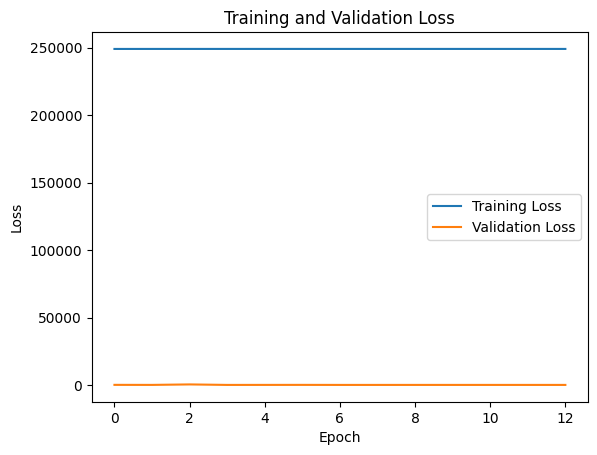

Model saved to models/trainablegcesn_transformer_oasis.pth
Power iteration failed to converge. Returning 0 for all nodes.
Power iteration failed to converge. Returning 0 for all nodes.
Power iteration failed to converge. Returning 0 for all nodes.
Power iteration failed to converge. Returning 0 for all nodes.
Fold 1 Results:
   MAE: 0.06828945130109787
   Average Frobenius distance: 3.387133836746216
   Average MAE node strength: 1.0564939474909645
   Average MAE clustering coefficient: 0.12406322991542441
   Average MAE betweenness centrality: 0.11209362637773236
   Average MAE eigenvector centrality: 0.03294813668137511

Fold 2/3
Epoch 1
  Training -> Loss: 249099.2260, Generative Loss: 148.0612, Topological Loss: 235500.5670
  Validation -> Loss: 120.0326, Generative Loss: 57.7314, Topological Loss: 57.1341
Time: 1.78s, CPU: 20.75%, Memory: 3.93GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 249064.1713, Generative Loss: 136.8358, Topological Loss: 235478.5615
  Validat

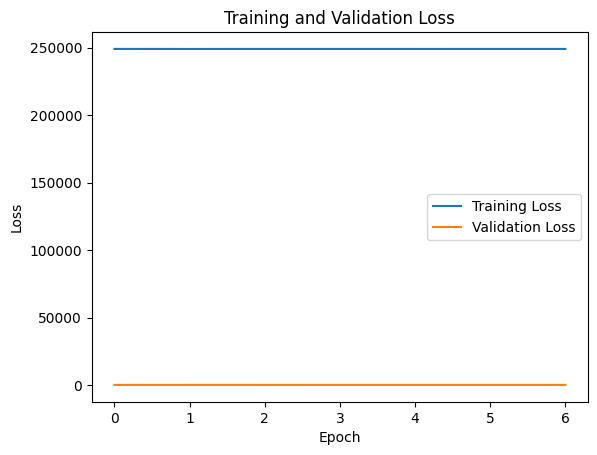

Model saved to models/trainablegcesn_transformer_oasis.pth
Fold 2 Results:
   MAE: 0.047790396958589554
   Average Frobenius distance: 2.1407523155212402
   Average MAE node strength: 0.9000767111790289
   Average MAE clustering coefficient: 0.14833999967599598
   Average MAE betweenness centrality: 0.08514913341893719
   Average MAE eigenvector centrality: 0.021915904843521496

Fold 3/3
Epoch 1
  Training -> Loss: 169.5685, Generative Loss: 64.2288, Topological Loss: 97.3265
  Validation -> Loss: 2334.6894, Generative Loss: 184.3797, Topological Loss: 1776.3054
Time: 1.86s, CPU: 28.20%, Memory: 3.93GB, GPU: 0.02GB, GPU Util: 4.50%
Epoch 2
  Training -> Loss: 142.9314, Generative Loss: 53.4500, Topological Loss: 83.4011
  Validation -> Loss: 986.5281, Generative Loss: 136.5627, Topological Loss: 692.7150
Time: 2.04s, CPU: 37.25%, Memory: 3.93GB, GPU: 0.02GB, GPU Util: 8.00%
Epoch 3
  Training -> Loss: 141.9453, Generative Loss: 52.6985, Topological Loss: 83.2600
  Validation -> Loss: 7

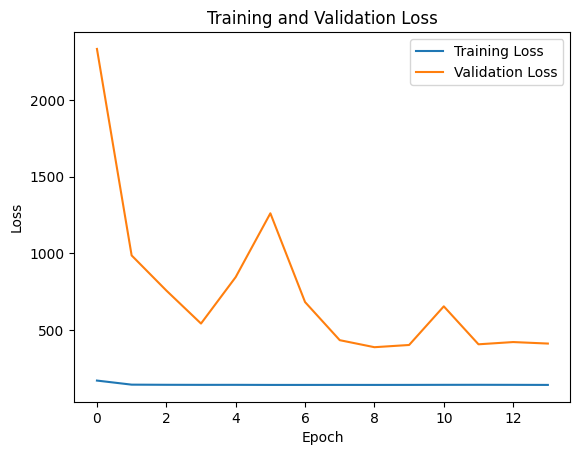

Model saved to models/trainablegcesn_transformer_oasis.pth
Fold 3 Results:
   MAE: 0.17001530528068542
   Average Frobenius distance: 20.027069091796875
   Average MAE node strength: 5.016243102489221
   Average MAE clustering coefficient: 0.1290953877040899
   Average MAE betweenness centrality: 0.08274405077534225
   Average MAE eigenvector centrality: 0.02512434162800634

Cross-Validation Results:
mae: Mean = 0.0954, Std = 0.05
frobenius_distance: Mean = 8.5183, Std = 8.15
mae_ns: Mean = 2.3243, Std = 1.90
mae_cc: Mean = 0.1338, Std = 0.01
mae_bc: Mean = 0.0933, Std = 0.01
mae_ec: Mean = 0.0267, Std = 0.00
epochs: Mean = 11.3333, Std = 3.09
training_times: Mean = 21.3737, Std = 5.43
avg_memory_usage: Mean = 3.9262, Std = 0.00
avg_gpu_usage: Mean = 0.0183, Std = 0.00
max_memory_usage: Mean = 3.9262, Std = 0.00
max_gpu_usage: Mean = 0.0183, Std = 0.00


In [26]:
set_seed(42)
trainablegcesn_transformer_oasis = trainableGCESNTransformer(oasis_num_nodes, oasis_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=0.8, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_oasis)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_oasis.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(trainablegcesn_transformer_oasis, oasis_features, oasis_adj, 
            lr=0.01, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
            save_path='models/trainablegcesn_transformer_oasis.pth', is_esn=True)

#### Simple Train-Test

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=16, out_features=32, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=32, out_features=32, bias=True)
    )
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=32, out_features=16, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=16, out_features=35, bias=True)
    )
  )
)
Total number of trainable parameters: 78387

Epoch 1
  Training -> Loss: 217688.9071, Generative Loss: 137.1316, Topological Loss: 205

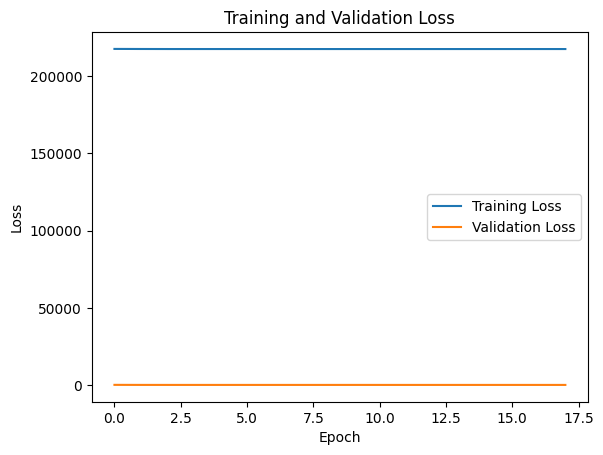

Model saved to models/trainablegcesn_transformer_oasis.pth
Average Time per Epoch: 2.15s
Average CPU Usage: 25.89%
Average Memory Usage: 3.35GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 9.33%

Total Training Time: 38.63s
Max CPU Usage: 51.00%
Max Memory Usage: 3.35GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 11.00%


In [37]:
set_seed(42)
trainablegcesn_transformer_oasis = trainableGCESNTransformer(oasis_num_nodes, oasis_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_oasis)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_oasis.count_parameters())}\n")

train(trainablegcesn_transformer_oasis, oasis_features_train.to(device), oasis_adj_train.to(device),  
    oasis_features_val.to(device), oasis_adj_val.to(device), lr=0.005, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/trainablegcesn_transformer_oasis.pth', is_esn=True)

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.002206625


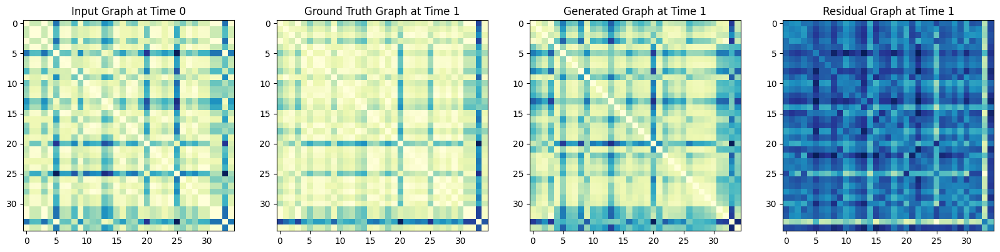

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.0027223758


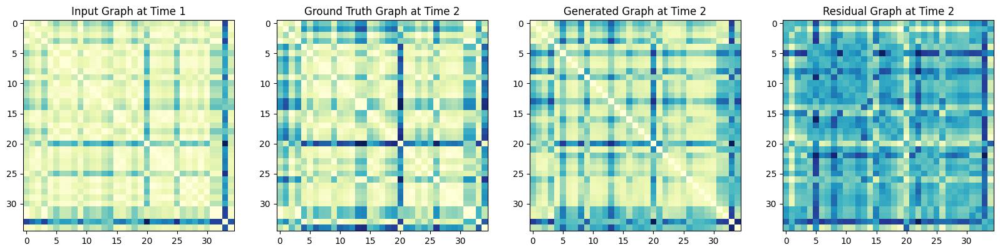

Mean Squared Error between ground truth graphs:  0.0046917056


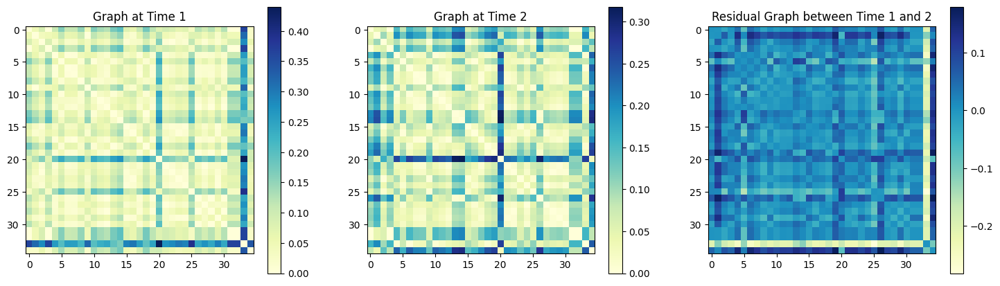

Mean Squared Error between generated graphs:  1.1632286e-06


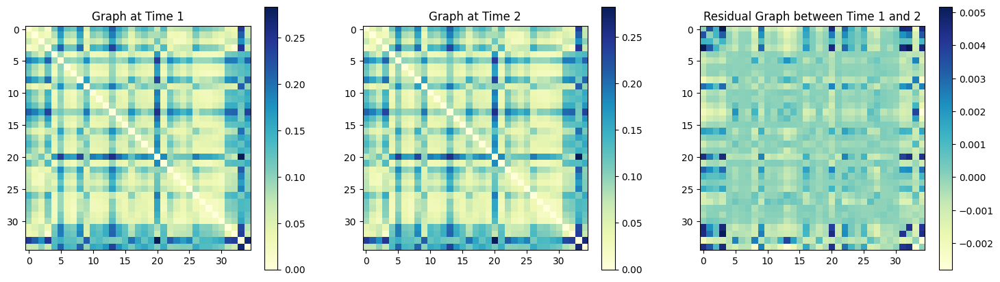

MAE:  0.04708112
Average Frobenius distance: 2.338164
Average Jaccard distance: 0.010330636044005125
Average MAE global efficiency: 0.005042016806722671
Average MAE local efficiency: 0.004736440030557398
Average MAE betweenness centrality: 0.10039978219337463
Average MAE eigenvector centrality: 0.024406536414400326


In [38]:
set_seed(42)
trainablegcesn_transformer_oasis = trainableGCESNTransformer(oasis_num_nodes, oasis_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
trainablegcesn_transformer_oasis.load_state_dict(torch.load('models/trainablegcesn_transformer_oasis.pth'))   
inference_model(trainablegcesn_transformer_oasis.to(device), oasis_features_test.to(device), oasis_adj_test.to(device), sample_idx=1)
evaluate_model(trainablegcesn_transformer_oasis.to(device), oasis_features_test.to(device), oasis_adj_test.to(device))

### EMCI-AD

#### 3-Fold CV

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 8)
    (bn0): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=8, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=16, bias=True)
    (fc): Linear(in_features=560, out_features=16, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=16, out_features=560, bias=True)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=16, out_features=8, bias=True)
    (fc2): Linear(in_features=8, out_features=35, bias=True)
  )
)
Total number of trainable parameters: 20139


Fold 1/3


/tmp/ipykernel_101/2217342123.py:179: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features, dtype=torch.float32)
/tmp/ipykernel_101/2217342123.py:180: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  adj = torch.tensor(adj, dtype=torch.float32)


Epoch 1
  Training -> Loss: 6317.4184, Generative Loss: 532.5313, Topological Loss: 5115.0774
  Validation -> Loss: 6789.6855, Generative Loss: 509.4161, Topological Loss: 5792.4551
Time: 0.33s, CPU: 15.90%, Memory: 4.34GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 1279.7410, Generative Loss: 295.7977, Topological Loss: 832.7187
  Validation -> Loss: 7960.1475, Generative Loss: 576.0748, Topological Loss: 6836.7091
Time: 0.30s, CPU: 11.70%, Memory: 4.34GB, GPU: 0.02GB, GPU Util: 8.50%
Epoch 3
  Training -> Loss: 1645.4256, Generative Loss: 271.7661, Topological Loss: 1261.0855
  Validation -> Loss: 5482.2694, Generative Loss: 462.2149, Topological Loss: 4650.1592
Time: 0.28s, CPU: 16.15%, Memory: 4.34GB, GPU: 0.02GB, GPU Util: 9.00%
Epoch 4
  Training -> Loss: 1099.9951, Generative Loss: 234.3480, Topological Loss: 783.8574
  Validation -> Loss: 3186.9008, Generative Loss: 345.2336, Topological Loss: 2643.9153
Time: 0.31s, CPU: 13.55%, Memory: 4.34GB, GPU: 0.02GB, GPU Ut

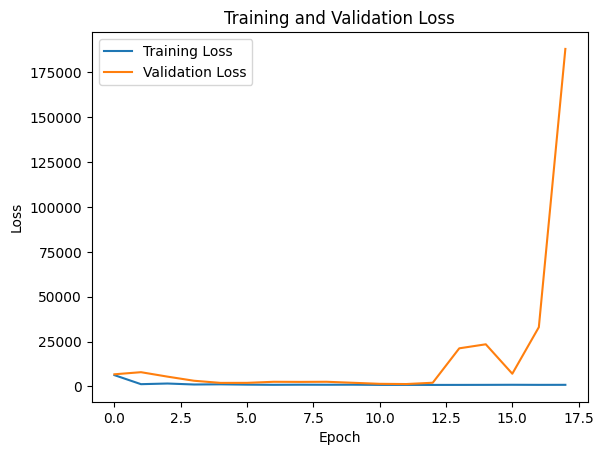

Model saved to models/trainablegcesn_transformer_emci.pth
Fold 1 Results:
   MAE: 0.257850706577301
   Average Frobenius distance: 11.967147827148438
   Average MAE node strength: 4.528088130960006
   Average MAE clustering coefficient: 0.07303062709066604
   Average MAE betweenness centrality: 0.08784763905562223
   Average MAE eigenvector centrality: 0.010743927212731551

Fold 2/3
Epoch 1
  Training -> Loss: 6686.7953, Generative Loss: 560.2388, Topological Loss: 5365.6753
  Validation -> Loss: 1612.9825, Generative Loss: 421.1286, Topological Loss: 693.2592
Time: 0.32s, CPU: 15.60%, Memory: 3.87GB, GPU: 0.02GB, GPU Util: 4.00%
Epoch 2
  Training -> Loss: 1357.7058, Generative Loss: 334.3530, Topological Loss: 763.4154
  Validation -> Loss: 2021.0033, Generative Loss: 312.4394, Topological Loss: 1555.3459
Time: 0.31s, CPU: 12.05%, Memory: 3.87GB, GPU: 0.02GB, GPU Util: 8.50%
Epoch 3
  Training -> Loss: 1048.3839, Generative Loss: 241.8146, Topological Loss: 720.6170
  Validation -> L

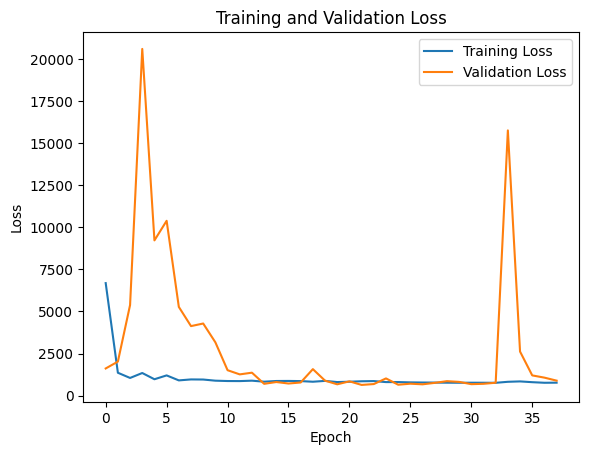

Model saved to models/trainablegcesn_transformer_emci.pth
Fold 2 Results:
   MAE: 0.1732187122106552
   Average Frobenius distance: 8.373299598693848
   Average MAE node strength: 2.690032700090932
   Average MAE clustering coefficient: 0.044034060056373184
   Average MAE betweenness centrality: 0.0948884361825538
   Average MAE eigenvector centrality: 0.010509698979475617

Fold 3/3
Epoch 1
  Training -> Loss: 6330.5593, Generative Loss: 539.9015, Topological Loss: 5140.7996
  Validation -> Loss: 1557.3929, Generative Loss: 393.3594, Topological Loss: 817.5050
Time: 0.37s, CPU: 25.80%, Memory: 3.87GB, GPU: 0.02GB, GPU Util: 3.50%
Epoch 2
  Training -> Loss: 1461.3697, Generative Loss: 308.8610, Topological Loss: 984.0510
  Validation -> Loss: 12457.2409, Generative Loss: 587.9742, Topological Loss: 11126.9189
Time: 0.38s, CPU: 47.40%, Memory: 3.87GB, GPU: 0.02GB, GPU Util: 7.00%
Epoch 3
  Training -> Loss: 1349.9330, Generative Loss: 270.2941, Topological Loss: 972.1167
  Validation ->

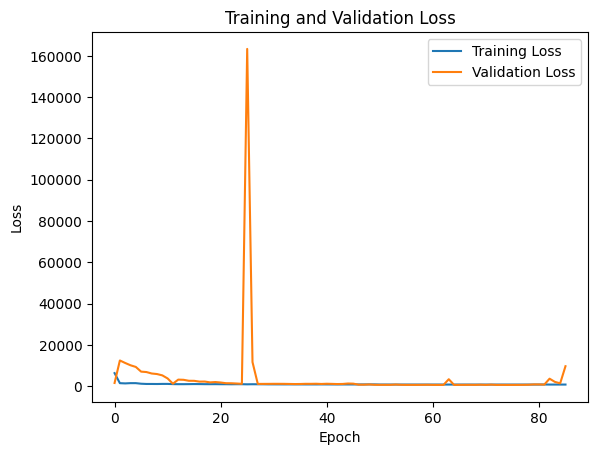

Model saved to models/trainablegcesn_transformer_emci.pth
Fold 3 Results:
   MAE: 0.20333810150623322
   Average Frobenius distance: 11.460827827453613
   Average MAE node strength: 2.7593109444869475
   Average MAE clustering coefficient: 0.061144824452700766
   Average MAE betweenness centrality: 0.09105342463230232
   Average MAE eigenvector centrality: 0.014893950367599301

Cross-Validation Results:
mae: Mean = 0.2115, Std = 0.04
frobenius_distance: Mean = 10.6004, Std = 1.59
mae_ns: Mean = 3.3258, Std = 0.85
mae_cc: Mean = 0.0594, Std = 0.01
mae_bc: Mean = 0.0913, Std = 0.00
mae_ec: Mean = 0.0120, Std = 0.00
epochs: Mean = 47.3333, Std = 28.53
training_times: Mean = 15.6391, Std = 10.02
avg_memory_usage: Mean = 4.0245, Std = 0.22
avg_gpu_usage: Mean = 0.0165, Std = 0.00
max_memory_usage: Mean = 4.0245, Std = 0.22
max_gpu_usage: Mean = 0.0165, Std = 0.00


In [18]:
set_seed(42)
trainablegcesn_transformer_emci = trainableGCESNTransformer(emci_num_nodes, emci_num_features, latent_dim=16, 
                                        encoder_hidden_dims=8, encoder_leaky_rate=1, encoder_iteration=2,
                                        decoder_hidden_dims=8, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_emci)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_emci.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(trainablegcesn_transformer_emci, emci_features_train, emci_adj_train,  
    lr=0.03, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
    save_path='models/trainablegcesn_transformer_emci.pth', is_esn=True)

#### Simple Train-Test

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=16, out_features=32, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=32, out_features=32, bias=True)
    )
    (fc): Linear(in_features=1120, out_features=32, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=32, out_features=1120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=32, out_features=16, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=16, out_features=35, bias=True)
    )
  )
)
Total number of trainable parameters: 78387

Epoch 1
  Training -> Loss: 6286.5421, Generative Loss: 533.6654, Topological Loss: 5103.

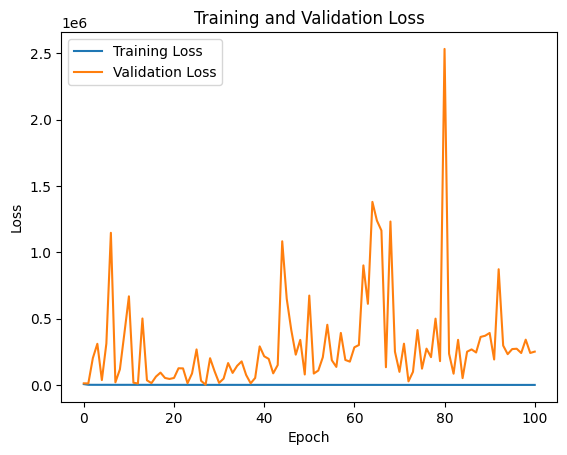

Model saved to models/trainablegcesn_transformer_emci.pth
Average Time per Epoch: 0.61s
Average CPU Usage: 20.61%
Average Memory Usage: 3.35GB
Average GPU Usage: 0.02GB
Average GPU Utilization: 9.42%

Total Training Time: 61.61s
Max CPU Usage: 57.50%
Max Memory Usage: 3.35GB
Max GPU Usage: 0.02GB
Max GPU Utilization: 11.50%


In [41]:
set_seed(42)
trainablegcesn_transformer_emci = trainableGCESNTransformer(emci_num_nodes, emci_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_emci)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_emci.count_parameters())}\n")

train(trainablegcesn_transformer_emci, emci_features_train.to(device), emci_adj_train.to(device),  
    emci_features_val.to(device), emci_adj_val.to(device), lr=0.005, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/trainablegcesn_transformer_emci.pth', is_esn=True)

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.2202972


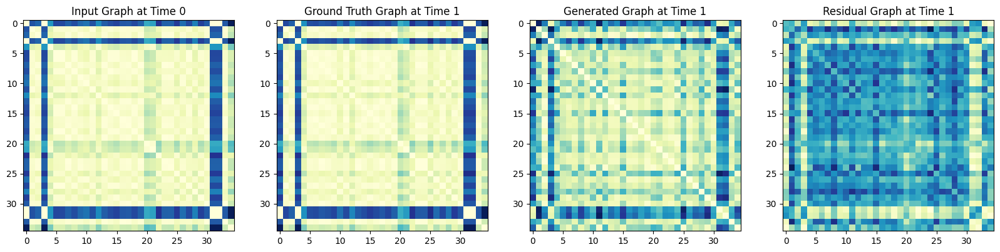

MAE:  1.9100243
Average Frobenius distance: 85.26904
Average Jaccard distance: 0.09020254621373167
Average MAE global efficiency: 0.005042016806722671
Average MAE local efficiency: 0.004736440030557398
Average MAE betweenness centrality: 0.28213425976451184
Average MAE eigenvector centrality: 0.027006761836515934


In [42]:
set_seed(42)
trainablegcesn_transformer_emci = trainableGCESNTransformer(emci_num_nodes, emci_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=1, decoder_iteration=1)
trainablegcesn_transformer_emci.load_state_dict(torch.load('models/trainablegcesn_transformer_emci.pth'))   
inference_model(trainablegcesn_transformer_emci.to(device), emci_features_test.to(device), emci_adj_test.to(device), sample_idx=1)
evaluate_model(trainablegcesn_transformer_emci.to(device), emci_features_test.to(device), emci_adj_test.to(device))

### SLIM160

#### 3-Fold CV

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 32)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=32, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=64, bias=True)
    (fc): Linear(in_features=10240, out_features=64, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=64, out_features=10240, bias=True)
    (bn0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc1): Linear(in_features=64, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=160, bias=True)
  )
)
Total number of trainable parameters: 1345440


Fold 1/3
Epoch 1
  Training -> Loss: 30867.7622, Generative Loss: 3862.2049, Topological Loss: 26066.6943
  Validation -> Loss: 32077.6200, Generative Loss: 3484.0241, Topological Loss: 27807.9797
Time: 4.40s, CPU: 41.25%, Memory: 4.25GB, GPU: 0.05GB, GPU Uti

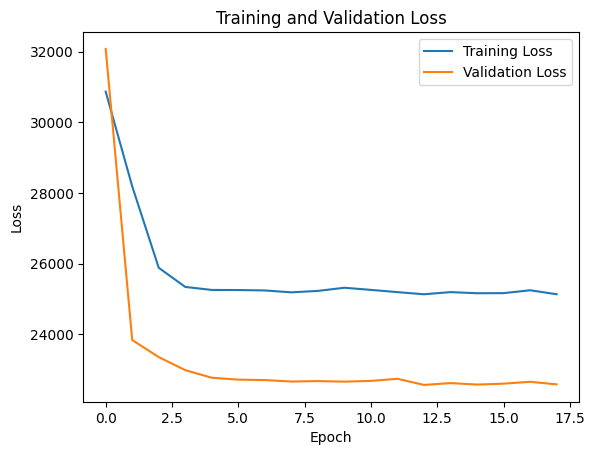

Model saved to models/trainablegcesn_transformer_slim160.pth
Fold 1 Results:
   MAE: 0.14710228145122528
   Average Frobenius distance: 28.595808029174805
   Average MAE node strength: 9.030276645484724
   Average MAE clustering coefficient: 0.4695368041352517
   Average MAE betweenness centrality: 0.027188075569598735
   Average MAE eigenvector centrality: 0.022838543663518555

Fold 2/3
Epoch 1
  Training -> Loss: 44341.0051, Generative Loss: 4092.3914, Topological Loss: 39170.9586
  Validation -> Loss: 21513.5336, Generative Loss: 3466.7086, Topological Loss: 17291.4648
Time: 3.15s, CPU: 35.45%, Memory: 4.03GB, GPU: 0.05GB, GPU Util: 4.50%
Epoch 2
  Training -> Loss: 35688.8094, Generative Loss: 3757.7383, Topological Loss: 31031.4479
  Validation -> Loss: 15839.4238, Generative Loss: 3420.9888, Topological Loss: 11721.8033
Time: 4.38s, CPU: 33.05%, Memory: 4.03GB, GPU: 0.06GB, GPU Util: 10.50%
Epoch 3
  Training -> Loss: 33628.8699, Generative Loss: 3711.8417, Topological Loss: 2904

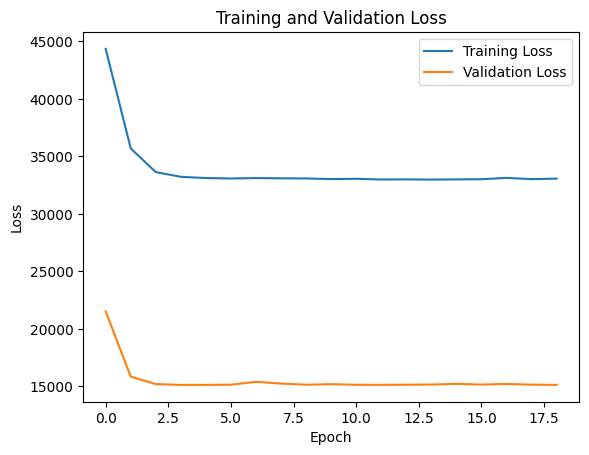

Model saved to models/trainablegcesn_transformer_slim160.pth
Fold 2 Results:
   MAE: 0.13738393783569336
   Average Frobenius distance: 26.777462005615234
   Average MAE node strength: 7.477528692539007
   Average MAE clustering coefficient: 0.3956076482669665
   Average MAE betweenness centrality: 0.03327517962343763
   Average MAE eigenvector centrality: 0.024333900102829997

Fold 3/3
Epoch 1
  Training -> Loss: 36613.2738, Generative Loss: 3982.1308, Topological Loss: 31609.3998
  Validation -> Loss: 27843.0356, Generative Loss: 3325.4059, Topological Loss: 23768.9147
Time: 10.63s, CPU: 53.05%, Memory: 4.24GB, GPU: 0.05GB, GPU Util: 1.50%
Epoch 2
  Training -> Loss: 29870.4705, Generative Loss: 3719.6423, Topological Loss: 25275.5811
  Validation -> Loss: 19609.5519, Generative Loss: 3344.1866, Topological Loss: 15591.7038
Time: 10.27s, CPU: 49.70%, Memory: 4.24GB, GPU: 0.06GB, GPU Util: 3.00%
Epoch 3
  Training -> Loss: 28678.8537, Generative Loss: 3658.8842, Topological Loss: 2417

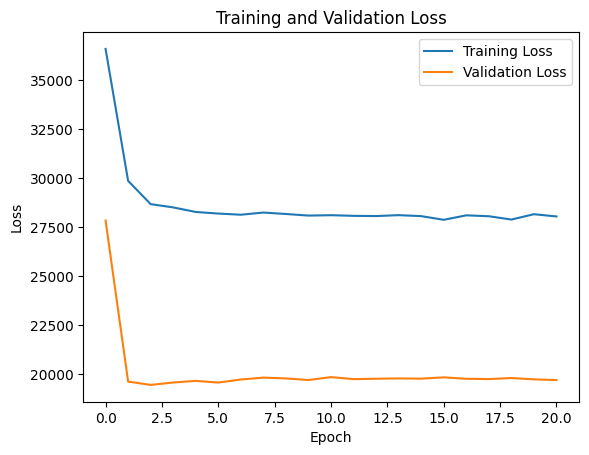

Model saved to models/trainablegcesn_transformer_slim160.pth
Fold 3 Results:
   MAE: 0.14316090941429138
   Average Frobenius distance: 27.789201736450195
   Average MAE node strength: 8.48129957663389
   Average MAE clustering coefficient: 0.37983146207061785
   Average MAE betweenness centrality: 0.03432628978916222
   Average MAE eigenvector centrality: 0.022415484726004378

Cross-Validation Results:
mae: Mean = 0.1425, Std = 0.00
frobenius_distance: Mean = 27.7208, Std = 0.74
mae_ns: Mean = 8.3297, Std = 0.64
mae_cc: Mean = 0.4150, Std = 0.04
mae_bc: Mean = 0.0316, Std = 0.00
mae_ec: Mean = 0.0232, Std = 0.00
epochs: Mean = 19.3333, Std = 1.25
training_times: Mean = 104.0728, Std = 3.14
avg_memory_usage: Mean = 4.1715, Std = 0.10
avg_gpu_usage: Mean = 0.0582, Std = 0.00
max_memory_usage: Mean = 4.1715, Std = 0.10
max_gpu_usage: Mean = 0.0586, Std = 0.00


In [28]:
set_seed(42)
trainablegcesn_transformer_slim160 = trainableGCESNTransformer(slim160_num_nodes, slim160_num_features, latent_dim=64, 
                                        encoder_hidden_dims=32, encoder_leaky_rate=1, encoder_iteration=3,
                                        decoder_hidden_dims=32, decoder_leaky_rate=1, decoder_iteration=1)
print(trainablegcesn_transformer_slim160)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_slim160.count_parameters())}\n")

avg_metrics, std_values = train_test_cv(trainablegcesn_transformer_slim160, slim160_features, slim160_adj, 
                lr=0.005, num_epochs=100, patience=5, step_size=50, gamma=0.5, 
                save_path='models/trainablegcesn_transformer_slim160.pth', is_esn=True)

#### Simple Train-Test

trainableGCESNTransformer(
  (encoder): trainableGCESNEncoder(
    (gat): GAT (8 -> 16)
    (bn0): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=16, out_features=32, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=32, out_features=32, bias=True)
    )
    (fc): Linear(in_features=5120, out_features=32, bias=True)
  )
  (decoder): trainableGCESNDecoder(
    (fc): Linear(in_features=32, out_features=5120, bias=True)
    (bn0): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (ridge_layer_1): RidgeLayer(
      (linear): Linear(in_features=32, out_features=16, bias=True)
    )
    (ridge_layer_2): RidgeLayer(
      (linear): Linear(in_features=16, out_features=160, bias=True)
    )
  )
)
Total number of trainable parameters: 340512

Epoch 1
  Training -> Loss: 49463.6420, Generative Loss: 4209.2987, Topological Loss: 4

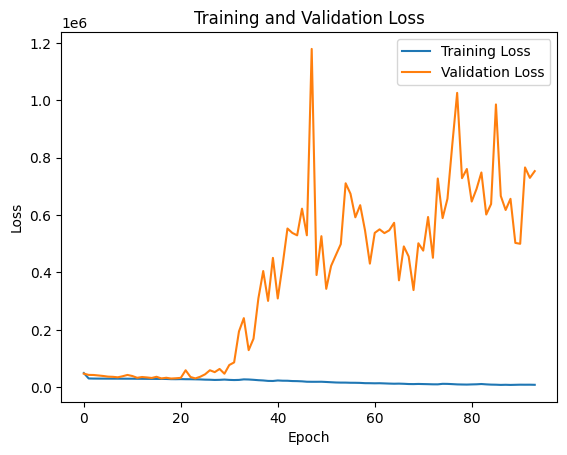

Model saved to models/trainablegcesn_transformer_slim160.pth
Average Time per Epoch: 2.24s
Average CPU Usage: 21.64%
Average Memory Usage: 3.35GB
Average GPU Usage: 0.10GB
Average GPU Utilization: 9.96%

Total Training Time: 210.53s
Max CPU Usage: 37.20%
Max Memory Usage: 3.35GB
Max GPU Usage: 0.10GB
Max GPU Utilization: 11.50%


In [19]:
set_seed(42)
trainablegcesn_transformer_slim160 = trainableGCESNTransformer(slim160_num_nodes, slim160_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=0.9, encoder_iteration=2,
                                        decoder_hidden_dims=16, decoder_leaky_rate=0.9, decoder_iteration=2)
print(trainablegcesn_transformer_slim160)
print(f"Total number of trainable parameters: {(trainablegcesn_transformer_slim160.count_parameters())}\n")

train(trainablegcesn_transformer_slim160, slim160_features_train.to(device), slim160_adj_train.to(device),  
    slim160_features_val.to(device), slim160_adj_val.to(device), lr=0.001, num_epochs=200, 
    patience=5, step_size=50, gamma=0.5, save_path='models/trainablegcesn_transformer_slim160.pth', is_esn=True)

Mean Squared Error between predicted (t1) and ground truth graphs (t0):  0.051023547


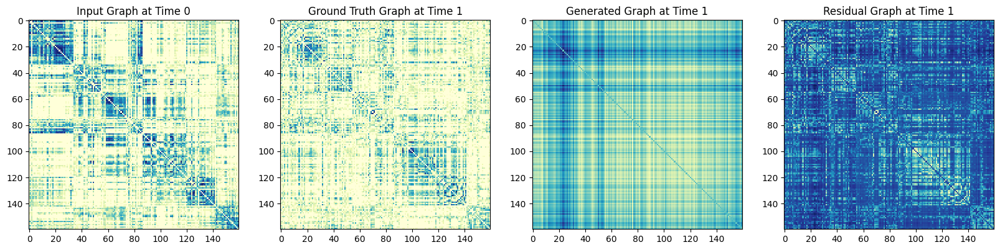

Mean Squared Error between predicted (t2) and ground truth graphs (t1):  0.051482815


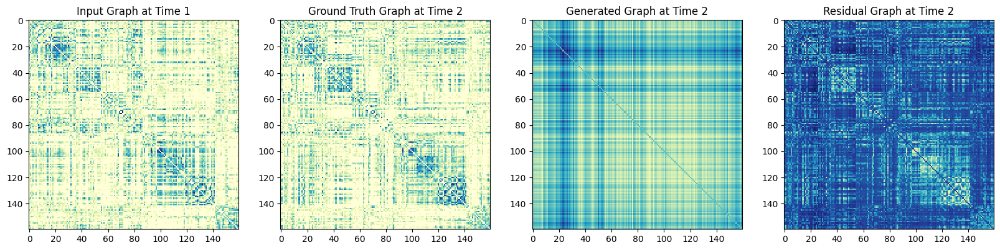

Mean Squared Error between ground truth graphs:  0.024009747


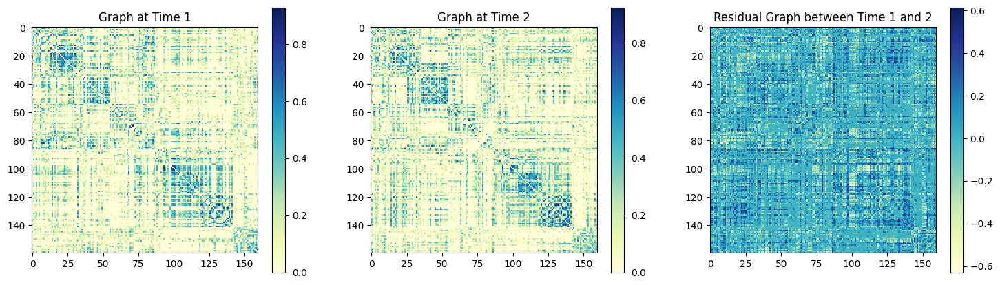

Mean Squared Error between generated graphs:  2.0317883e-09


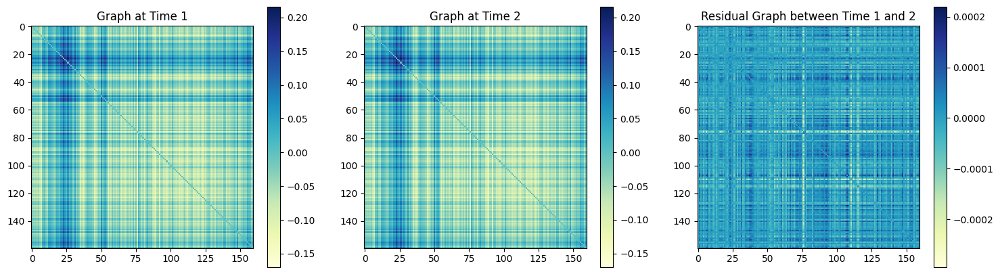

KeyboardInterrupt: 

In [21]:
set_seed(42)
trainablegcesn_transformer_slim160 = trainableGCESNTransformer(slim160_num_nodes, slim160_num_features, latent_dim=32, 
                                        encoder_hidden_dims=16, encoder_leaky_rate=1, encoder_iteration=1,
                                        decoder_hidden_dims=16, decoder_leaky_rate=0.9, decoder_iteration=1)
trainablegcesn_transformer_slim160.load_state_dict(torch.load('models/trainablegcesn_transformer_slim160.pth'))   
inference_model(trainablegcesn_transformer_slim160.to(device), slim160_features_test.to(device), slim160_adj_test.to(device), sample_idx=1)
evaluate_model(trainablegcesn_transformer_slim160.to(device), slim160_features_test.to(device), slim160_adj_test.to(device))